# Check Data

In [1]:
# Check if all files in the data folder
import os
import re
import pandas as pd

data_folder = '..\\data\\raw'
years = ['2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023', '2024']
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

for year in years:
    for month in months:
        filename = f'{month}_{year}.csv'
        if not os.path.exists(os.path.join(data_folder, filename)):
            print(f'{filename} not found in {year}')




November_2024.csv not found in 2024
December_2024.csv not found in 2024


# Loading Data


,Date,Hour,Bourke Street Mall (North),Bourke Street Mall (South),Melbourne Central,Town Hall (West),Princes Bridge,Flinders Street Station Underpass,Birrarung Marr,Webb Bridge,...,William St - Little Lonsdale St (West),La Trobe St - William St (South),114 Flinders St,Birrarung Marr East - Batman Ave Bridge Entry,474 Flinders St,Hamer Hall - River Side,Cnr Bourke St and Harbour Esplanade,Flinders Walk - Sandridge Bridge,Birrarung Mar - Federation Bridge,Boyd Park
0,01/01/2024,0,984,703,3301,3304,0,1094,0,1430,...,2126,2157,1580,146,0,2047,318,161,319,0
1,01/01/2024,1,757,473,4371,2964,0,768,0,337,...,652,541,929,16,0,2917,116,224,136,0
2,01/01/2024,2,268,220,1967,1360,0,2062,0,56,...,235,198,278,0,0,716,42,185,32,0
3,01/01/2024,3,143,97,1020,563,0,1567,0,13,...,144,136,89,4,0,119,11,32,8,0
4,01/01/2024,4,87,36,543,294,0,826,0,7,...,69,48,28,0,0,49,1,25,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
739,31/01/2024,19,1022,340,1712,1469,1436,1356,167,204,...,373,219,277,21,210,619,66,107,137,161
740,31/01/2024,20,603,302,1474,1023,1339,1200,89,290,...,270,210,248,14,172,596,27,85,70,132
741,31/01/2024,21,438,175,1211,943,1132,1039,67,123,...,211,172,193,1,203,347,19,51,14,0
742,31/01/2024,22,210,139,778,601,661,805,55,64,...,180,116,199,1,133,170,9,33,4,0


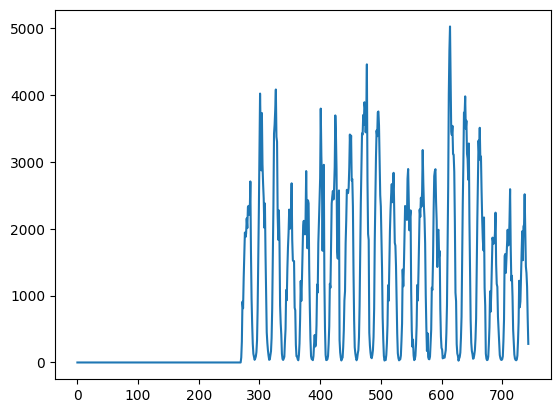

In [2]:
df_test = pd.read_csv('../data/raw/January_2024.csv')
df_test

# Plot for Princes Bridge	
df_test['Princes Bridge'].plot()
df_test

In [3]:
import os
import pandas as pd

# Initialize a dictionary to store data information
file_data = {}

data_folder = '..\\data\\raw'
years = ['2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023', '2024']
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

# Dictionary to store the data
all_data = []
column_appearance_count = {}
missing_data_summary = {}

# Load all datasets
for year in years:
    for month in months:
        filename = f'{month}_{year}.csv'
        file_path = os.path.join(data_folder, filename)
        if os.path.exists(file_path):
            try:
                df = pd.read_csv(file_path)
                all_data.append((filename, year, df))
                
                # Count column appearances
                for col in df.columns:
                    column_appearance_count[col] = column_appearance_count.get(col, 0) + 1
                
                # Track missing data per year per column
                if year not in missing_data_summary:
                    missing_data_summary[year] = {}
                
                for col in df.columns:
                    missing_data_summary[year][col] = missing_data_summary[year].get(col, 0) + df[col].isna().sum()
            
            except Exception as e:
                print(f"Error loading {filename}: {e}")
        else:
            print(f'{filename} not found in {year}')

# Summary of all columns and their appearance counts
columns_df = pd.DataFrame({
    "Column Name": column_appearance_count.keys(),
    "Appearance Count": column_appearance_count.values()
})

# Summary of missing data per year
missing_data_avg = {
    col: {year: missing_data_summary[year].get(col, 0) / 12 for year in missing_data_summary}
    for col in column_appearance_count
}

# Create DataFrame for missing data averages
missing_data_df = pd.DataFrame(missing_data_avg).T
missing_data_df.columns = [f"Avg Missing {year}" for year in missing_data_summary.keys()]

# Combine summaries
columns_summary = pd.concat([columns_df.set_index("Column Name"), missing_data_df], axis=1)

columns_summary.sort_values("Appearance Count", ascending=False, inplace=True)

columns_summary.head(20)

November_2024.csv not found in 2024
December_2024.csv not found in 2024


,Appearance Count,Avg Missing 2013,Avg Missing 2014,Avg Missing 2015,Avg Missing 2016,Avg Missing 2017,Avg Missing 2018,Avg Missing 2019,Avg Missing 2020,Avg Missing 2021,Avg Missing 2022,Avg Missing 2023,Avg Missing 2024
Date,142,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Victoria Point,142,0.083333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Spencer St-Collins St (South),142,486.083333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Spencer St-Collins St (North),142,486.083333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Flinders St-Elizabeth St (East),142,486.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Birrarung Marr,142,0.000000,46.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Sandridge Bridge,142,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Princes Bridge,142,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Webb Bridge,142,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Waterfront City,142,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
import os
import pandas as pd
import matplotlib.pyplot as plt
data_folder = '..\\data\\raw'
years = ['2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023', '2024']
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']



## Checking for Missing Data for seleceted date range

### Checking for NA

In [5]:
import os
import pandas as pd
import os
import pandas as pd
import matplotlib.pyplot as plt
data_folder = '..\\data\\raw'
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
years = ['2022', '2023', '2024']

# Initialize a dictionary to store data information
file_data = {}

# Dictionary to store the data
all_data = []
column_appearance_count = {}
missing_data_summary = {}

# Load all datasets
for year in years:
    for month in months:
        filename = f'{month}_{year}.csv'
        file_path = os.path.join(data_folder, filename)
        if os.path.exists(file_path):
            try:
                df = pd.read_csv(file_path)
                all_data.append((filename, year, df))
                
                # Count column appearances
                for col in df.columns:
                    column_appearance_count[col] = column_appearance_count.get(col, 0) + 1
                
                # Track missing data per year per column
                if year not in missing_data_summary:
                    missing_data_summary[year] = {}
                
                for col in df.columns:
                    missing_data_summary[year][col] = missing_data_summary[year].get(col, 0) + df[col].isna().sum()
            
            except Exception as e:
                print(f"Error loading {filename}: {e}")
        else:
            print(f'{filename} not found in {year}')

# Summary of all columns and their appearance counts
columns_df = pd.DataFrame({
    "Column Name": column_appearance_count.keys(),
    "Appearance Count": column_appearance_count.values()
})



# Summary of missing data per year
missing_data_avg = {
    col: {year: missing_data_summary[year].get(col, 0) / 12 for year in missing_data_summary}
    for col in column_appearance_count
}

# Create DataFrame for missing data averages
missing_data_df = pd.DataFrame(missing_data_avg).T
missing_data_df.columns = [f"Avg Missing {year}" for year in missing_data_summary.keys()]

# Combine summaries
columns_summary = pd.concat([columns_df.set_index("Column Name"), missing_data_df], axis=1)

columns_summary.sort_values("Appearance Count", ascending=False, inplace=True)

columns_summary.head(5)

November_2024.csv not found in 2024
December_2024.csv not found in 2024


,Appearance Count,Avg Missing 2022,Avg Missing 2023,Avg Missing 2024
Date,34,0.0,0.0,0.0
Little Collins St-Swanston St (East),34,0.0,0.0,0.0
QVM-Franklin St (North),34,0.0,0.0,0.0
QVM-Therry St (South),34,0.0,0.0,0.0
QVM-Queen St (East),34,0.0,0.0,0.0


### Select only when apearing in all data

In [6]:
# Give all keays with apearance coun 70, except for date and Hour:
list_70 = columns_summary[(columns_summary['Appearance Count'] == 34) & (~columns_summary.index.isin(['Date', 'Hour']))].index.tolist()

filtered_columns_summary = columns_summary.loc[list_70]
filtered_columns_summary.sort_values("Appearance Count", ascending=False, inplace=True)
filtered_columns_summary.tail(5)

,Appearance Count,Avg Missing 2022,Avg Missing 2023,Avg Missing 2024
231 Bourke St,34,0.0,0.0,0.0
La Trobe St (North),34,0.0,0.0,0.0
RMIT Building 14,34,0.0,0.0,0.0
Bourke St - Spencer St (North),34,0.0,0.0,0.0
QV Market-Elizabeth St (West),34,0.0,0.0,0.0


### Checking for zero values

list_70

November_2024.csv not found
December_2024.csv not found


C:\Users\Biebert\AppData\Local\Temp\ipykernel_25108\3123640117.py:32: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  combined_data['Datetime'] = pd.to_datetime(


Date


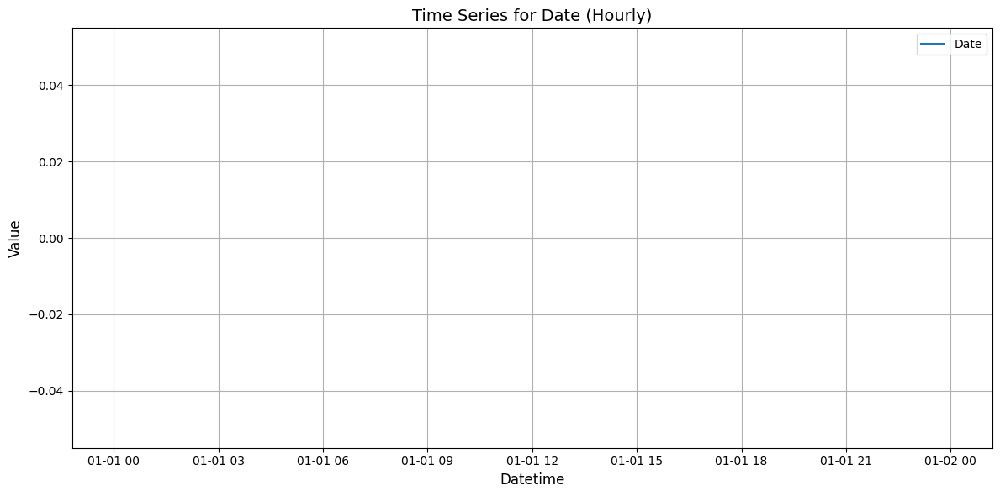

Hour


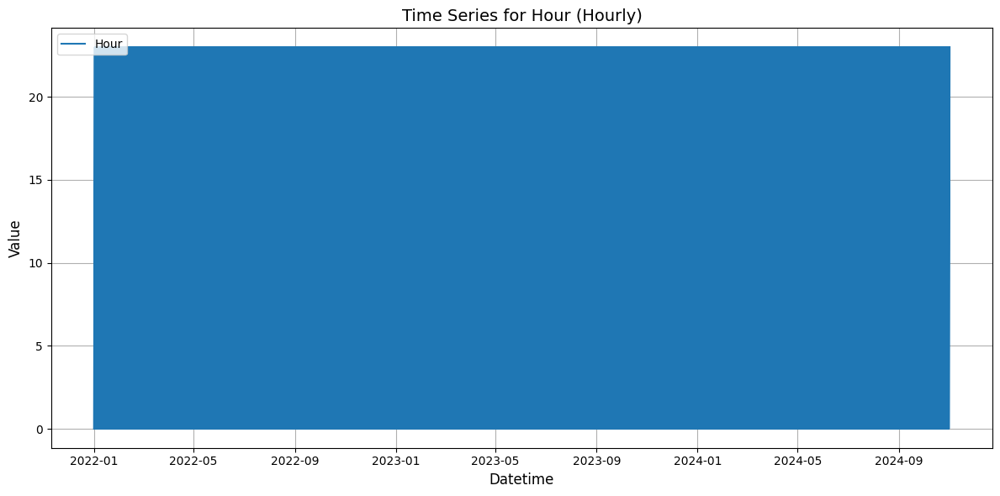

Bourke Street Mall (North)


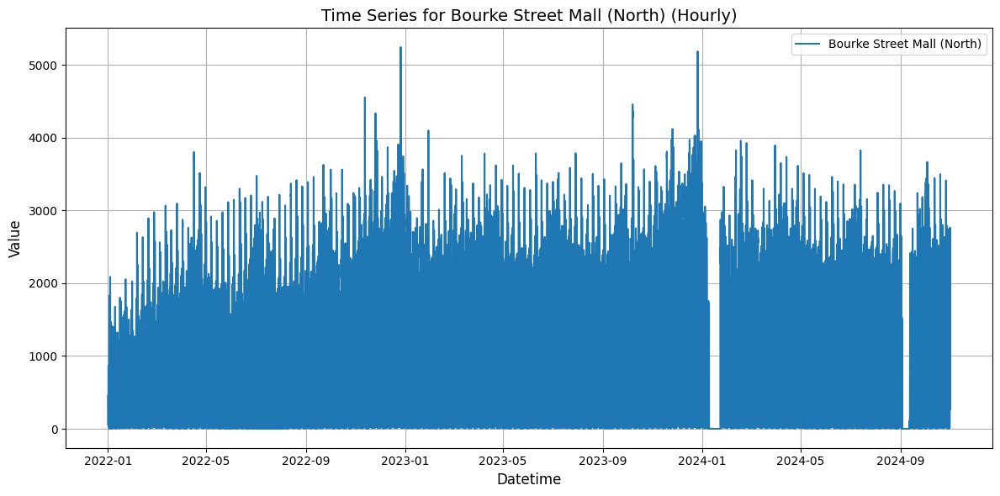

Bourke Street Mall (South)


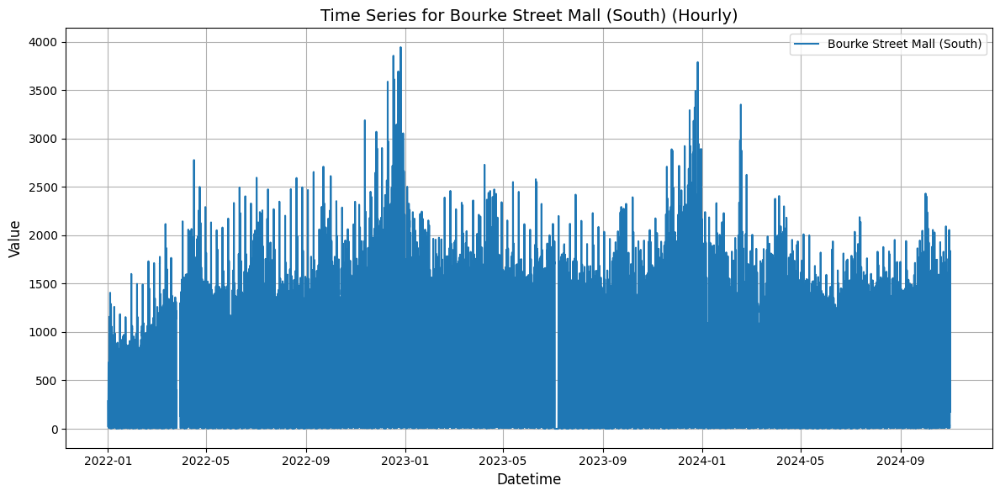

Melbourne Central


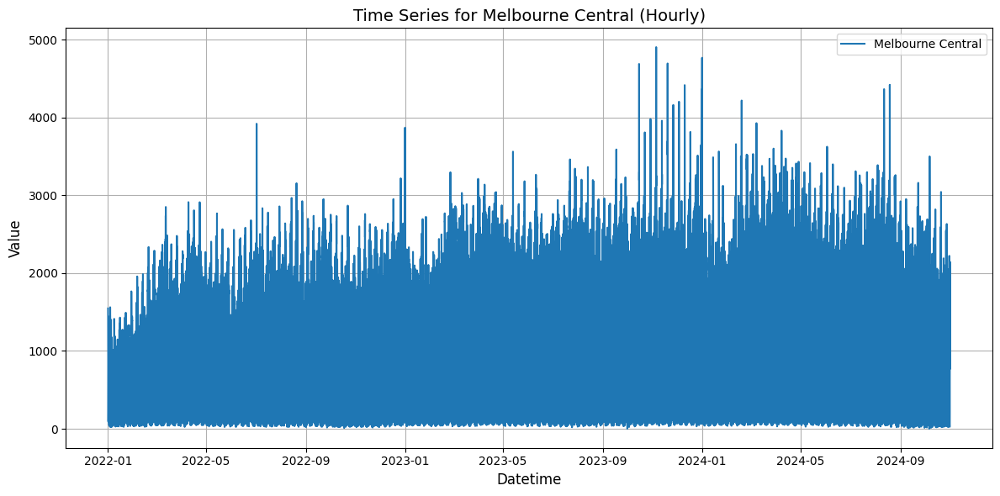

Town Hall (West)


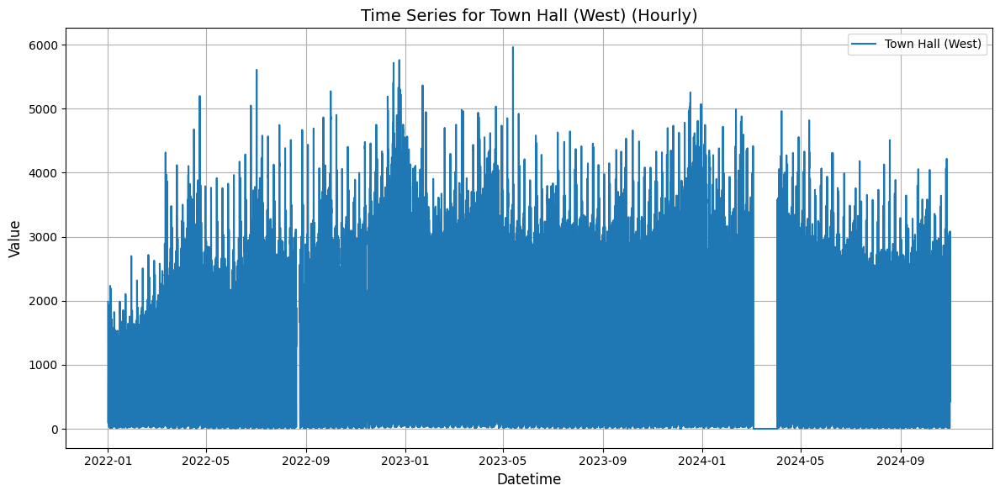

Princes Bridge


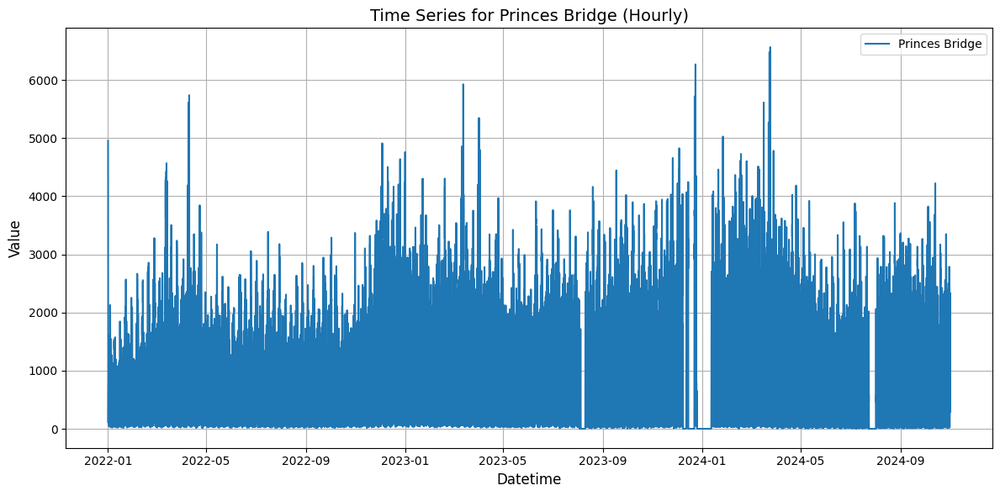

Flinders Street Station Underpass


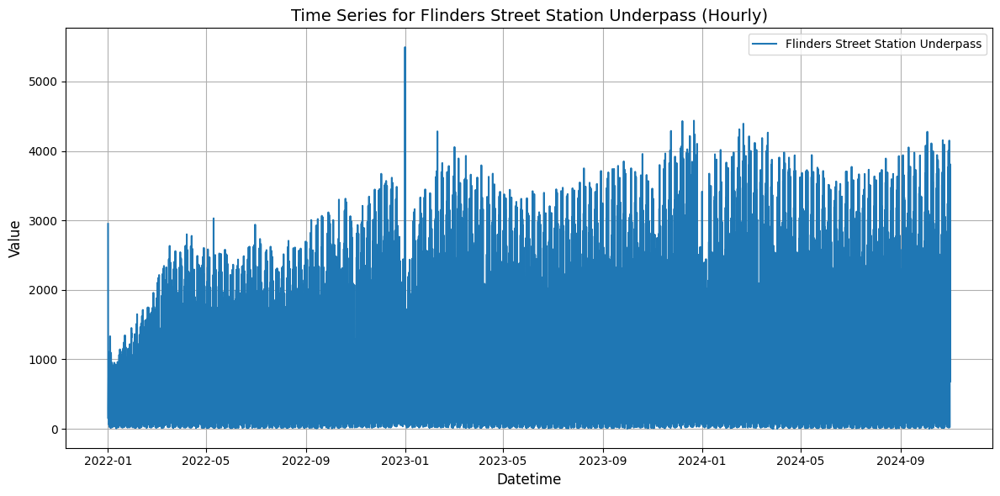

Birrarung Marr


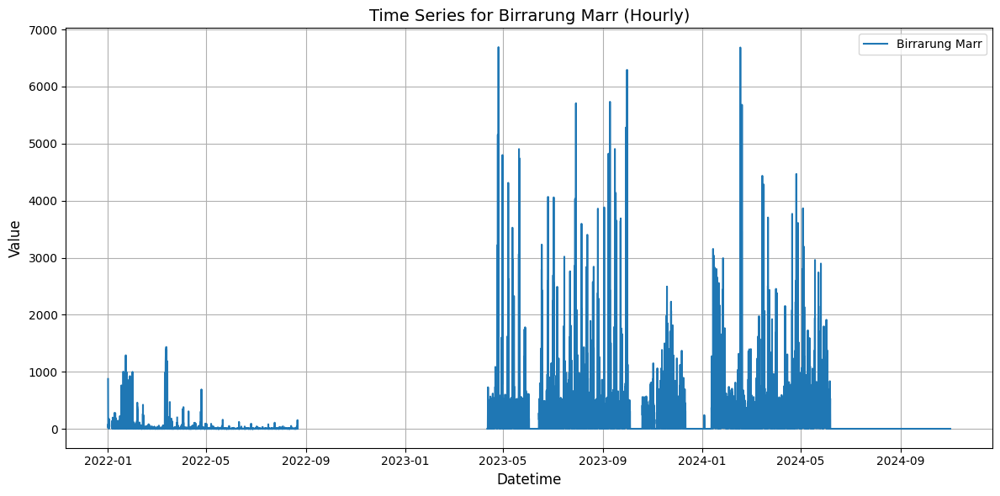

Webb Bridge


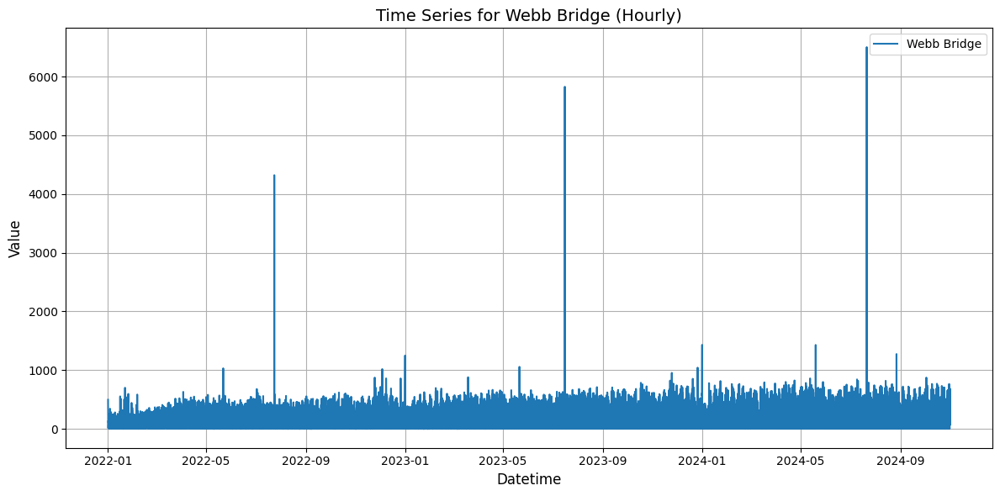

Southern Cross Station


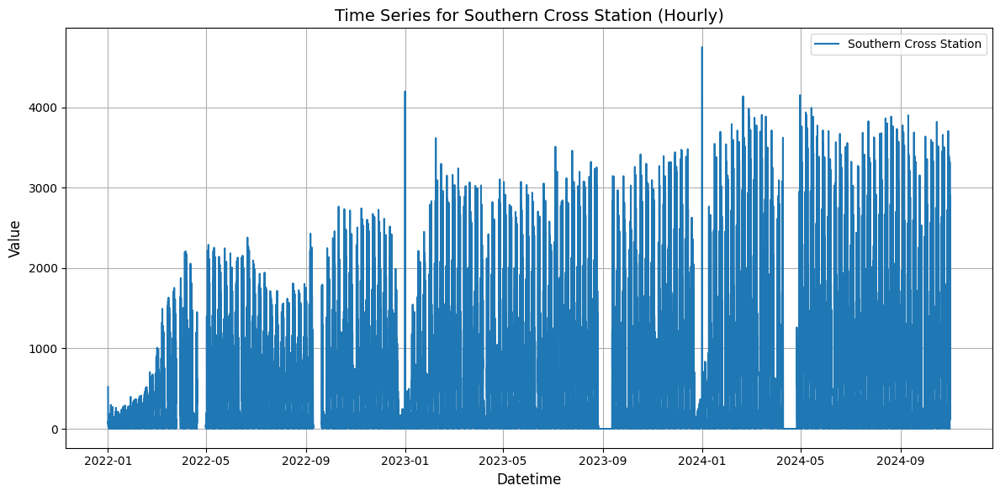

Victoria Point


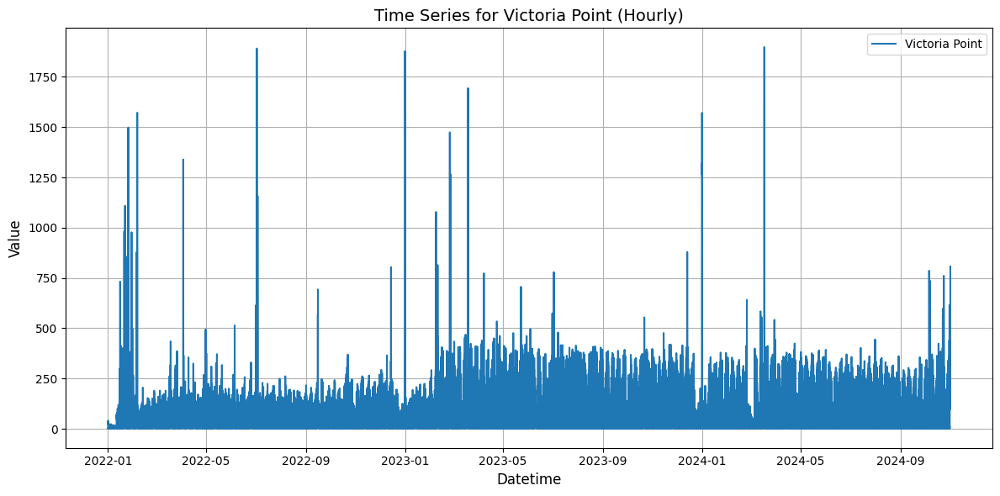

Waterfront City


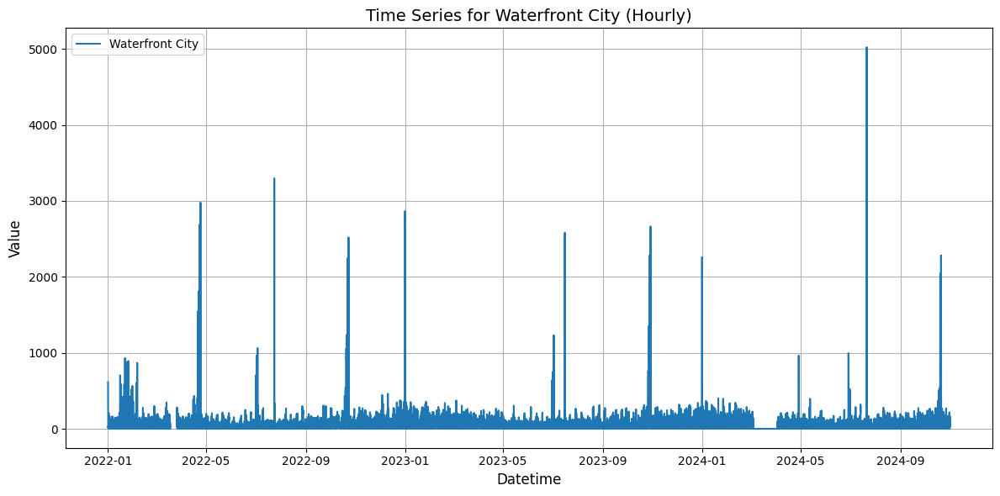

New Quay


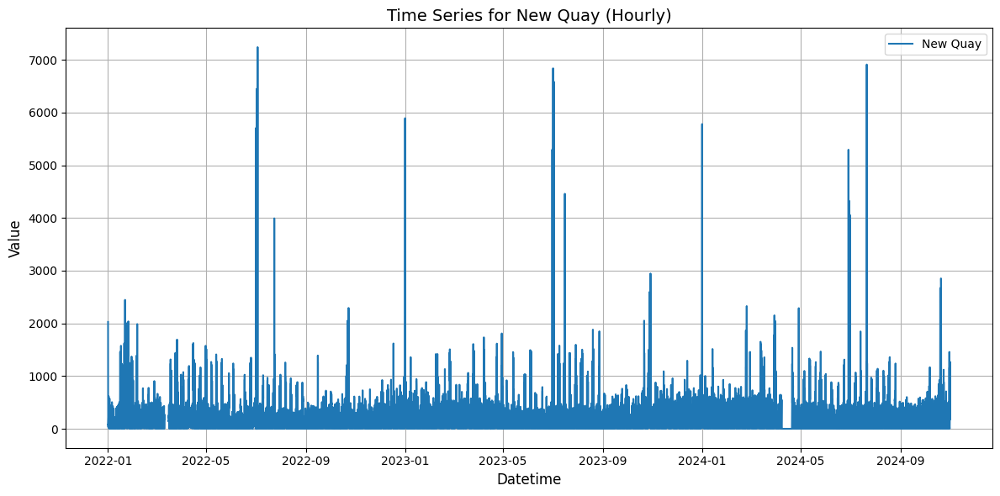

Flagstaff Station


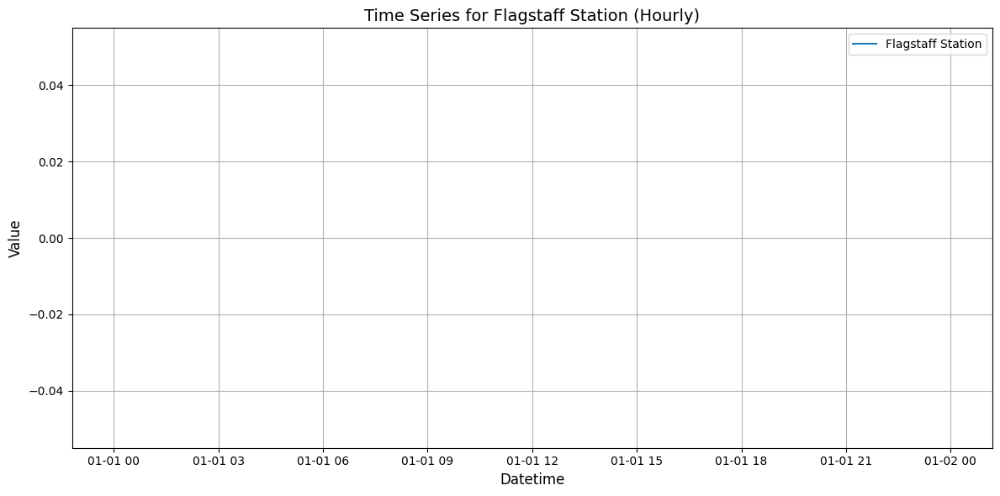

Sandridge Bridge


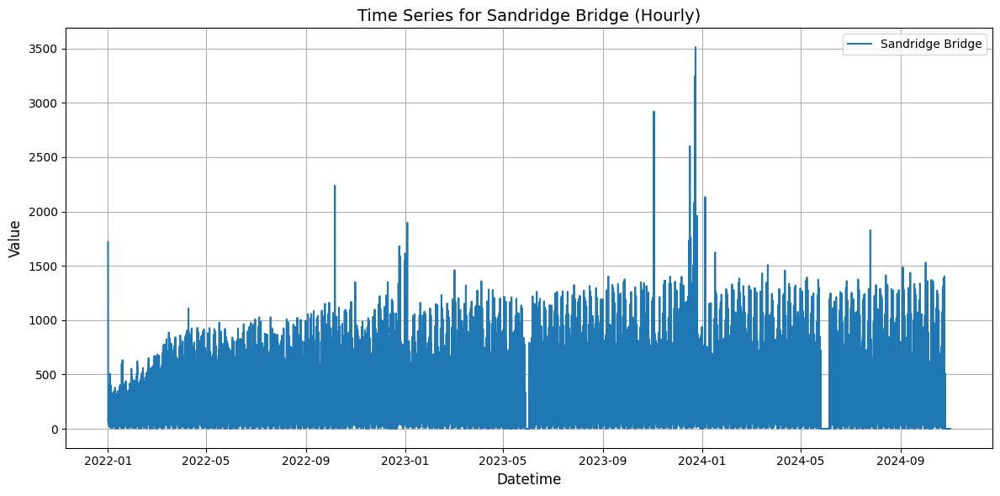

State Library


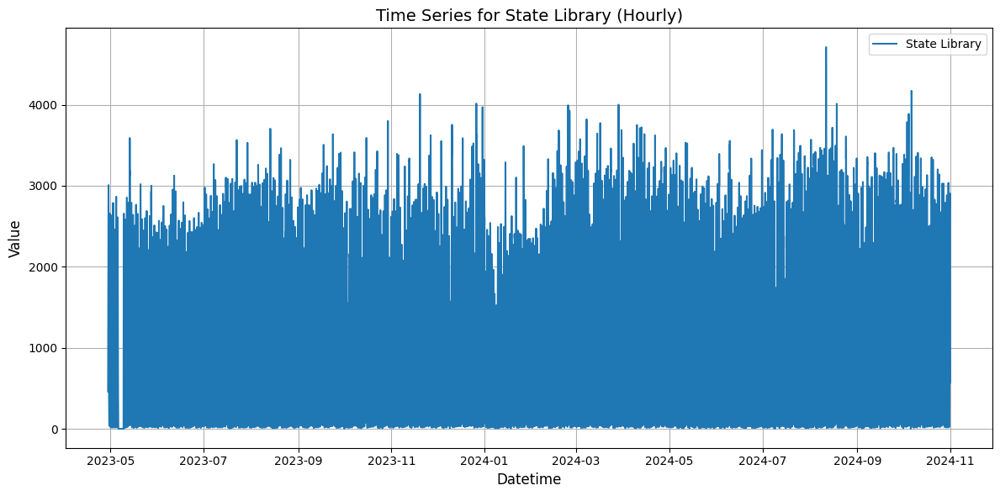

Collins St (North)


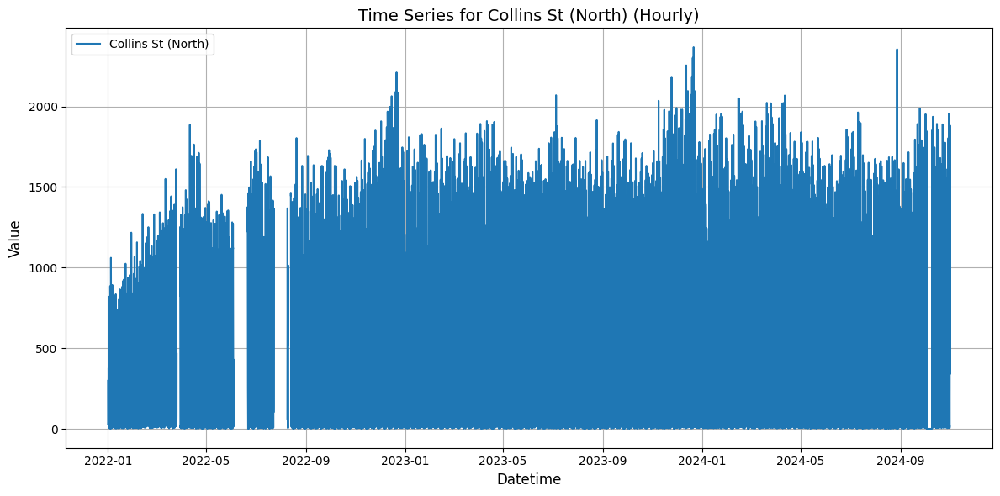

Collins Place (South)


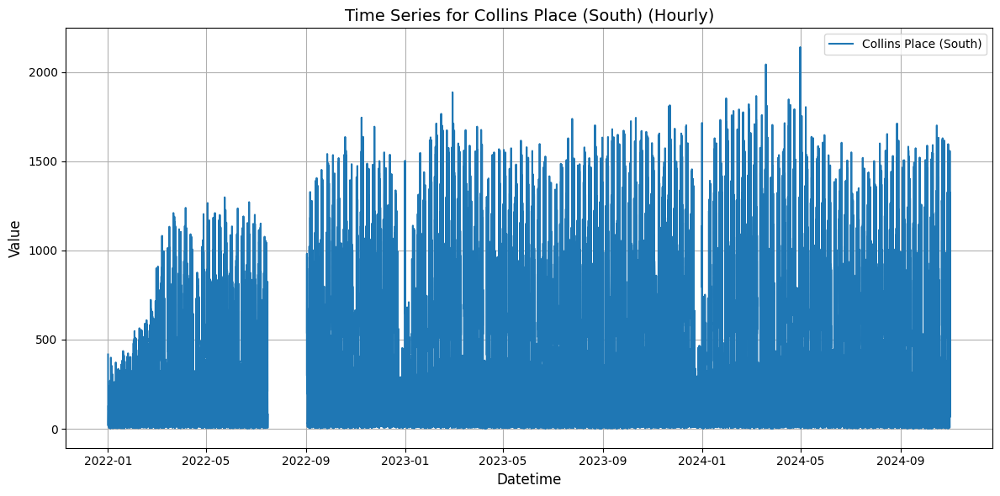

Collins Place (North)


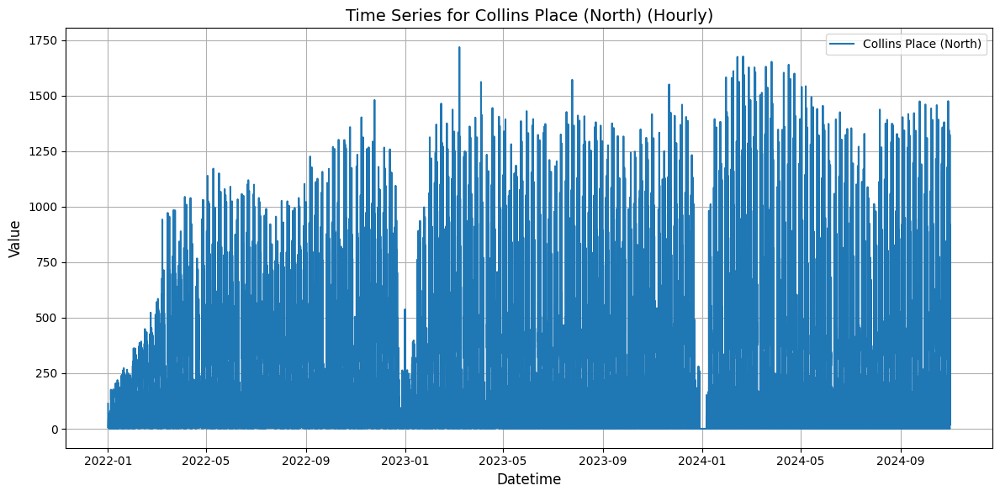

Chinatown-Swanston St (North)


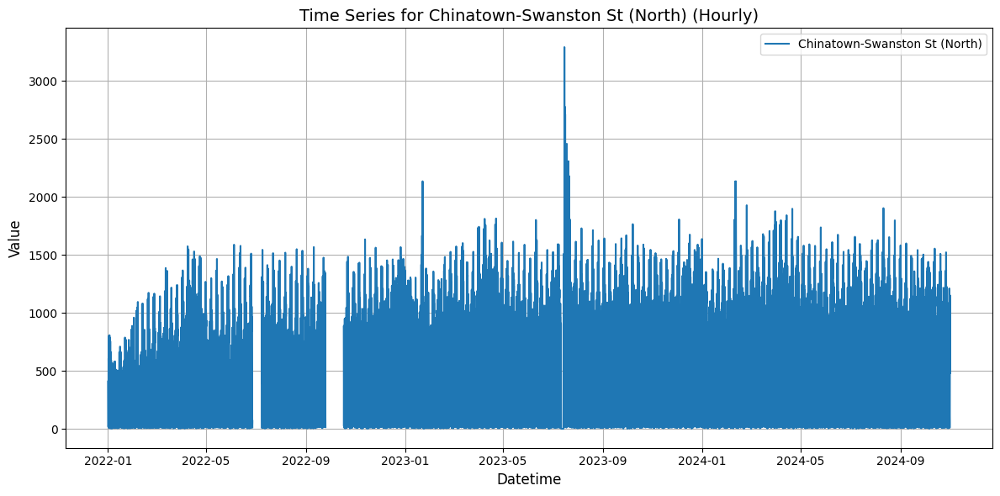

Chinatown-Lt Bourke St (South)


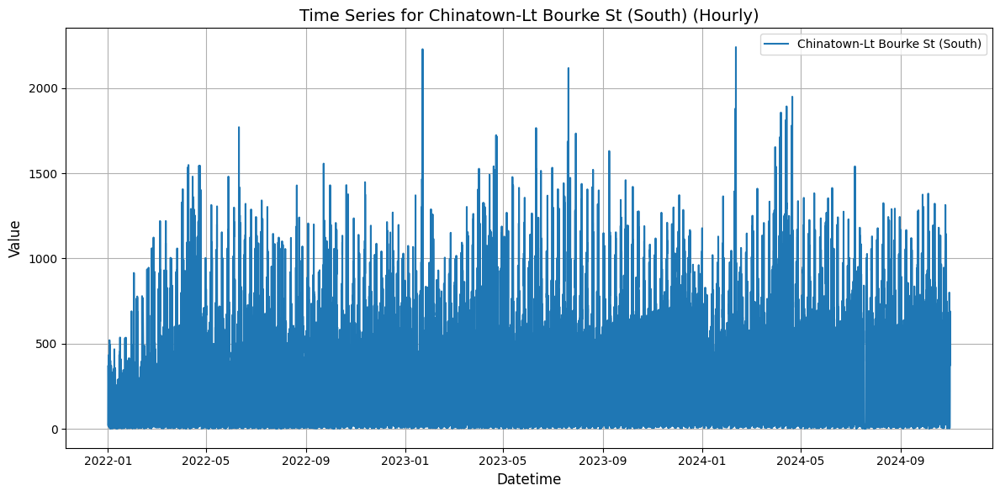

Bourke St-Russell St (West)


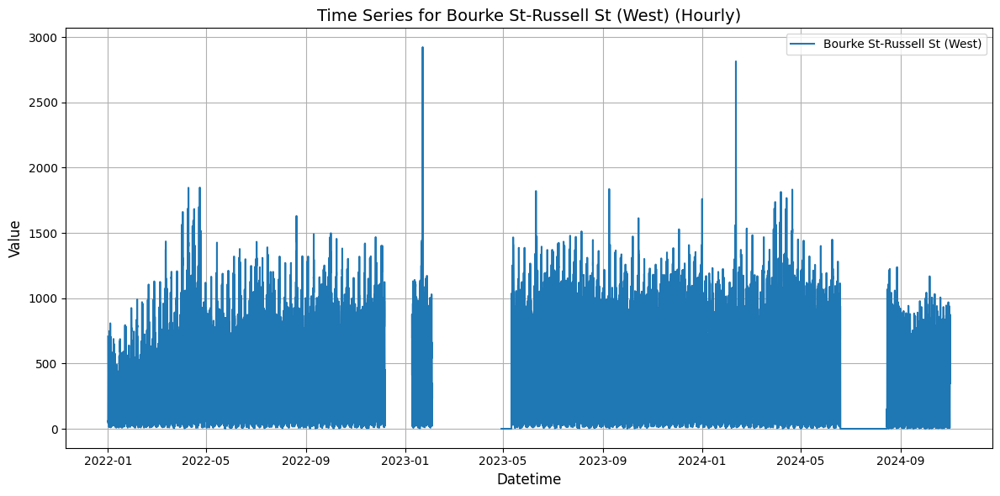

Flinders St-Elizabeth St (East)


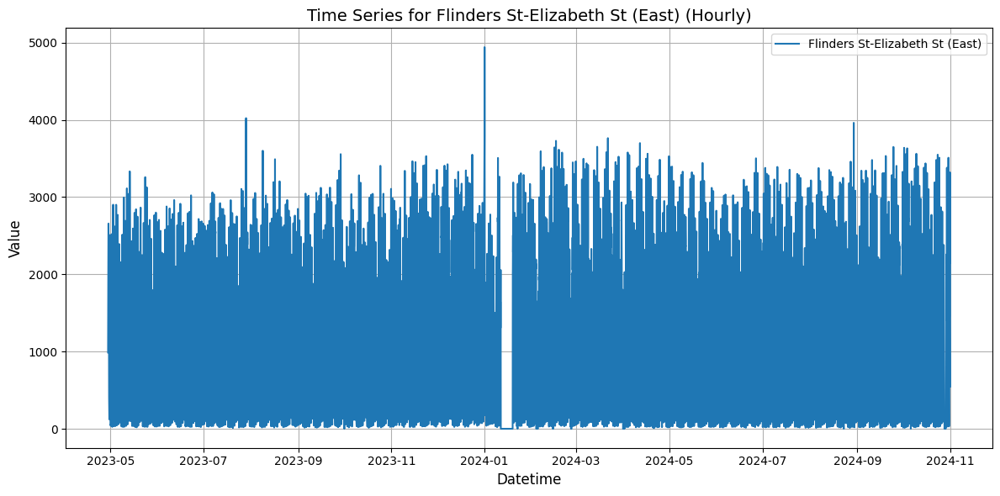

Spencer St-Collins St (South)


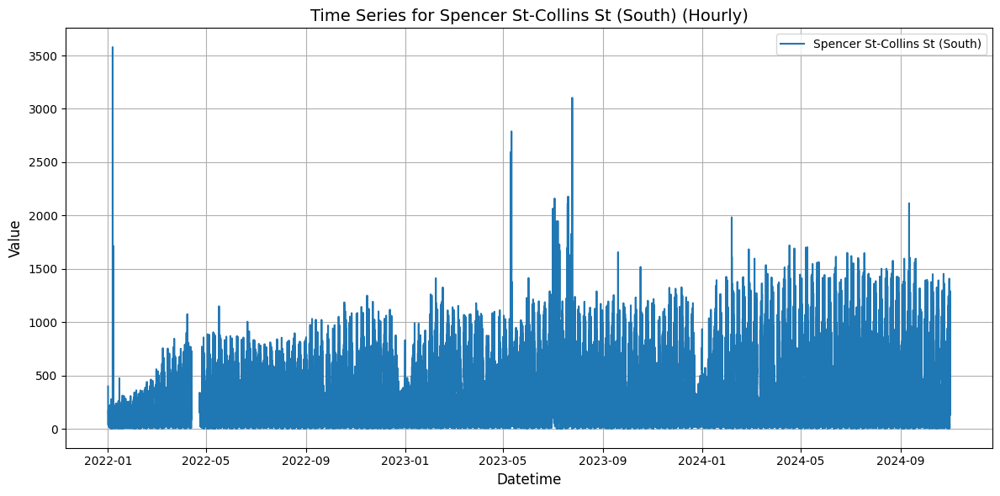

Spencer St-Collins St (North)


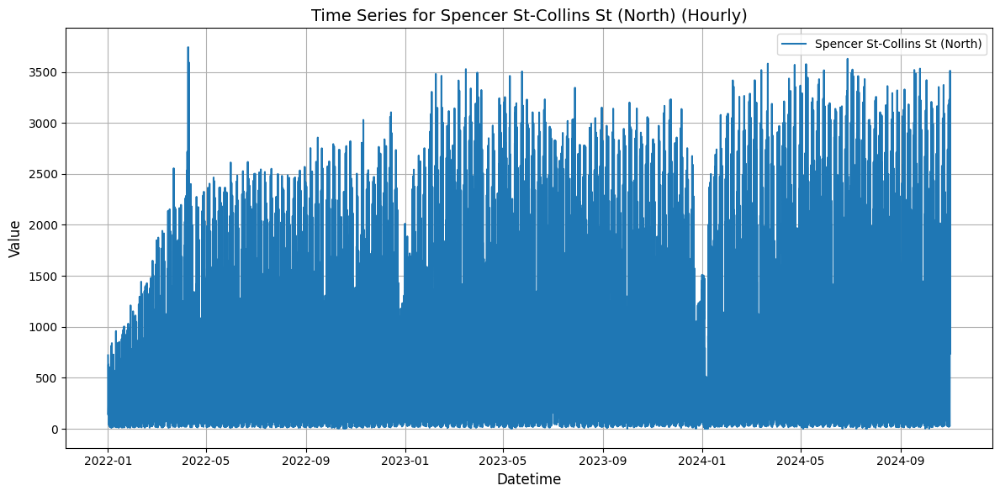

Melbourne Convention Exhibition Centre


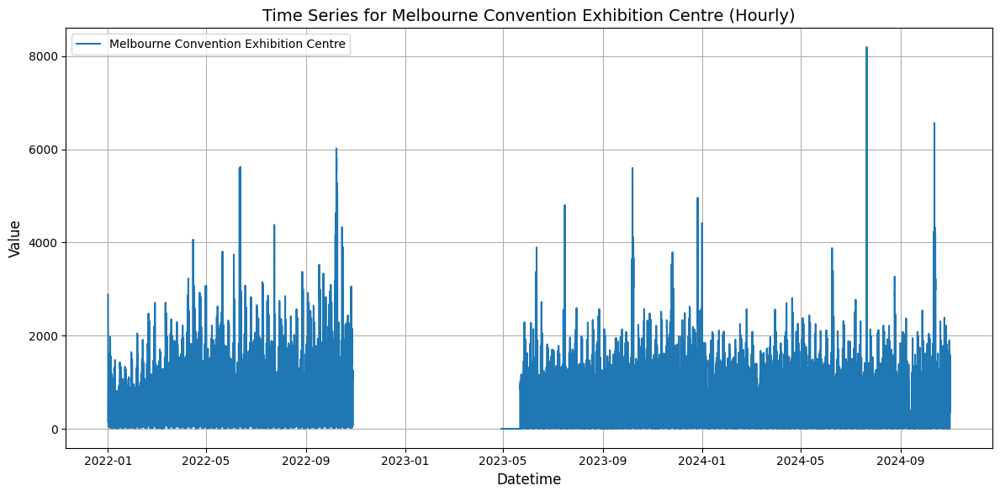

QV Market-Elizabeth St (West)


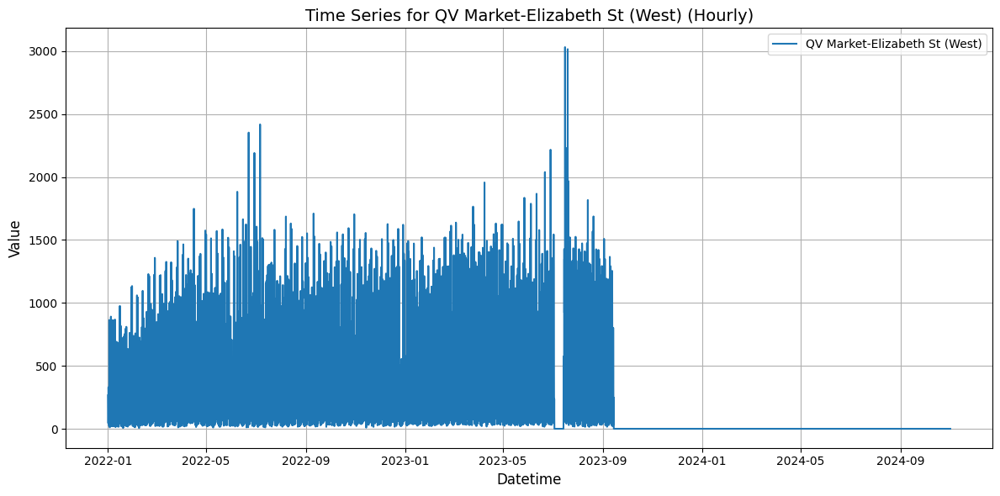

QV Market-Peel St


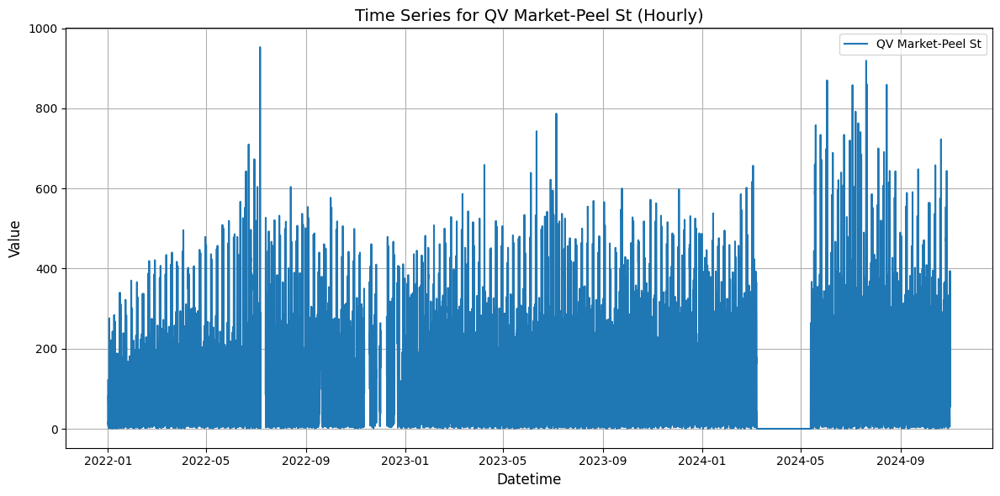

The Arts Centre


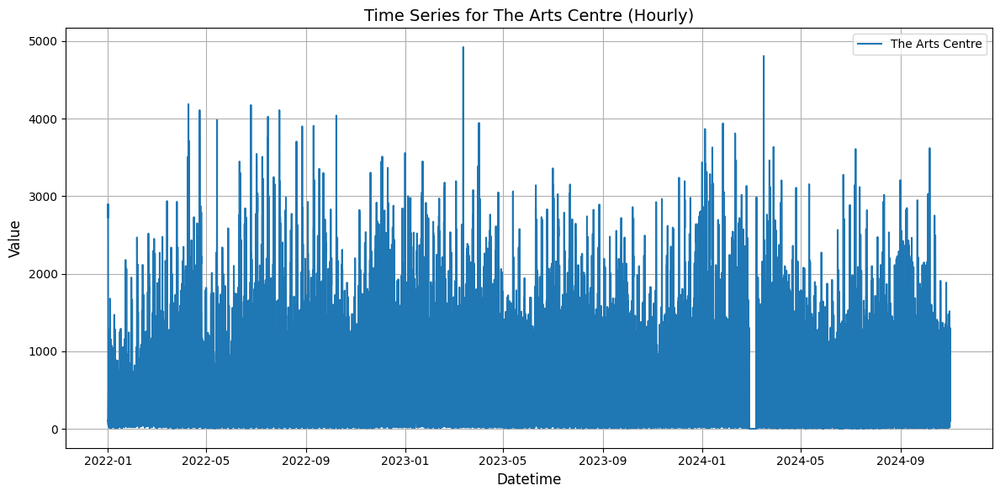

St Kilda Rd-Alexandra Gardens


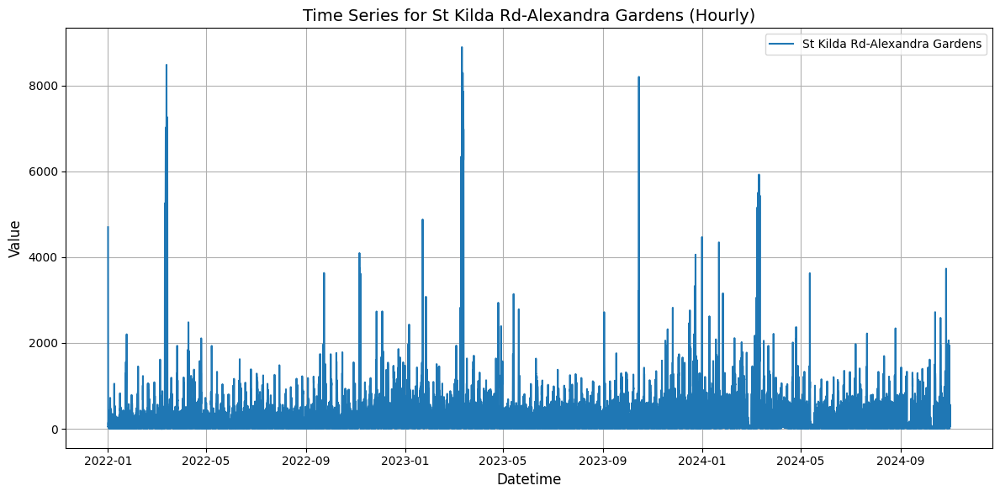

Lonsdale St (South)


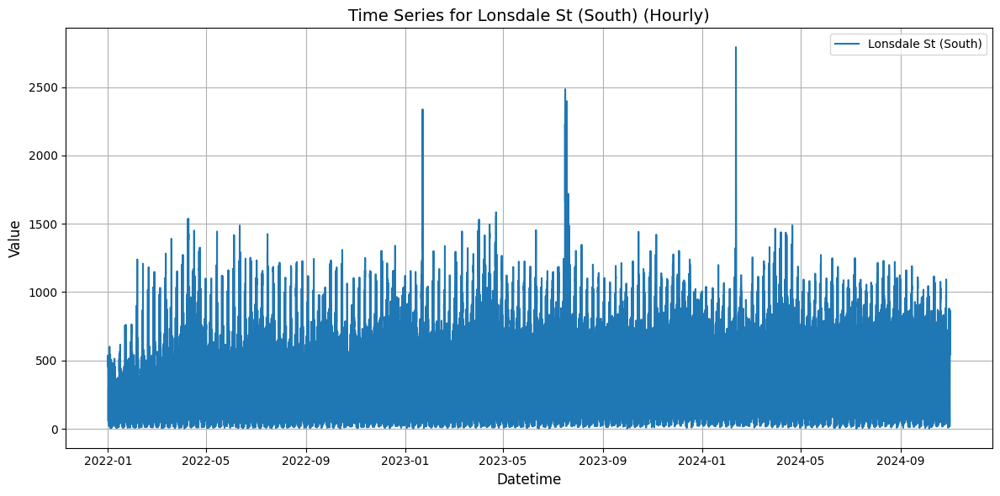

Lygon St (West)


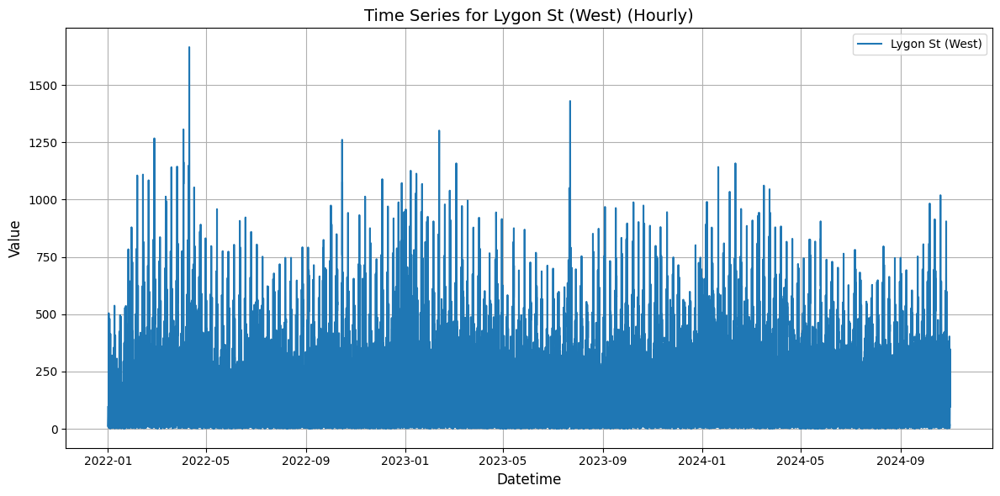

City Square


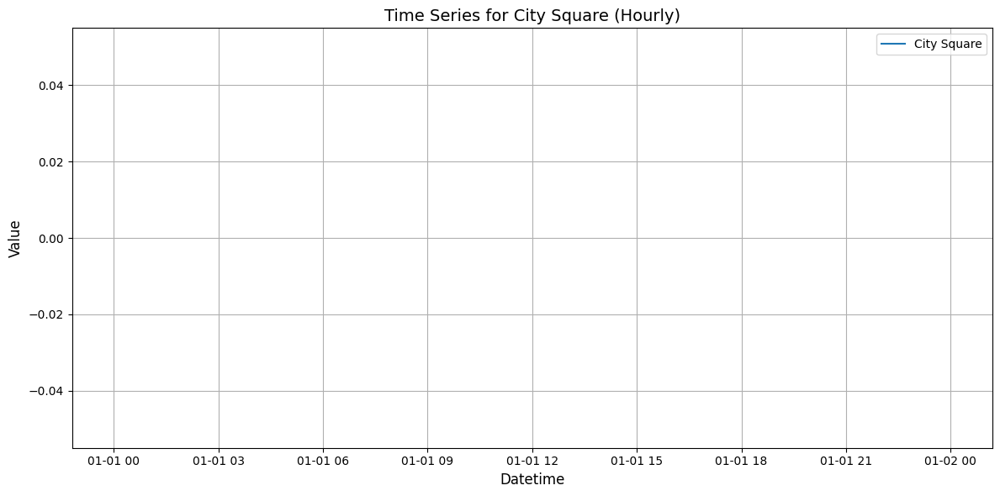

Flinders St-Spring St (West)


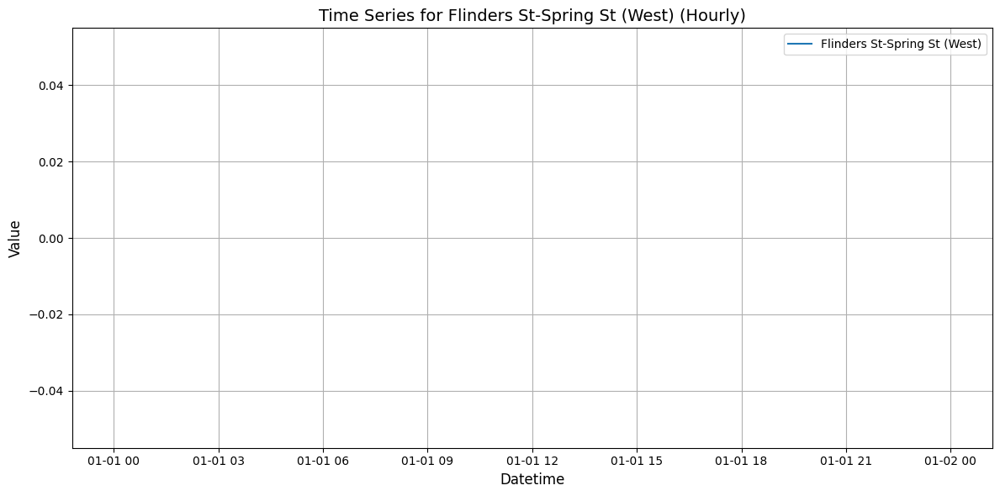

Flinders St-Spark La


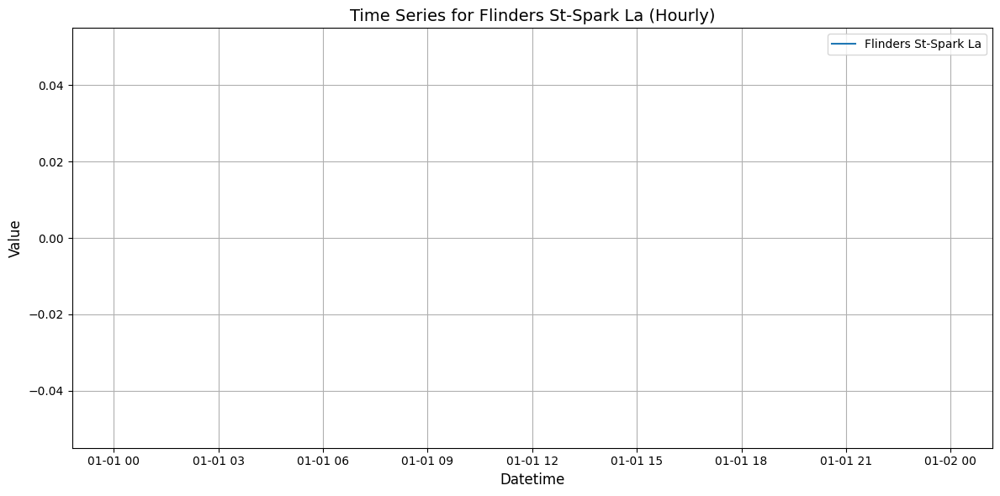

Southbank


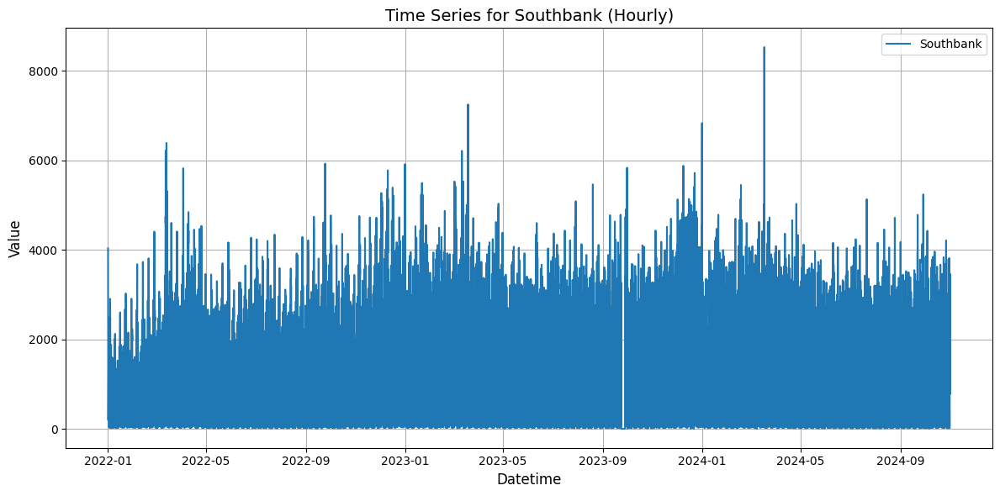

Queen St (West)


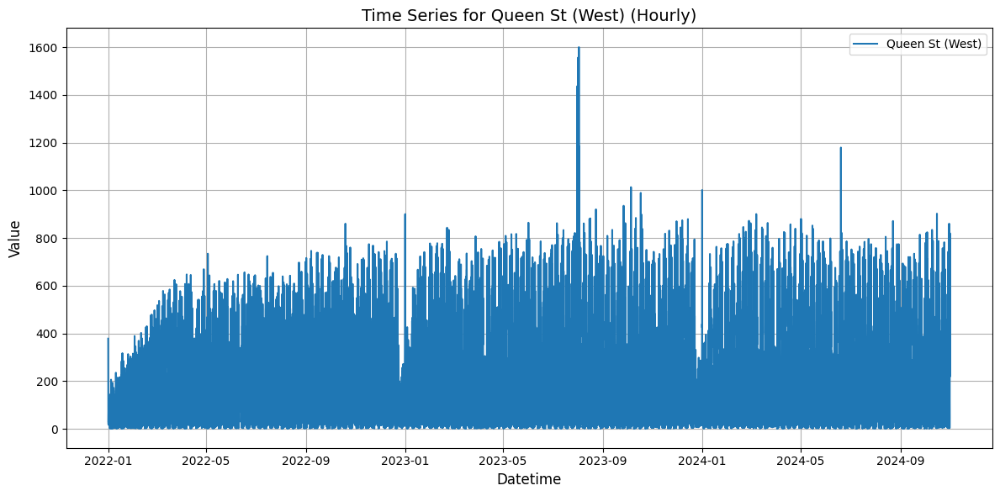

Lygon St (East)


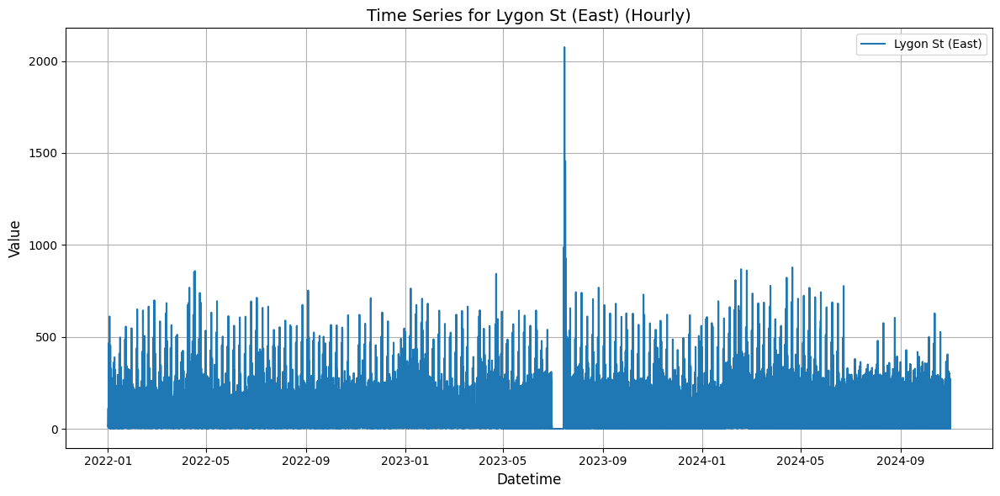

Flinders St-Swanston St (West)


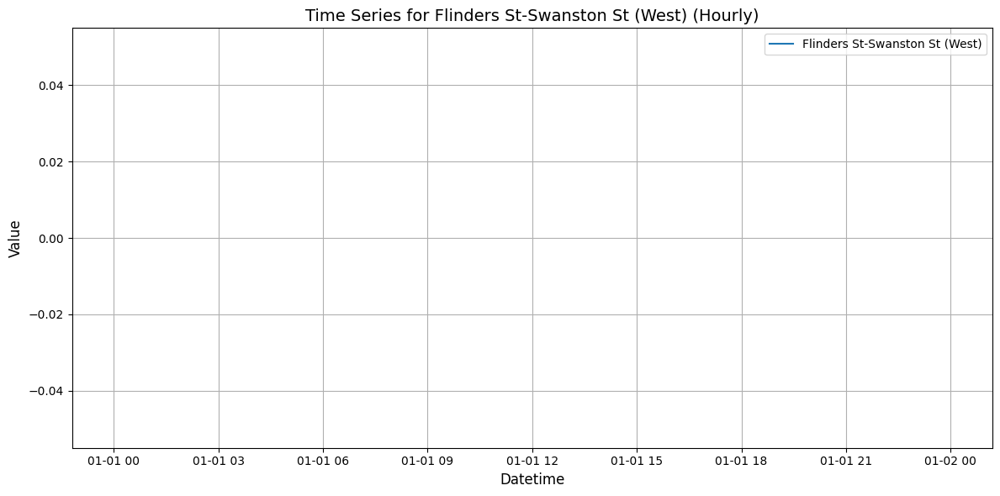

Alfred Place


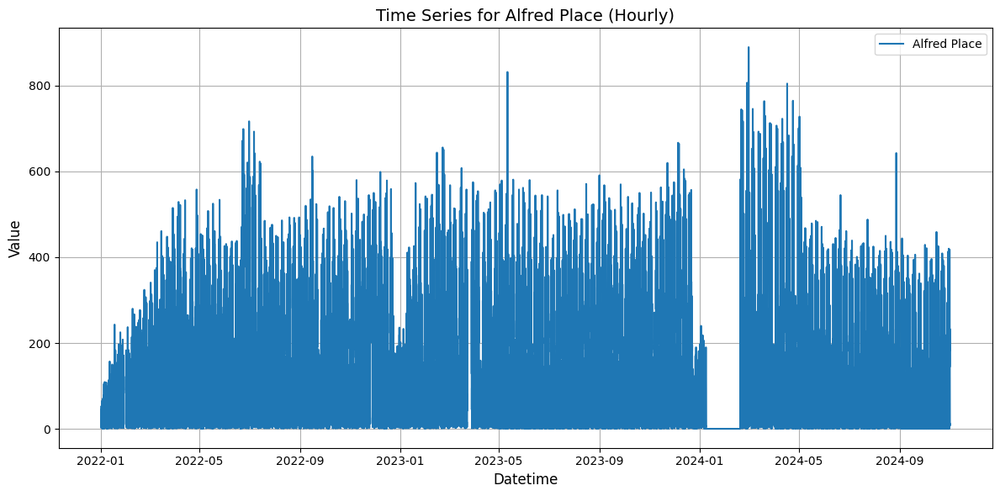

Lonsdale St-Spring St (West)


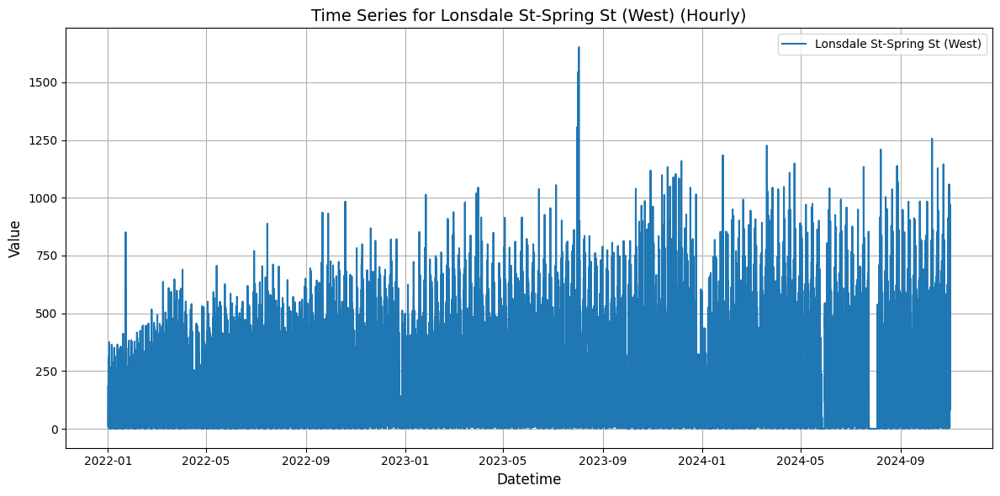

Grattan St-Swanston St (West)


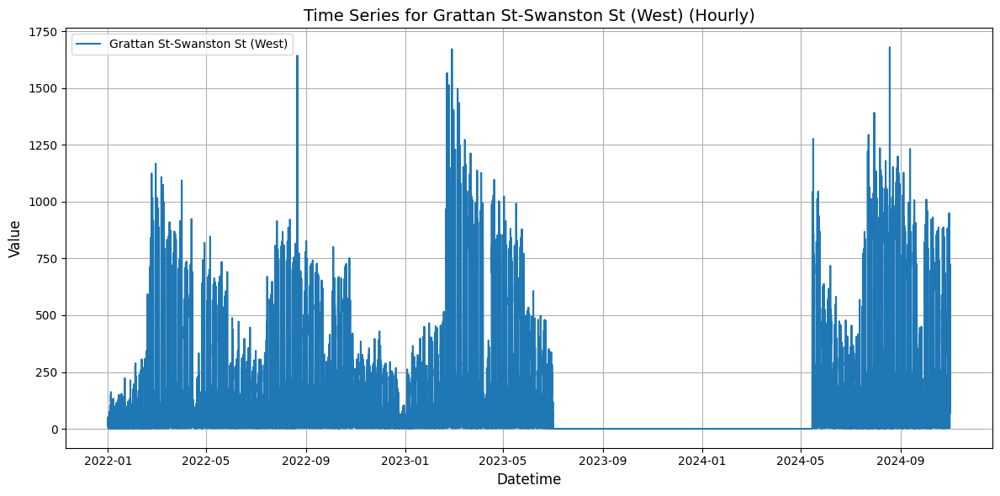

Monash Rd-Swanston St (West)


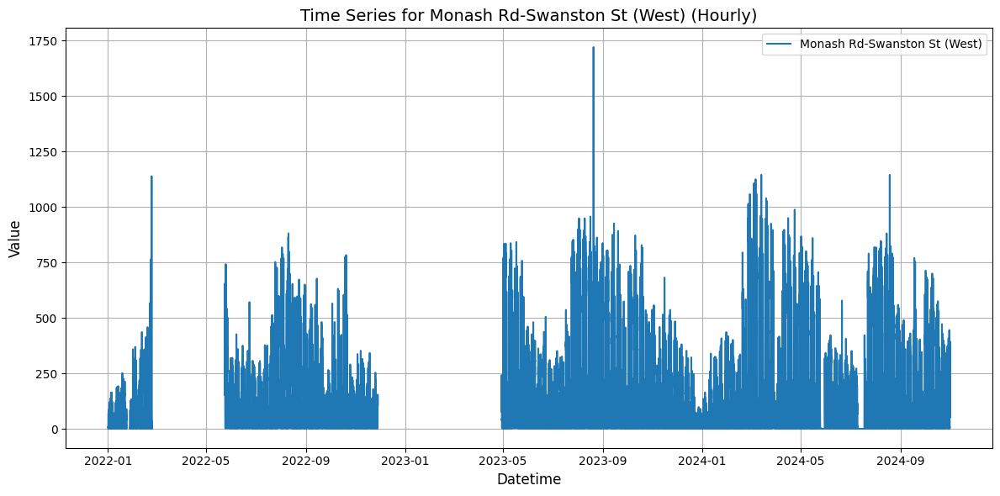

Tin Alley-Swanston St (West)


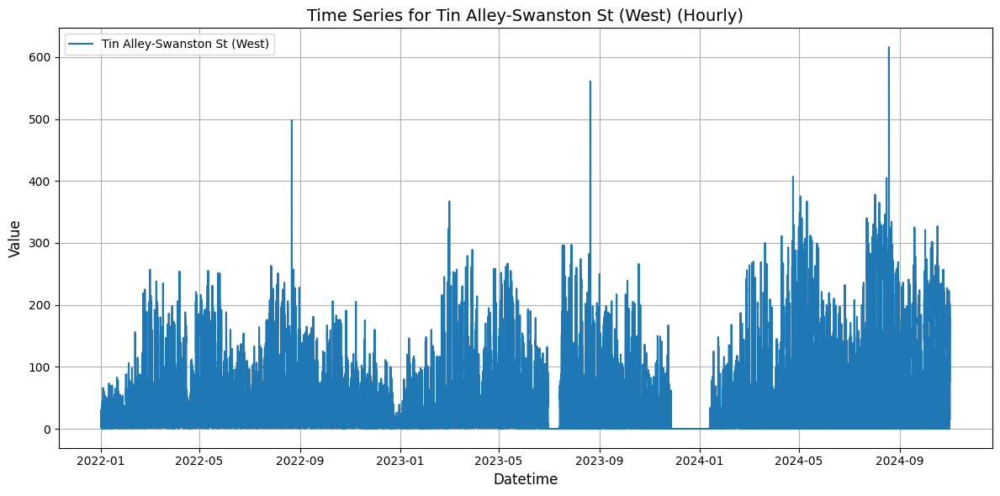

Little Collins St-Swanston St (East)


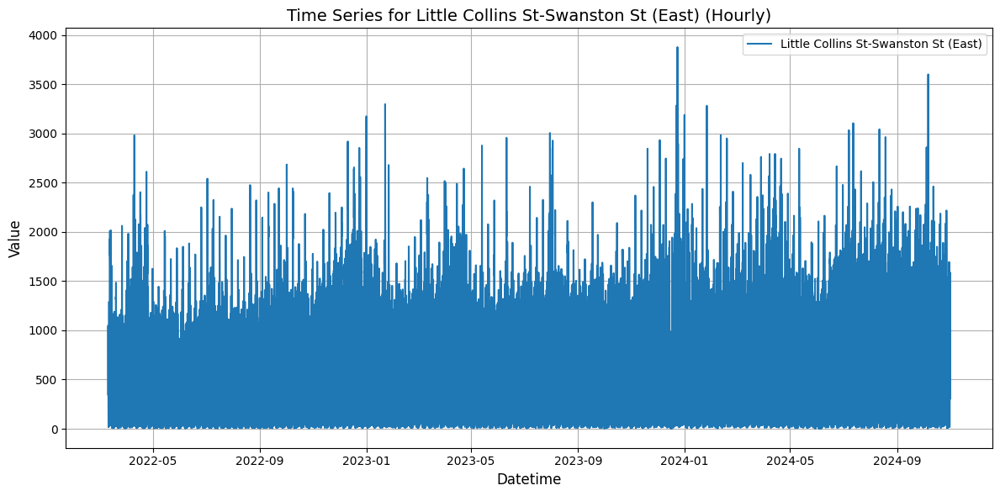

Flinders La-Swanston St (West)


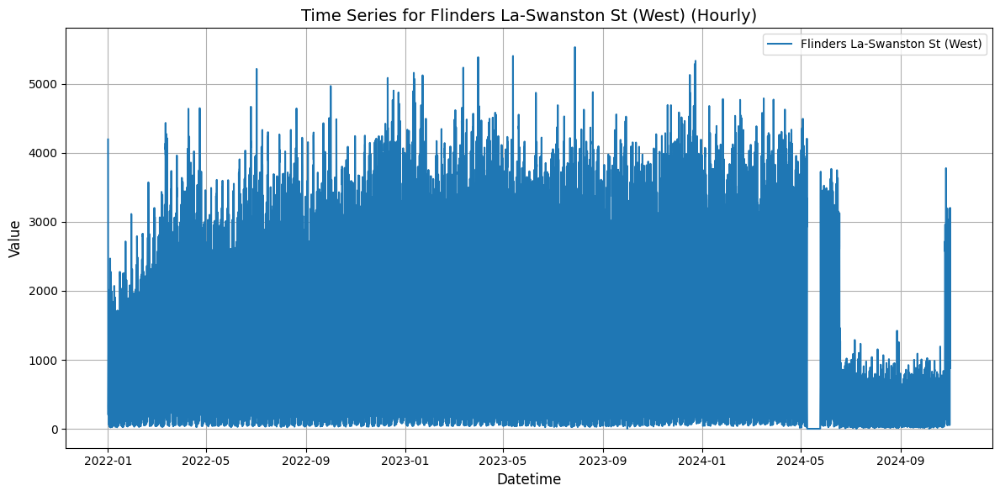

Pelham St (South)


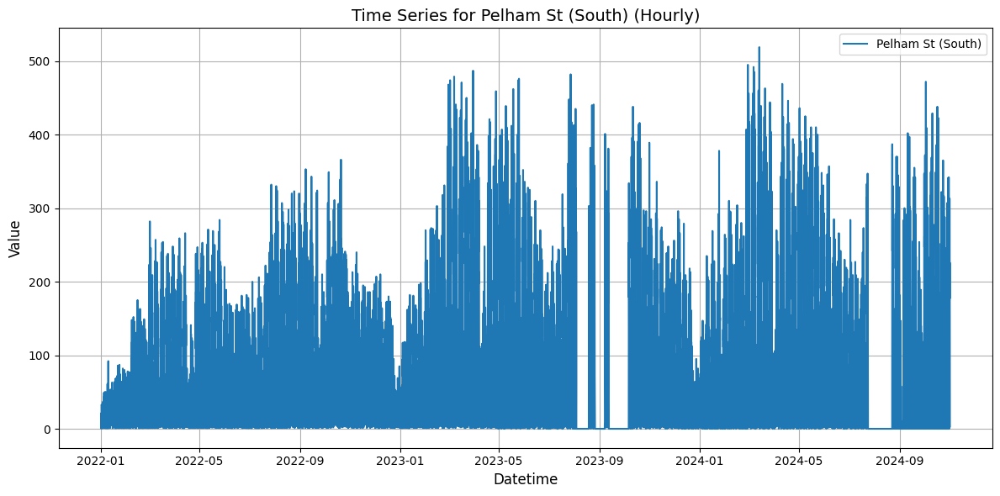

Melbourne Central-Elizabeth St (East)


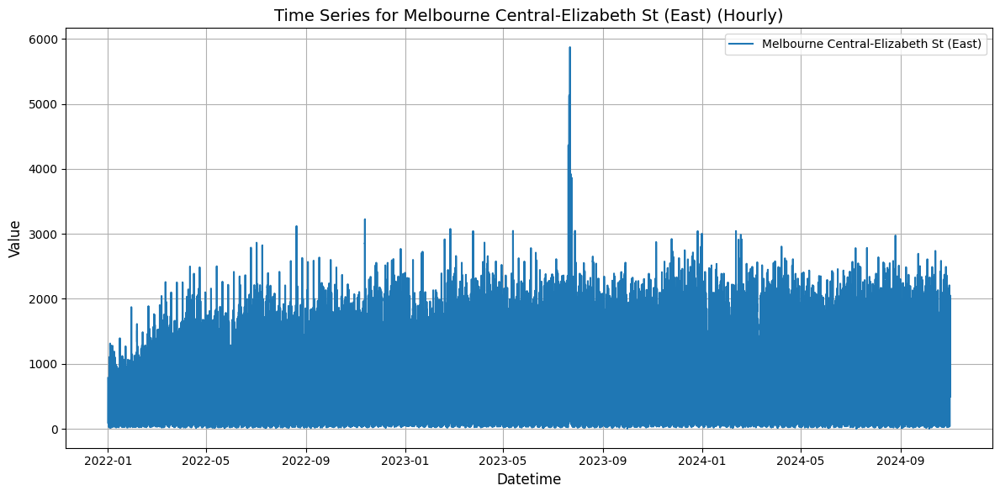

QVM-Queen St (East)


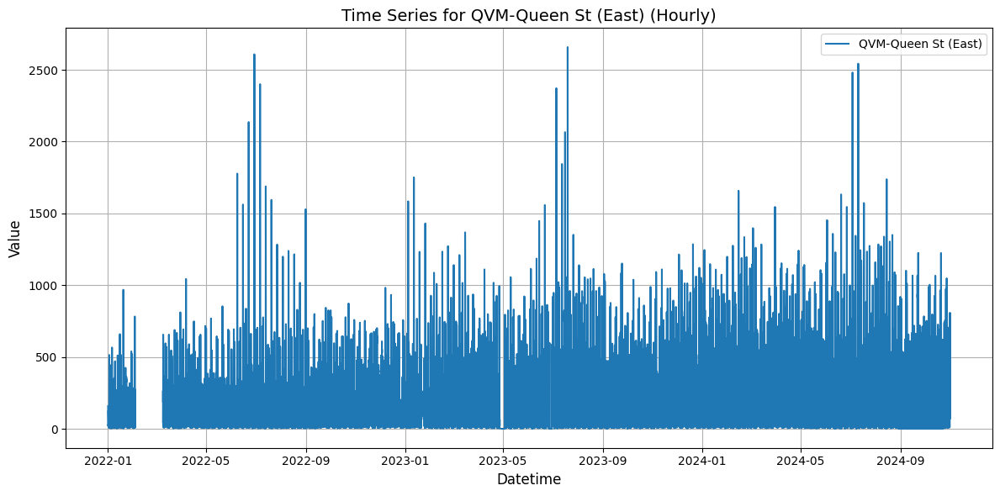

QVM-Therry St (South)


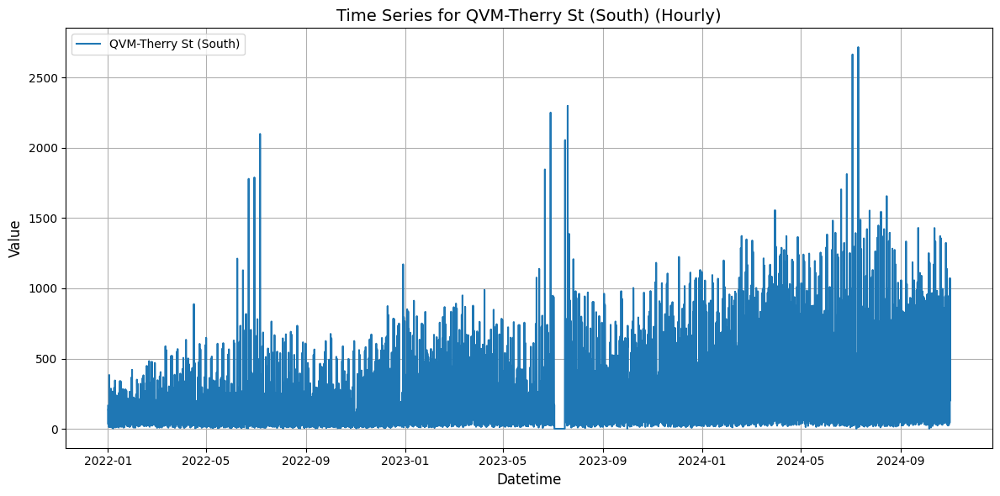

Faraday St-Lygon St (West)


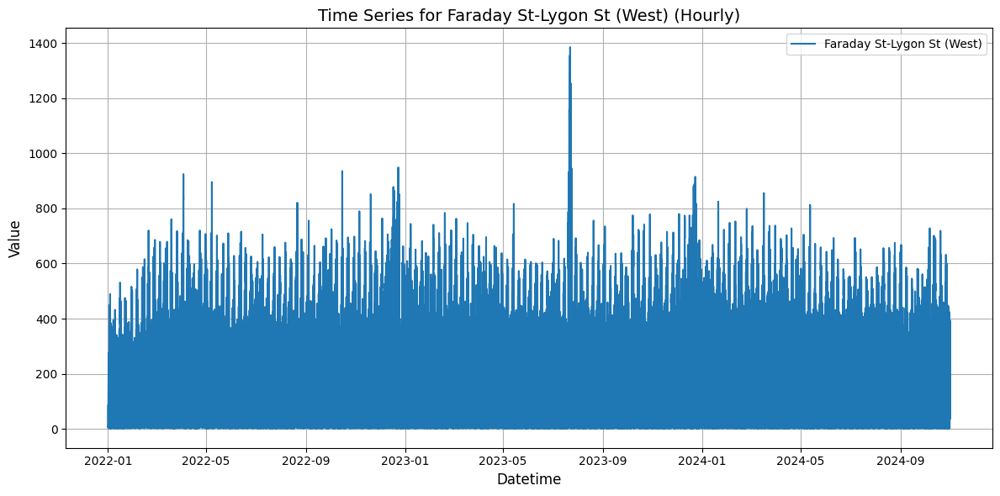

QVM-Franklin St (North)


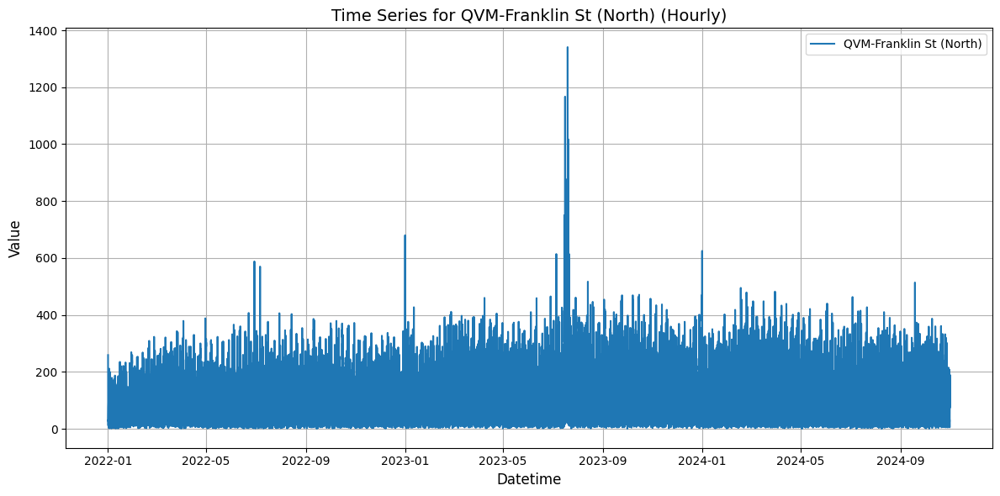

Elizabeth St-Lonsdale St (South)


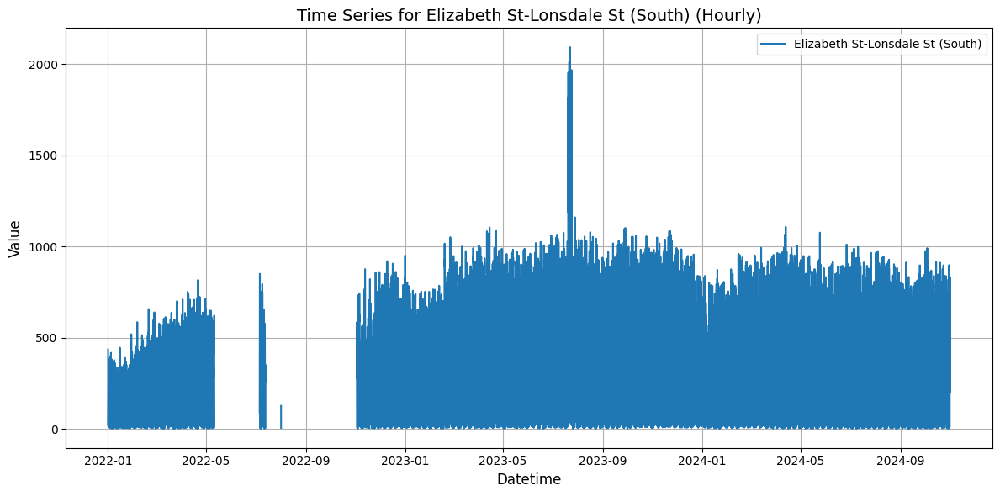

Lincoln-Swanston (W)


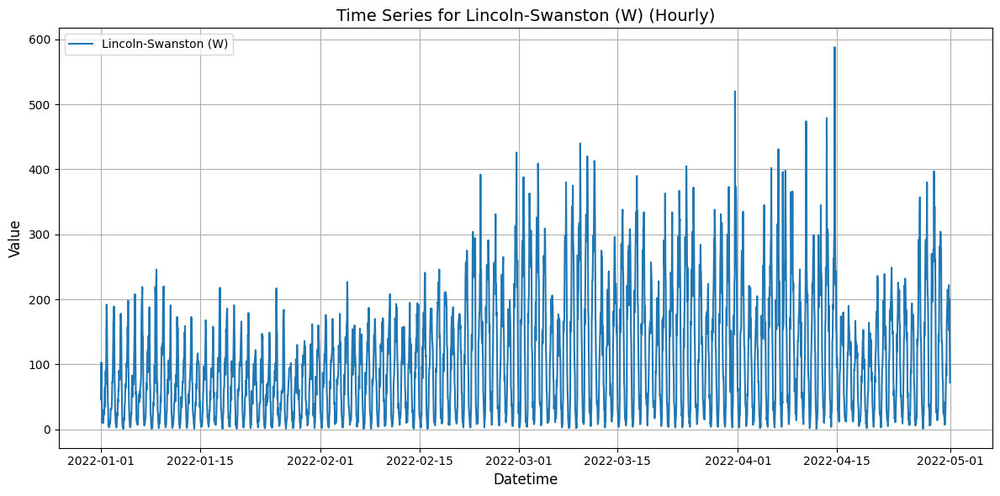

Elizabeth St-La Trobe St (East)


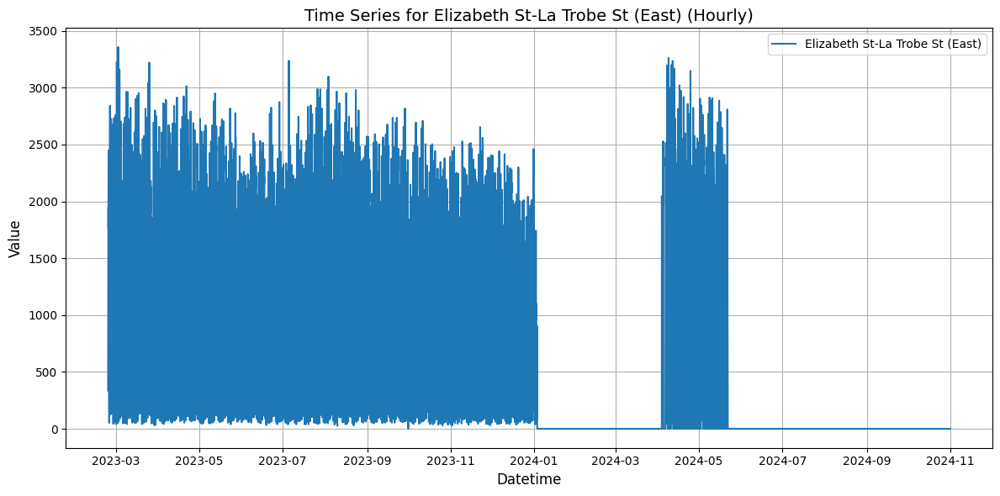

Lonsdale St - Elizabeth St (North)


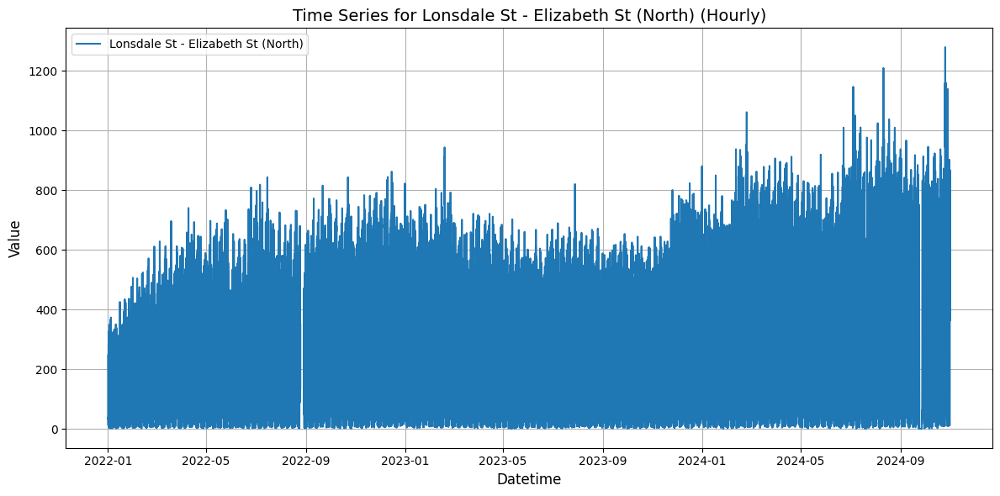

Bourke St Bridge


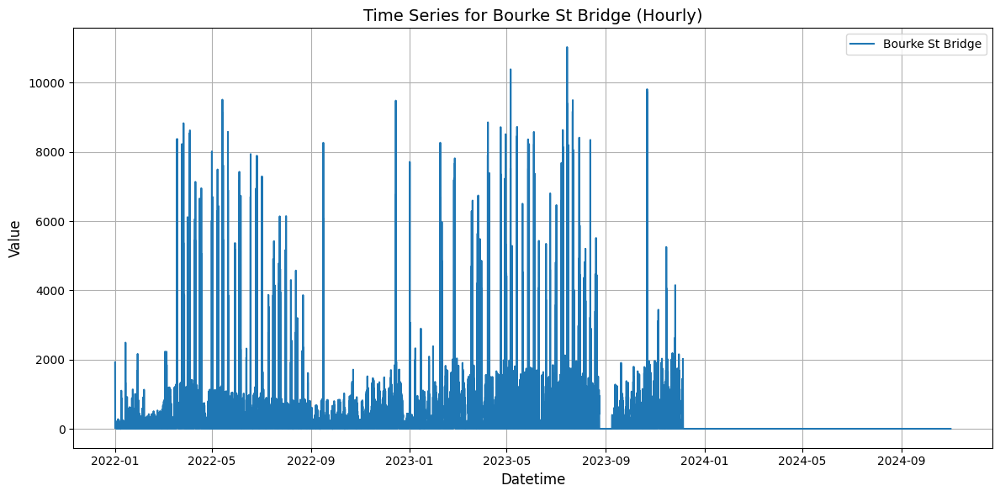

Bourke St - Spencer St (North)


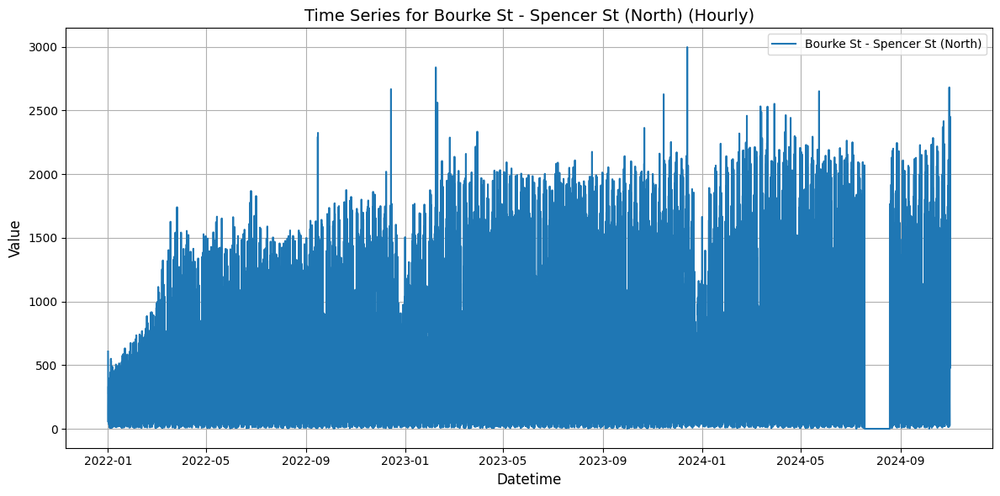

RMIT Bld 80 - 445 Swanston Street


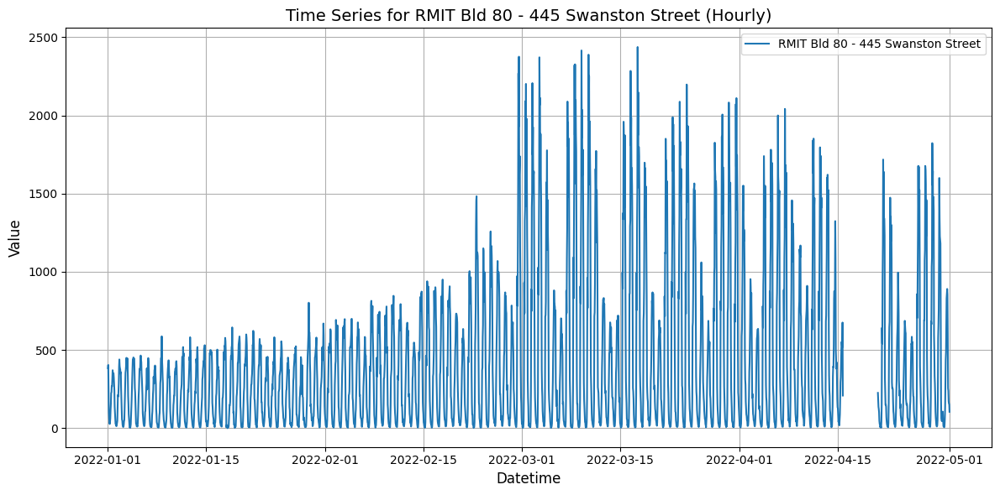

Flinders La-Swanston St (West) Temporary


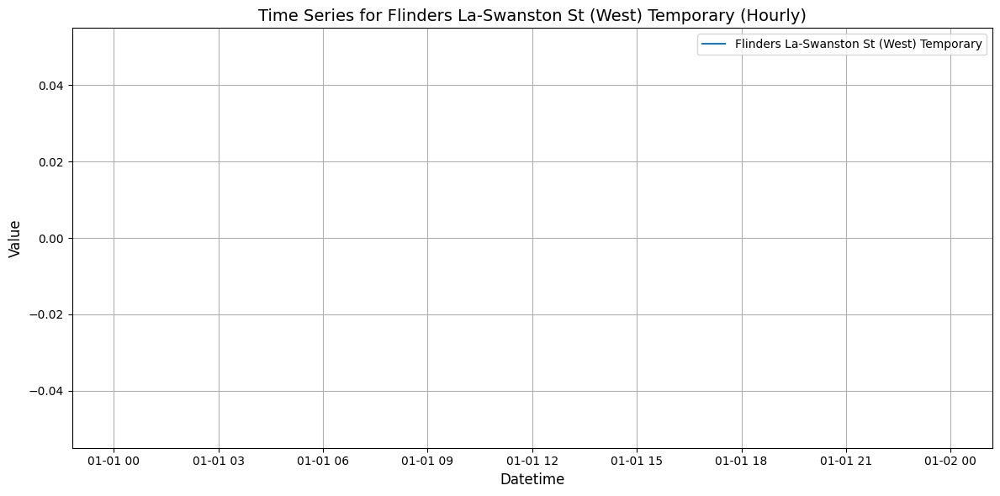

RMIT Building 14


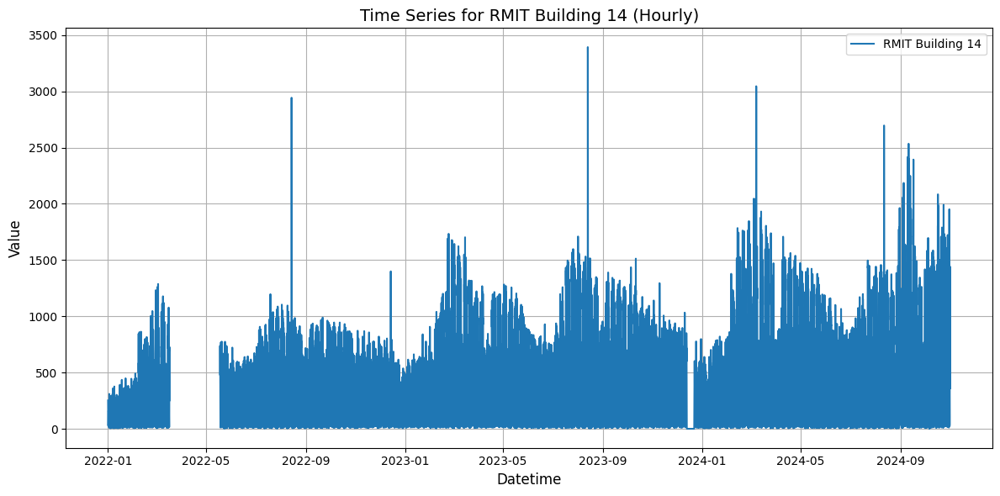

380 Elizabeth St


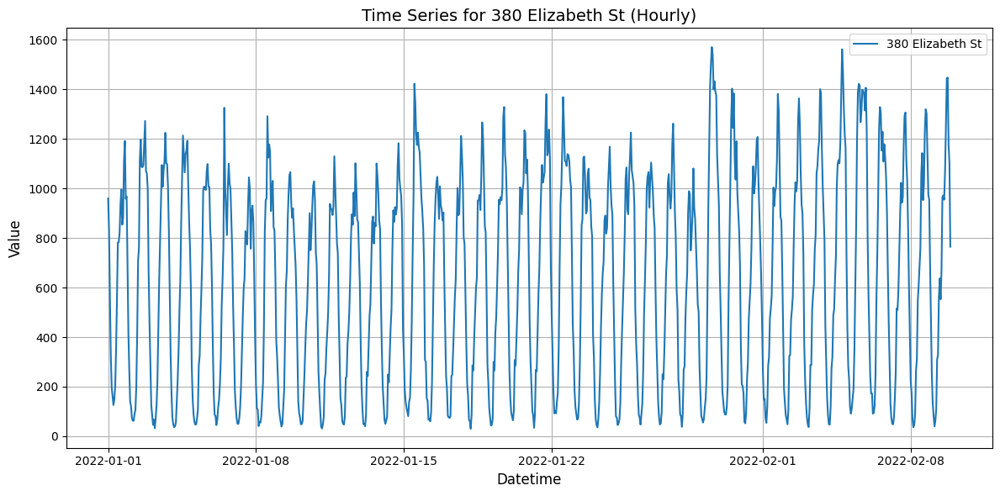

La Trobe St (North)


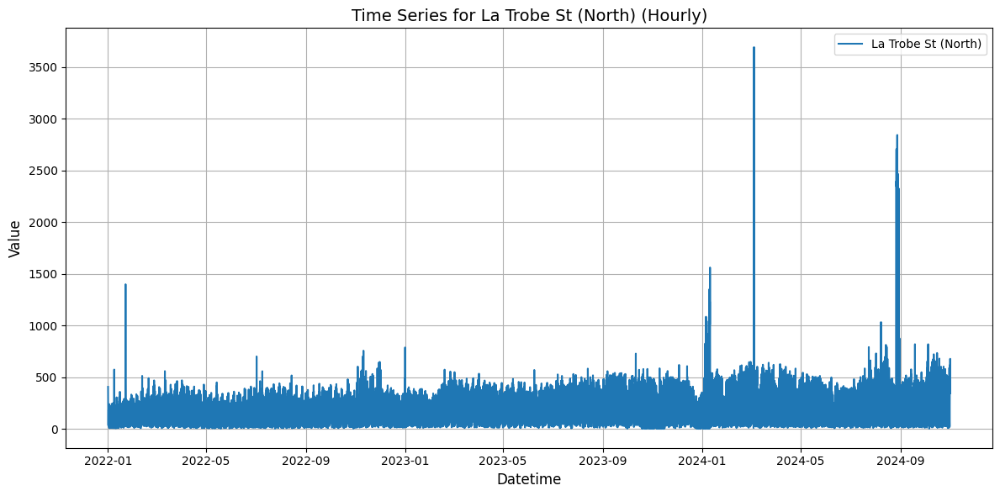

231 Bourke St


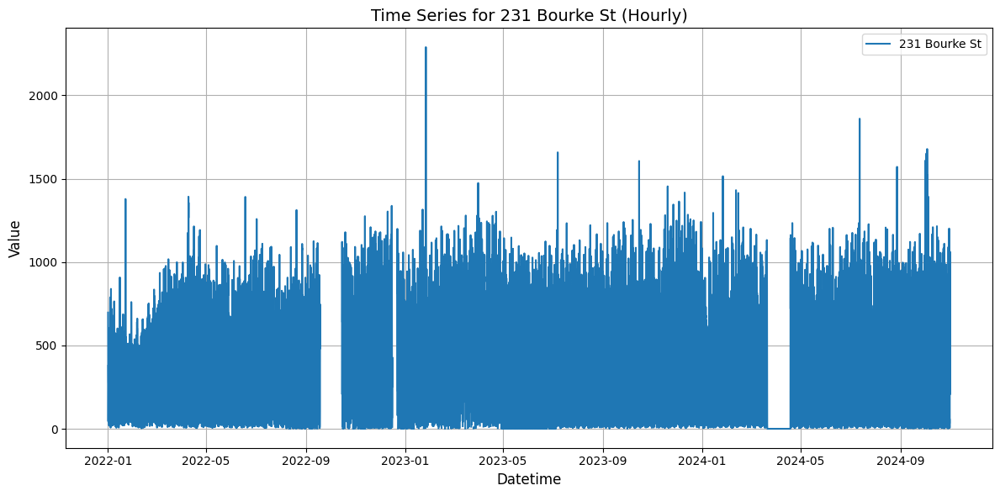

Royal Pde - Grattan St


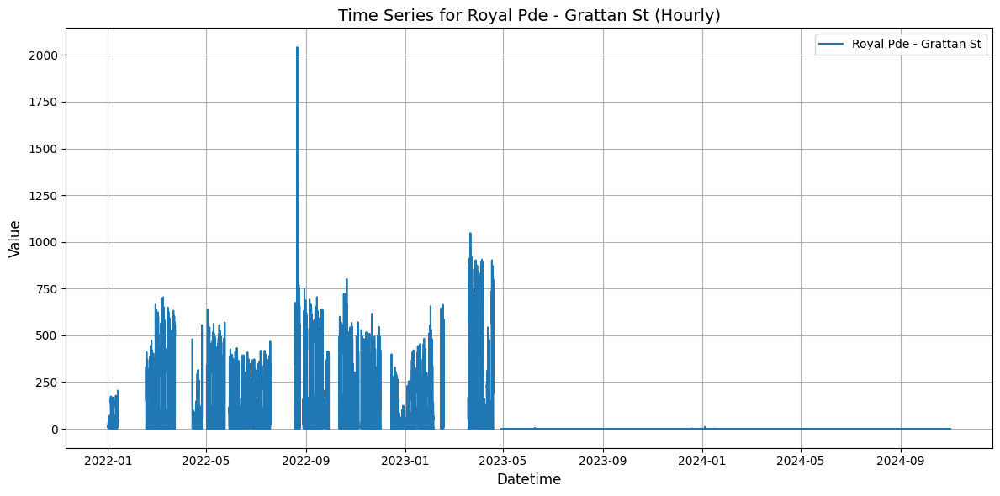

Swanston St - City Square


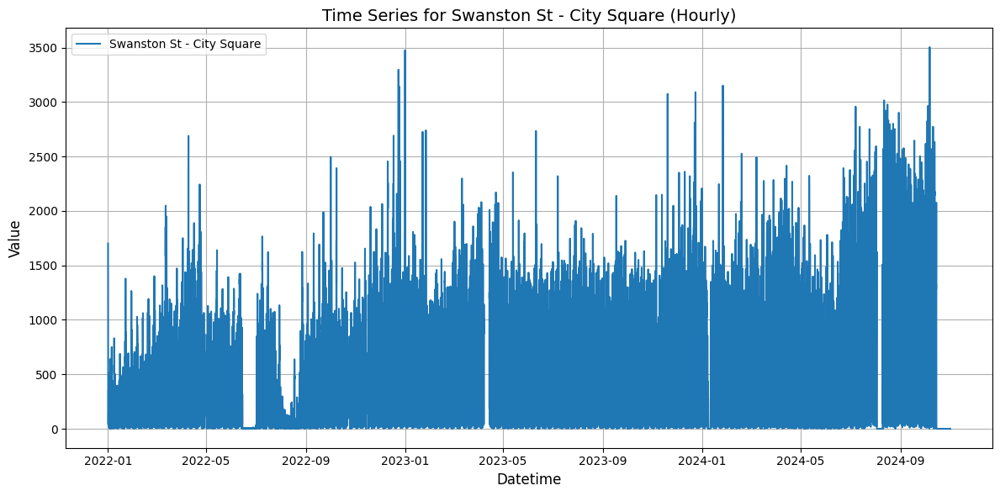

State Library - New


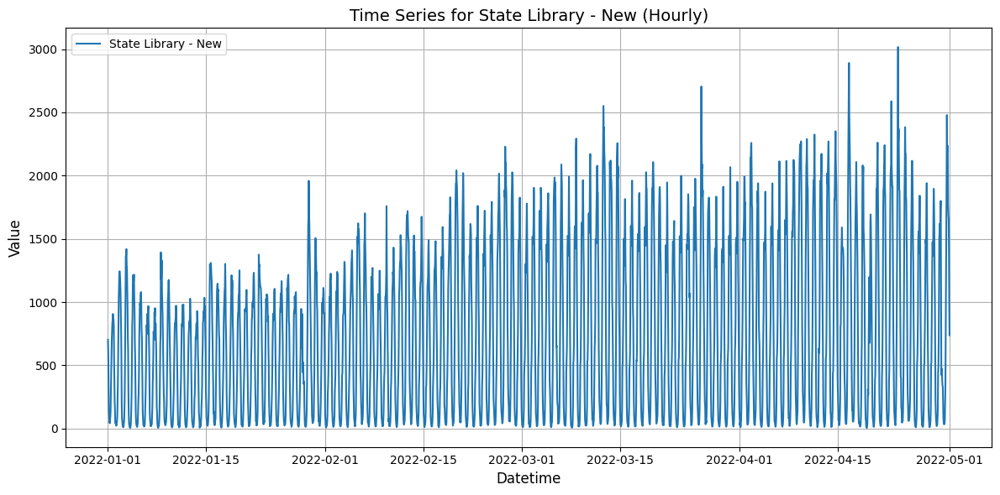

Flinders Ln - Degraves St (South)


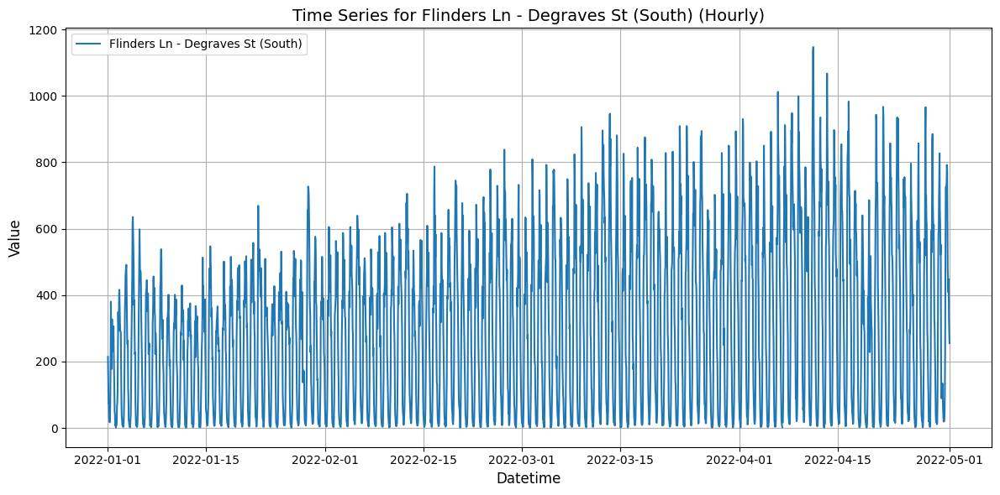

Flinders Ln - Degraves St (North)


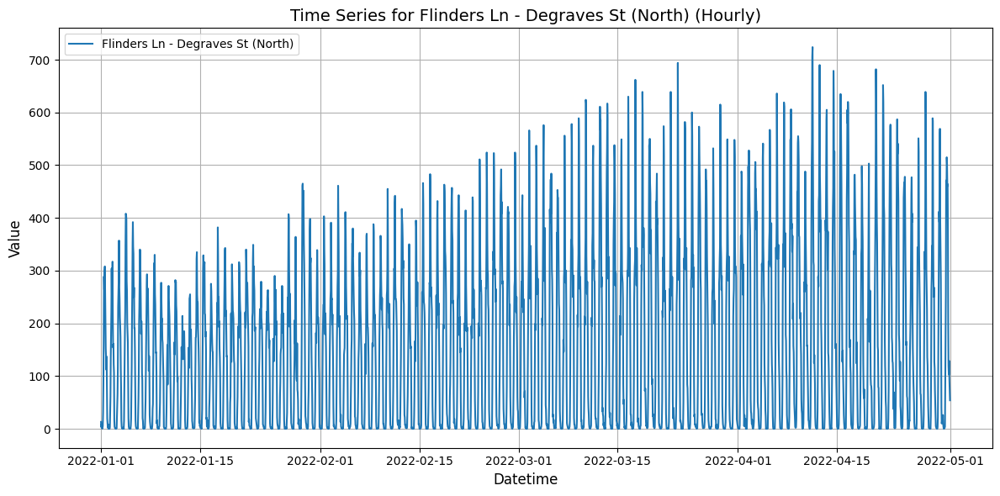

Flinders Ln - Degraves St (Crossing)


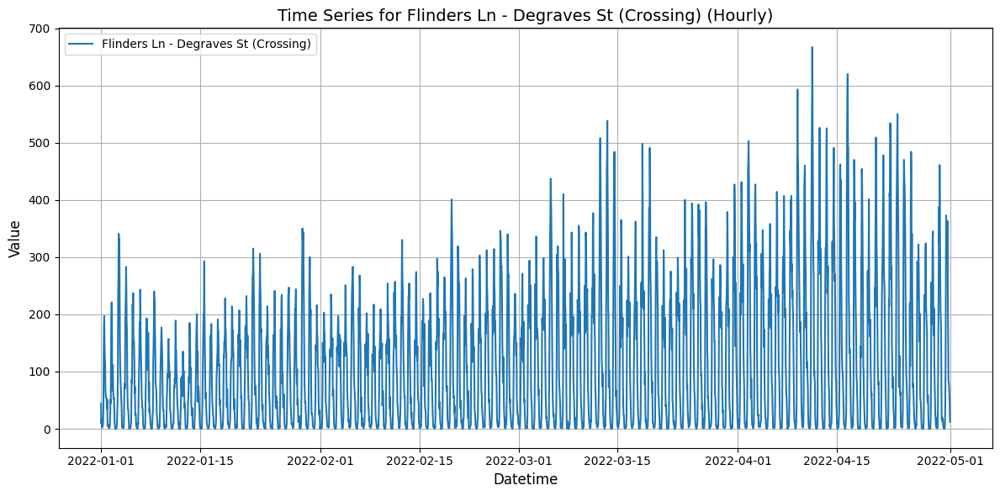

Errol Street (East)


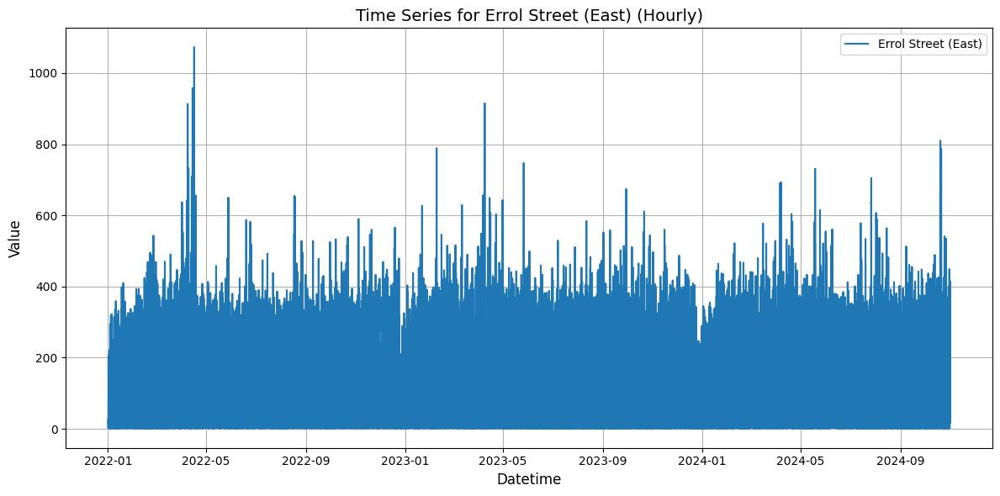

Westwood Place


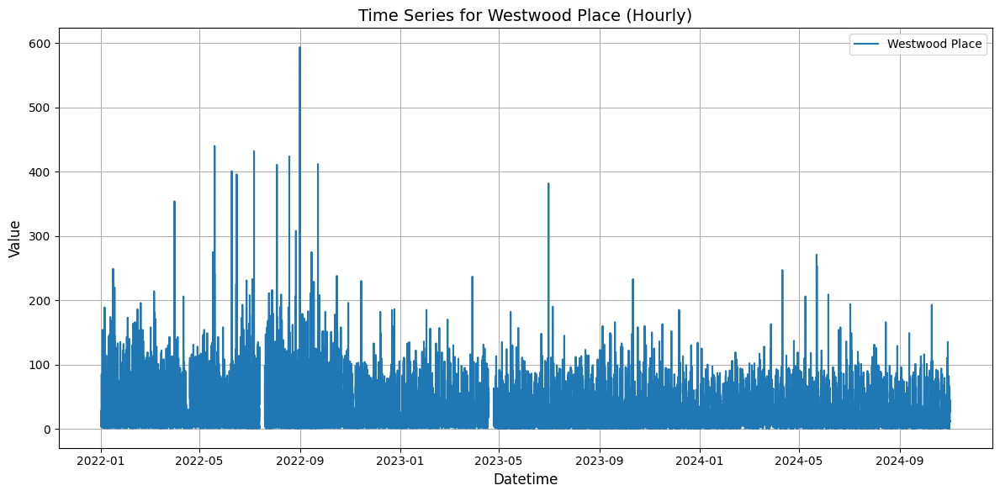

Flinders St - ACMI


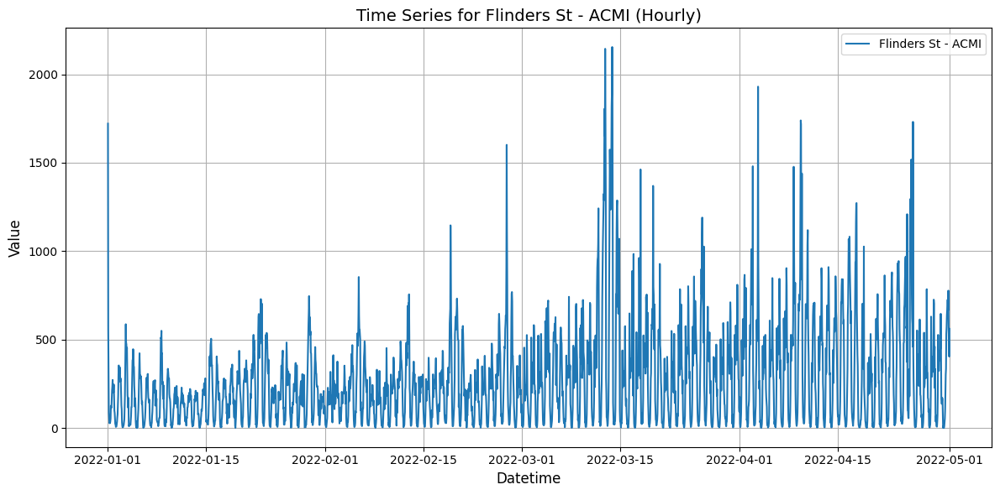

Bourke St - Spencer St (South)


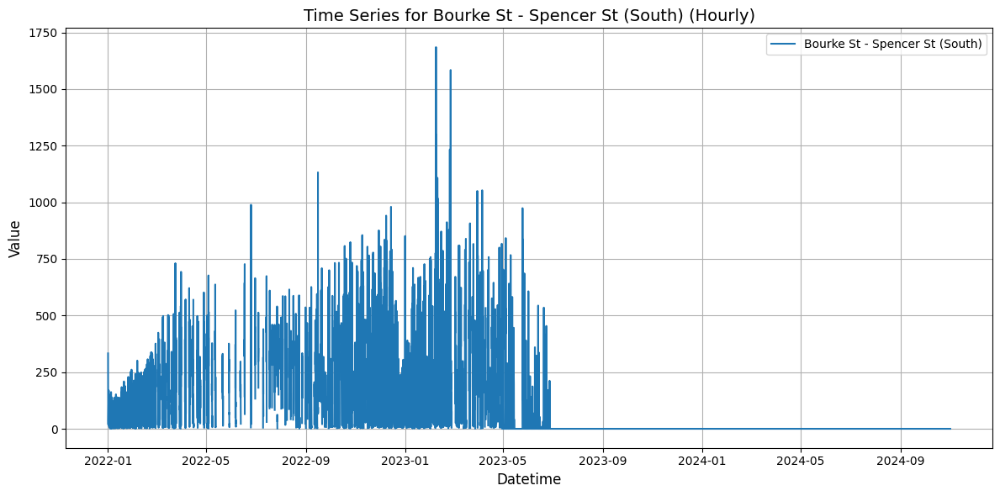

Spring St - Flinders St (West)


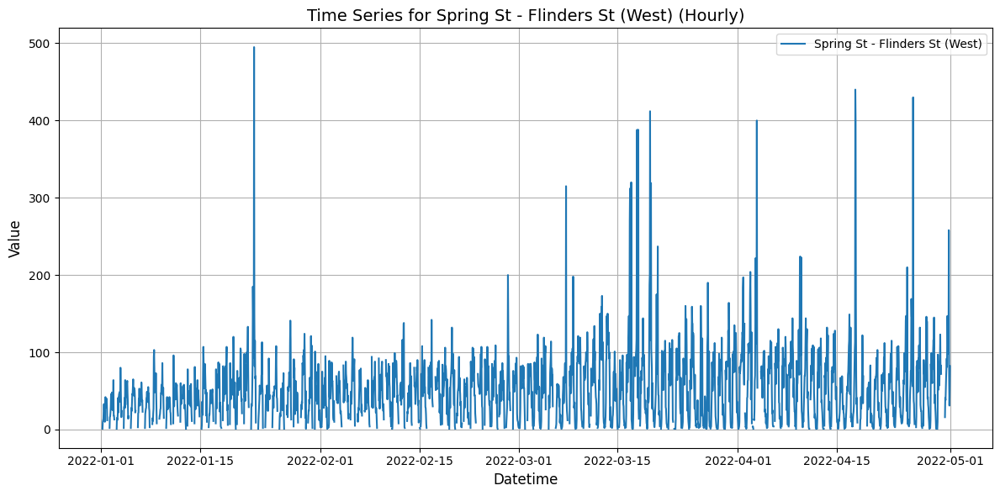

Macaulay Rd - Bellair St


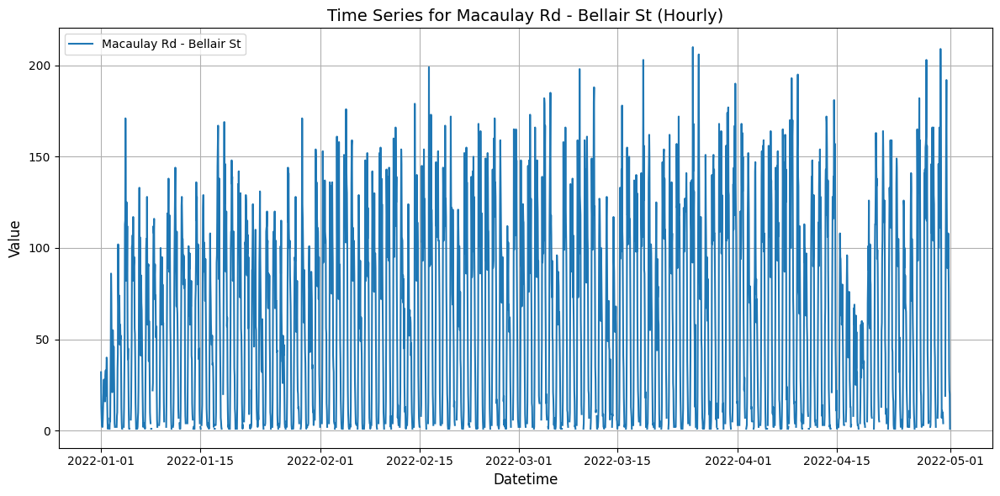

Harbour Esplanade - Pedestrian Path


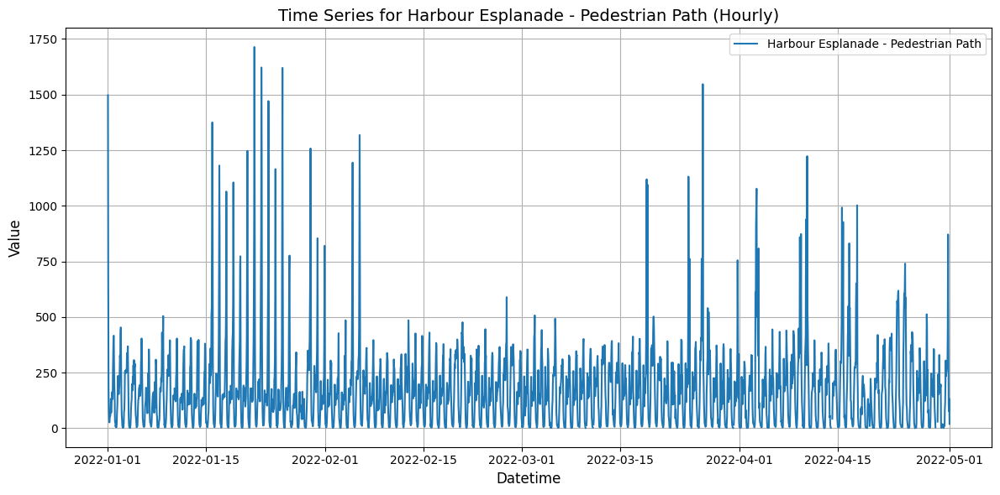

Harbour Esplanade - Bike Path


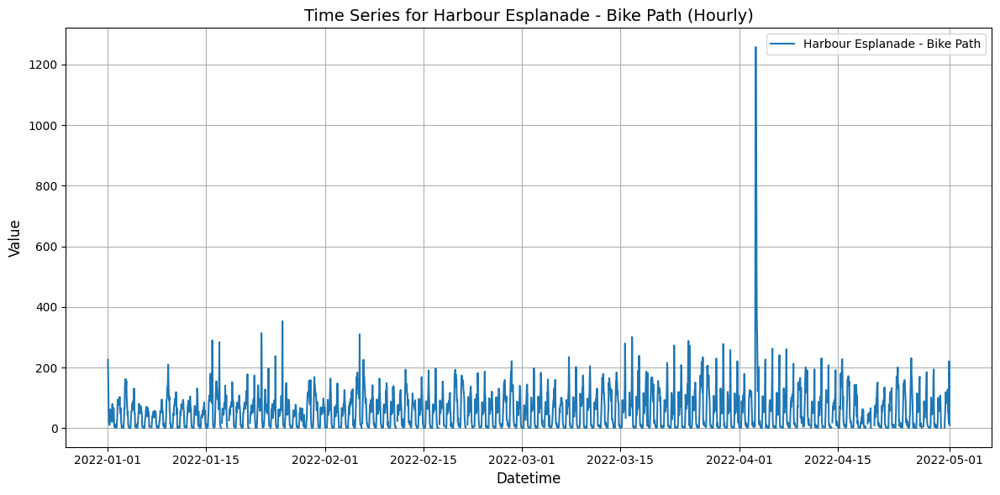

Flinders St (South)


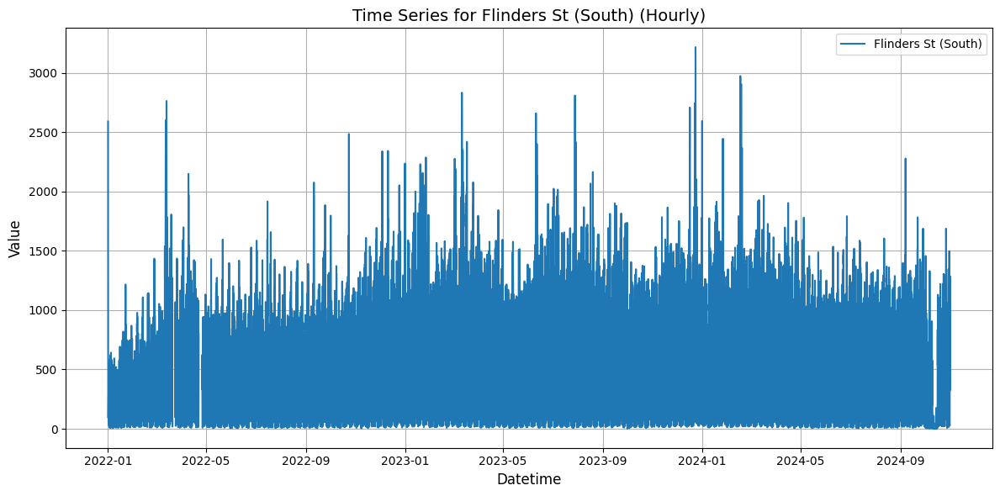

Elizabeth St - Flinders St (East) - New footpath


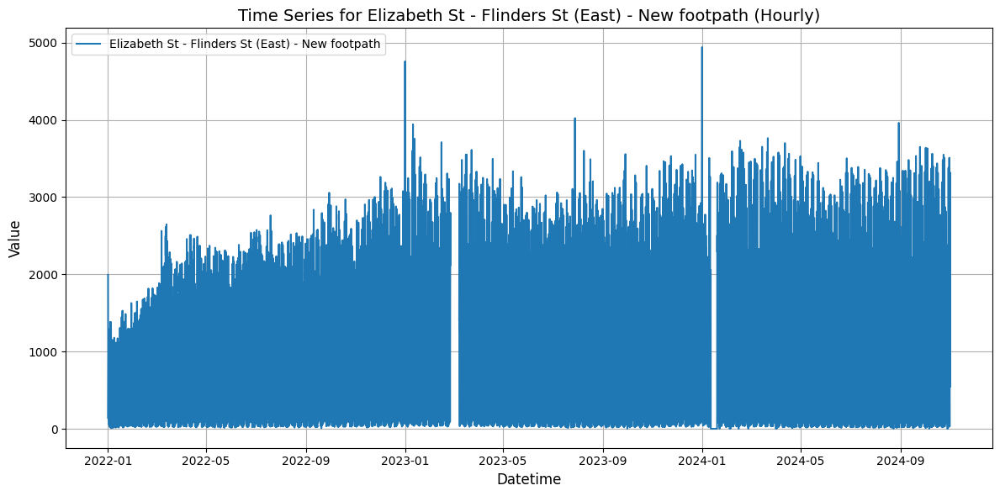

Macaulay Rd (North)


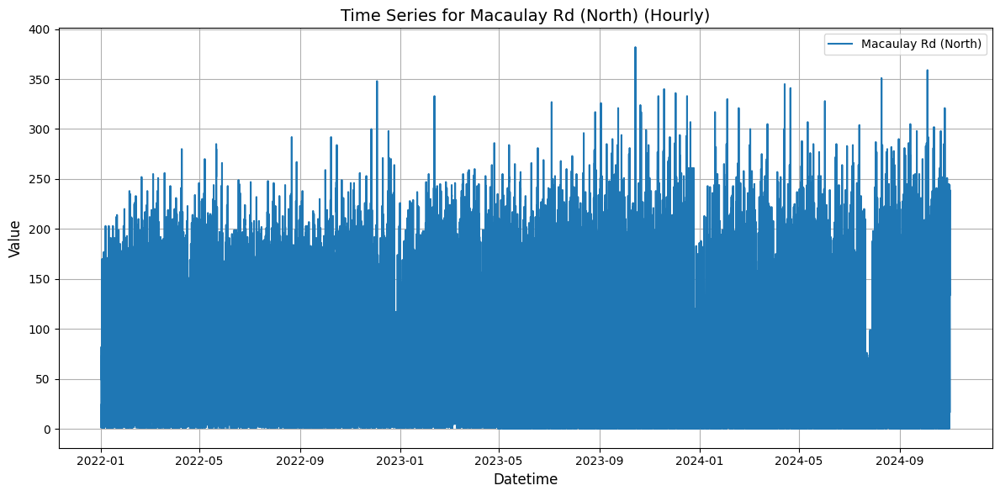

Queensberry St - Errol St (South)


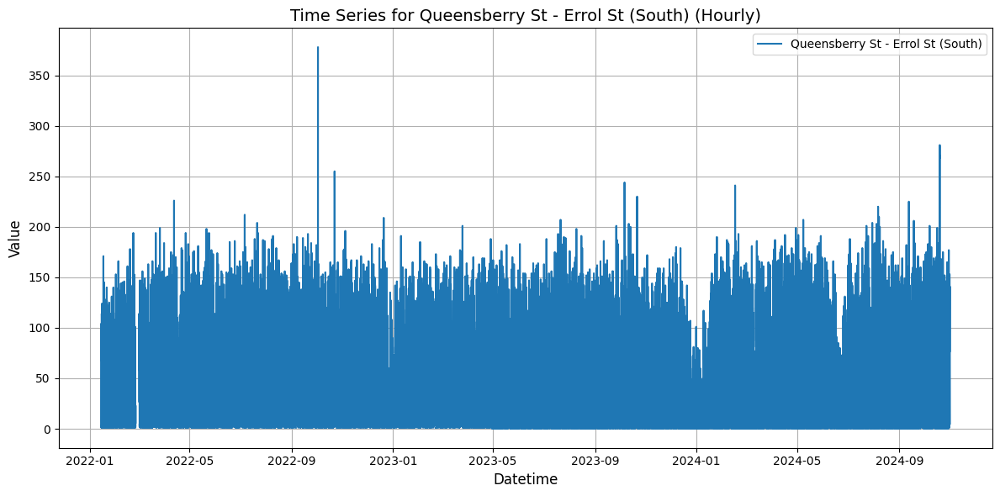

Lincoln-Swanston (West)


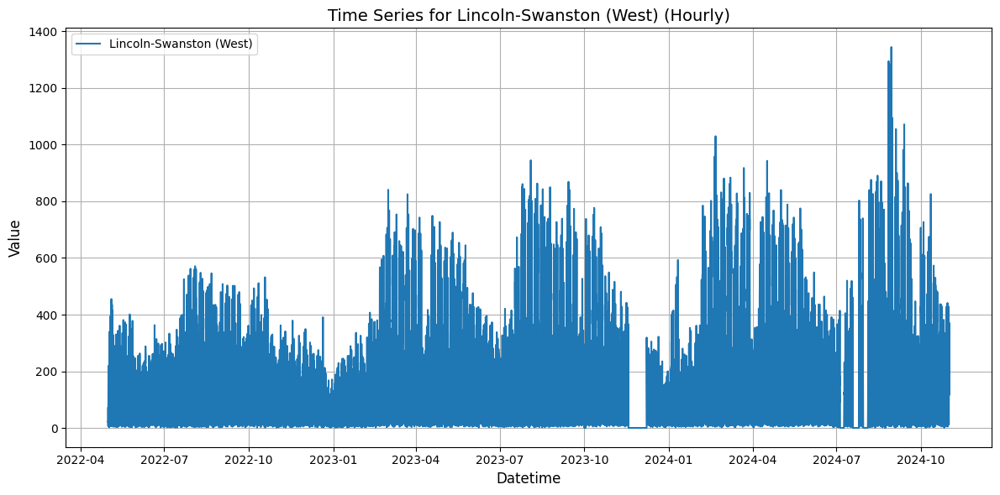

RMIT Building 80


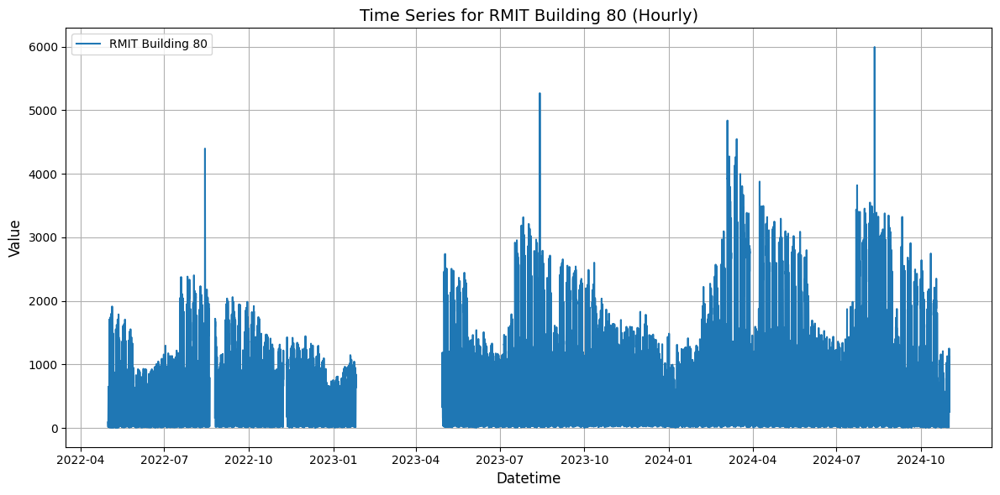

Flinders La - Swanston St (West) Temporary


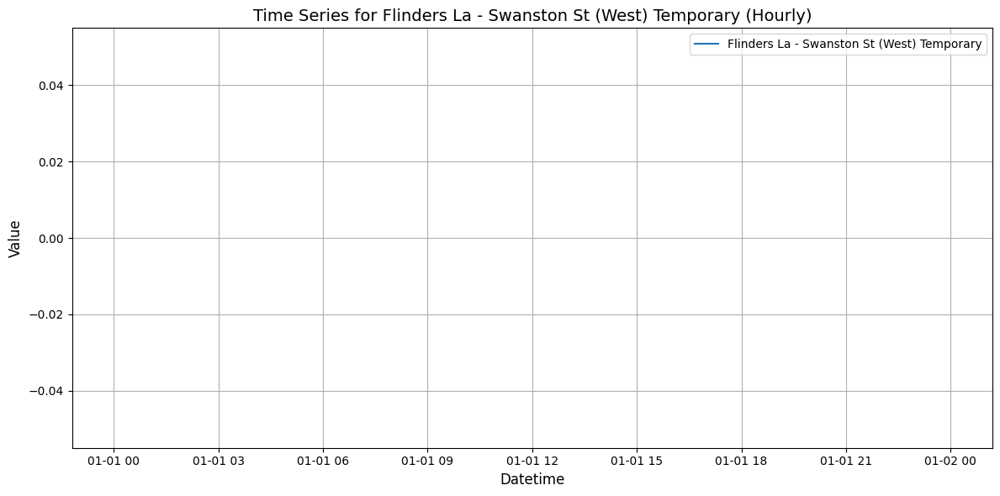

State Library- New


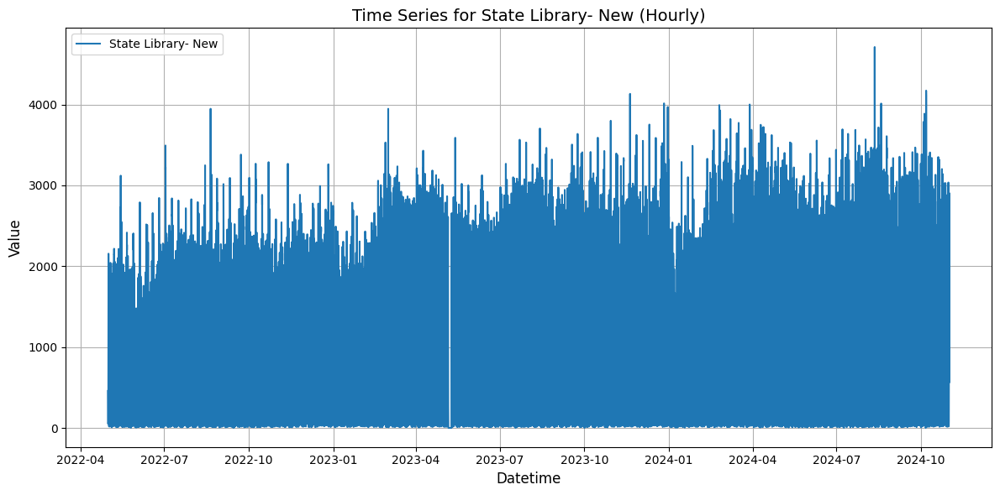

Flinders Ln -Degraves St (South)


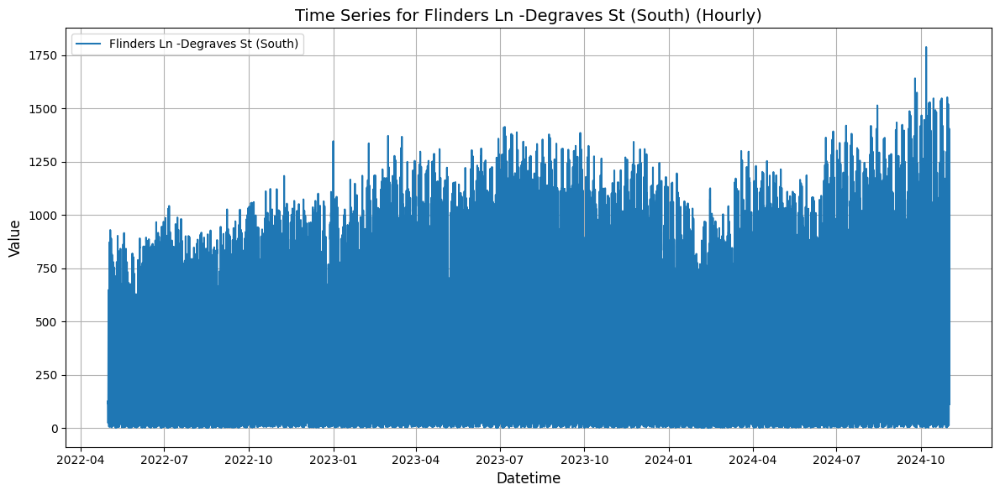

Flinders Ln -Degraves St (North)


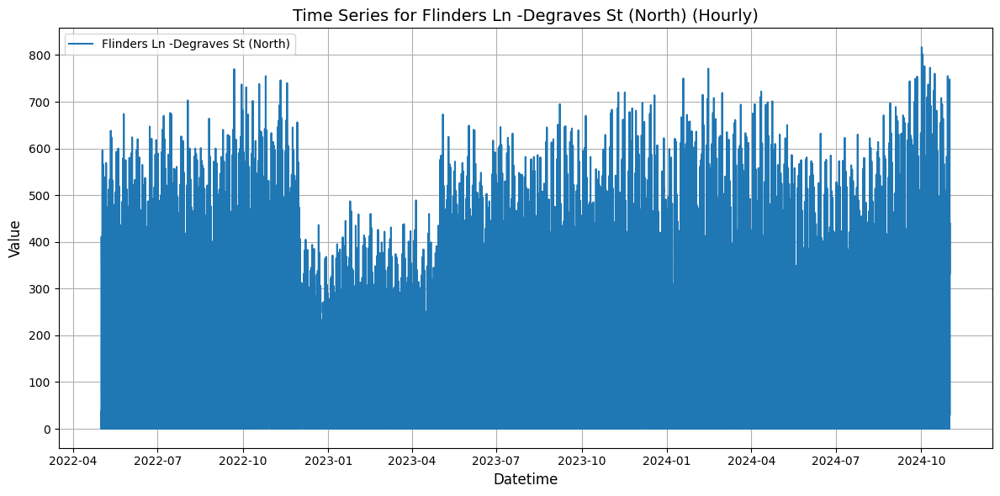

Flinders Ln -Degraves St (Crossing)


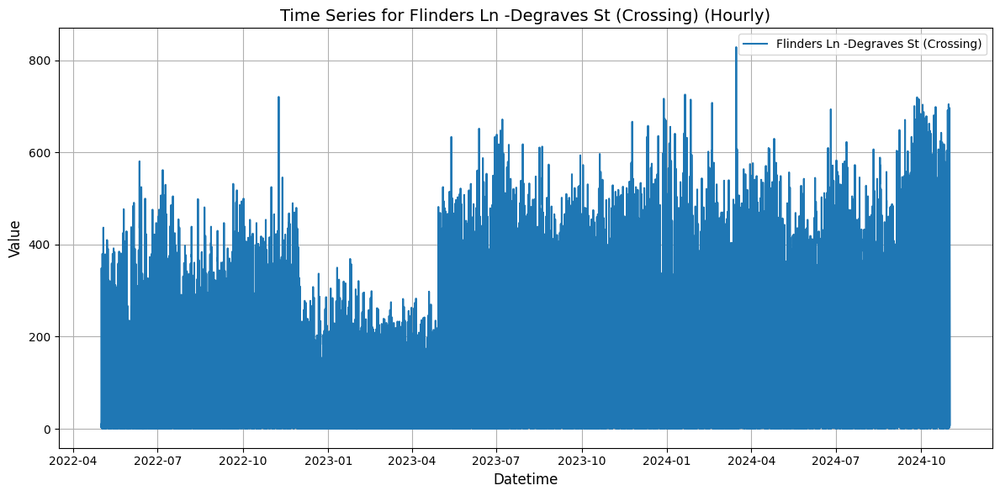

Flinders St- ACMI


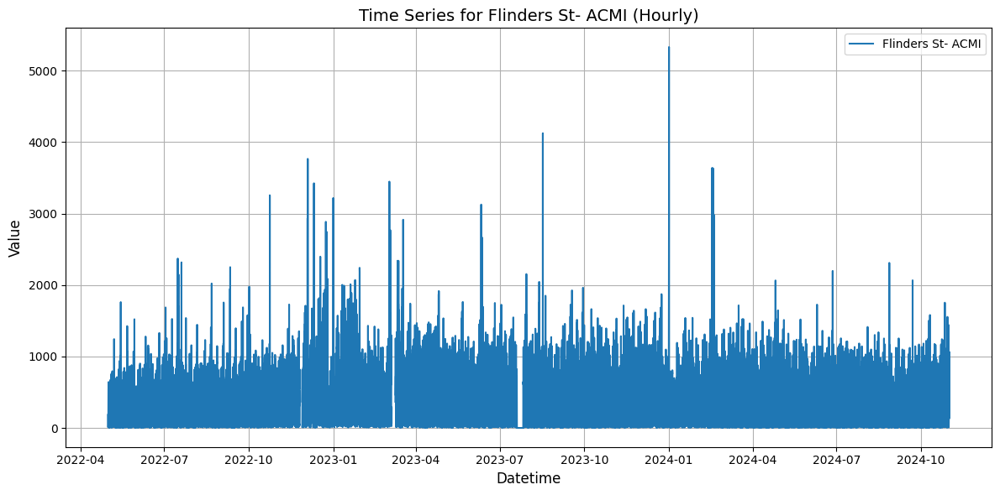

Spring St- Flinders St (West)


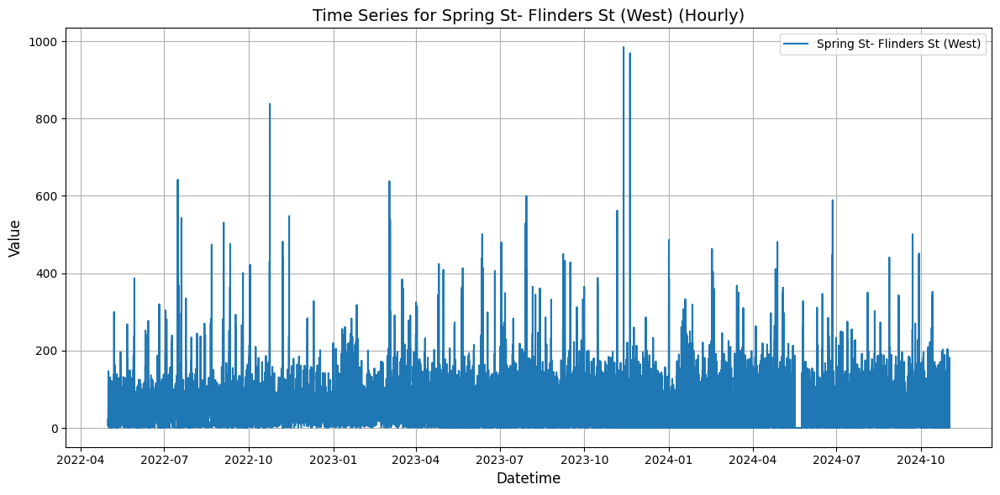

Macaulay Rd-Bellair St


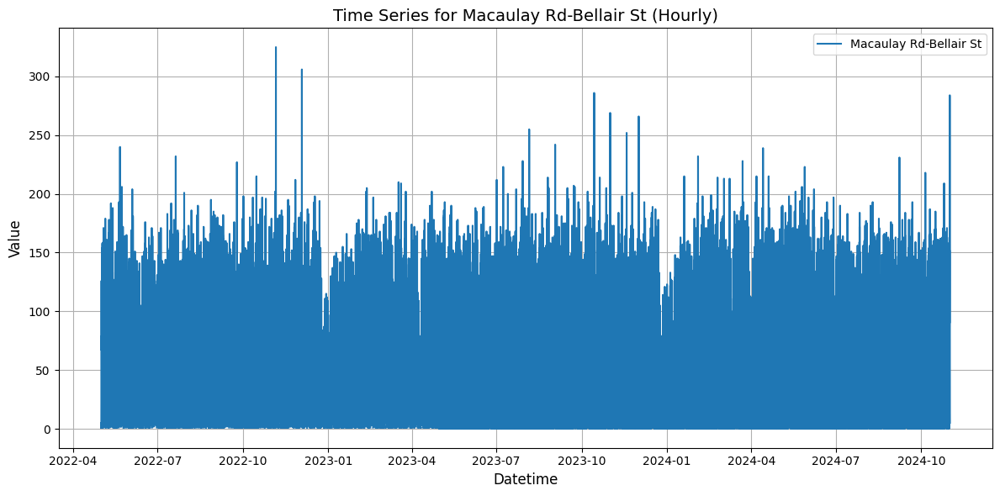

Harbour Esplanade (West) - Pedestrian Path


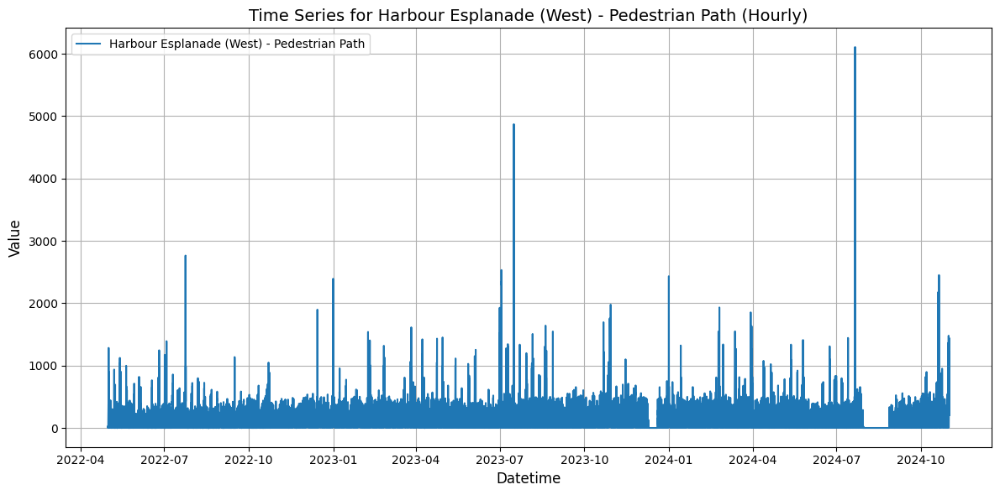

Harbour Esplanade (West) - Bike Path


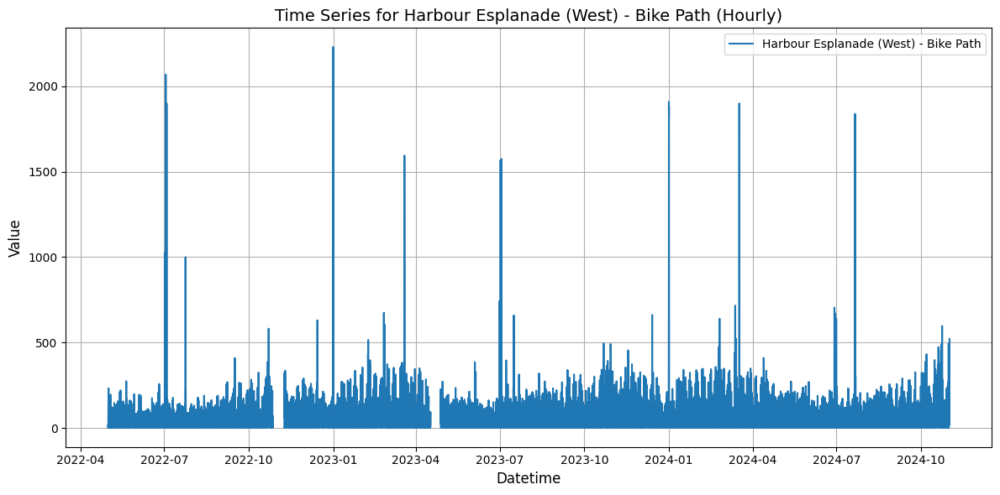

Errol St (West)


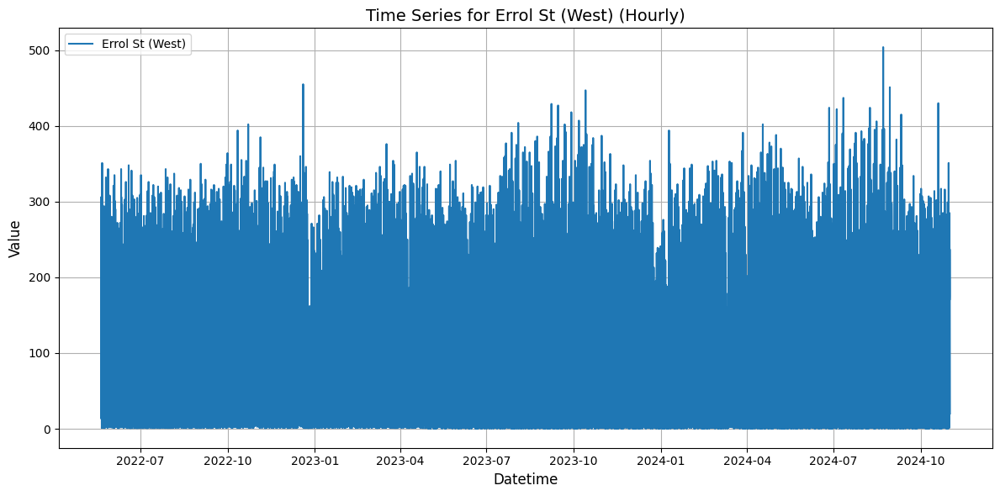

Flagstaff station (East)


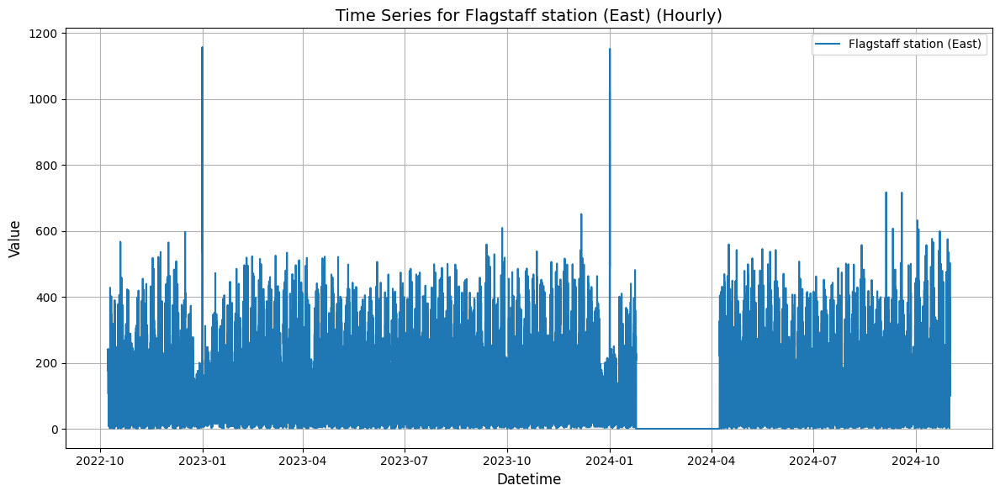

William St - Little Lonsdale St (West)


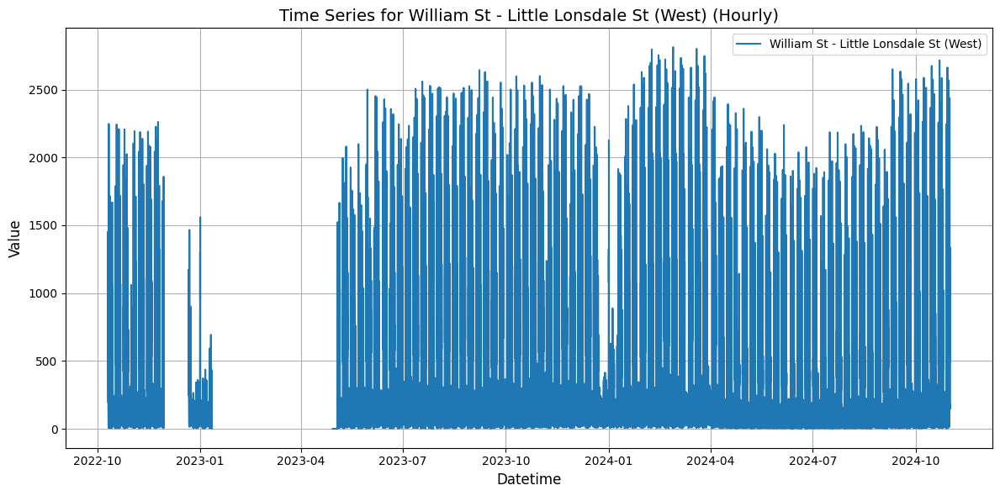

La Trobe St - William St (South)


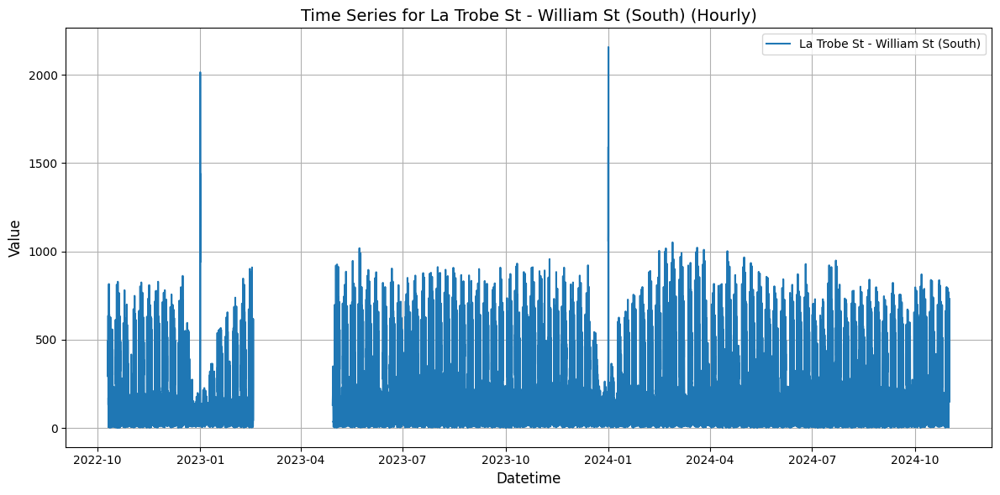

114 Flinders St


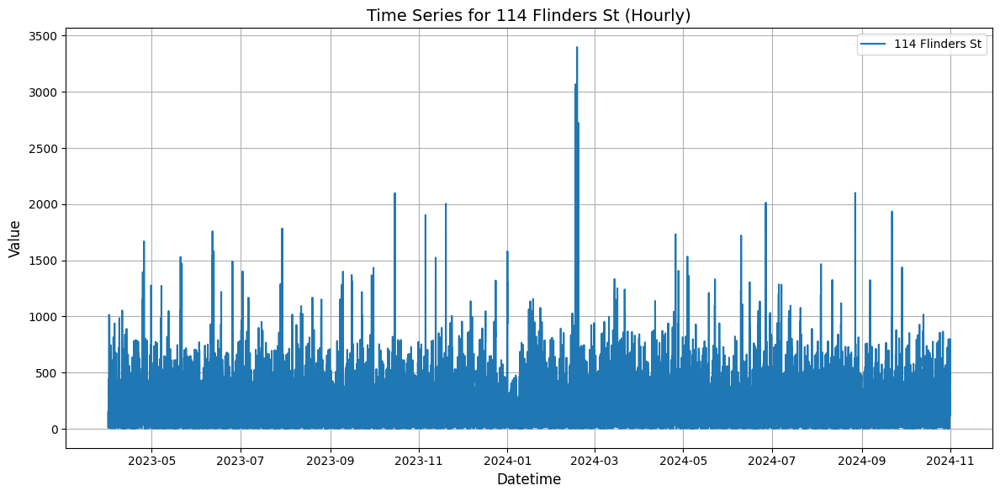

Birrarung Marr East - Batman Ave Bridge Entry


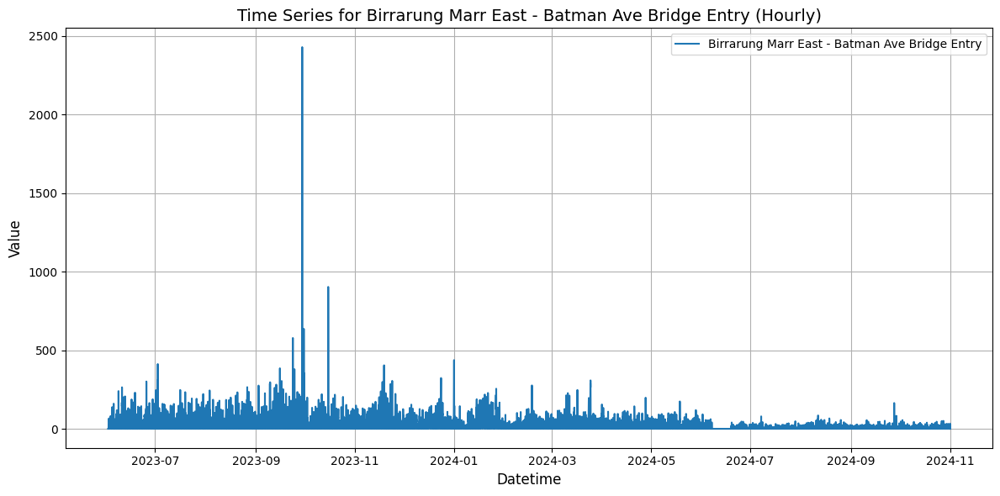

474 Flinders St


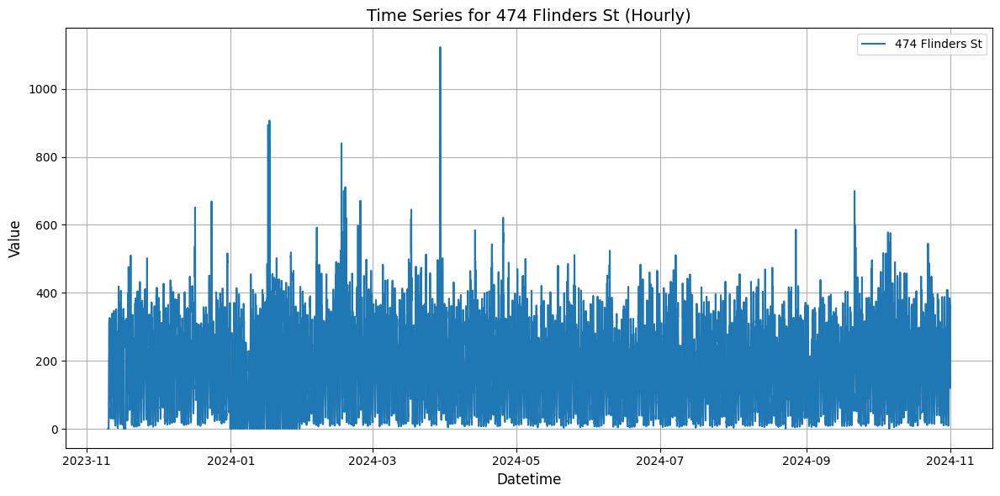

Hamer Hall - River Side


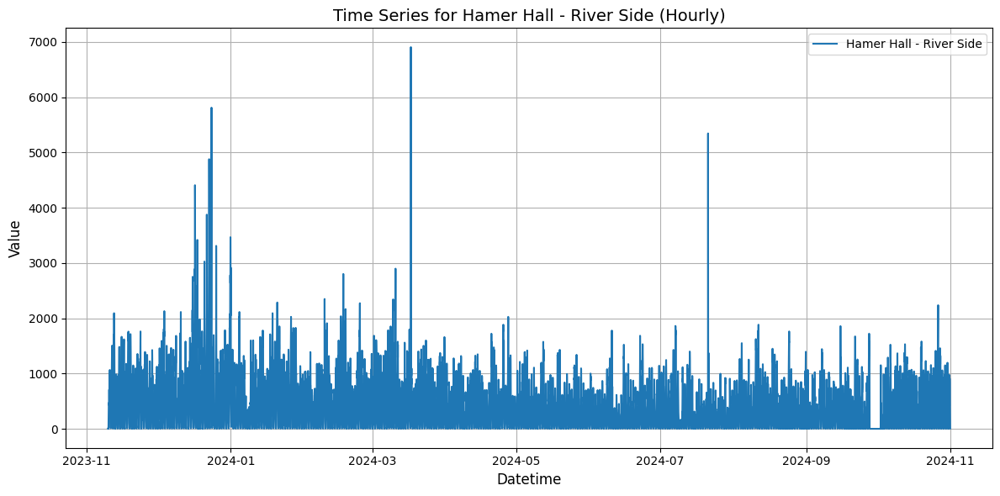

Cnr Bourke St and Harbour Esplanade


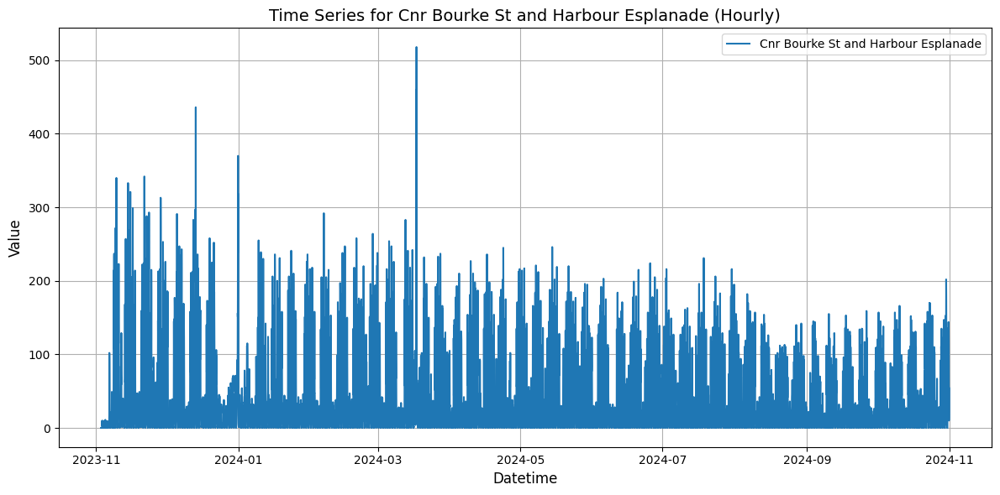

Flinders Walk - Sandridge Bridge


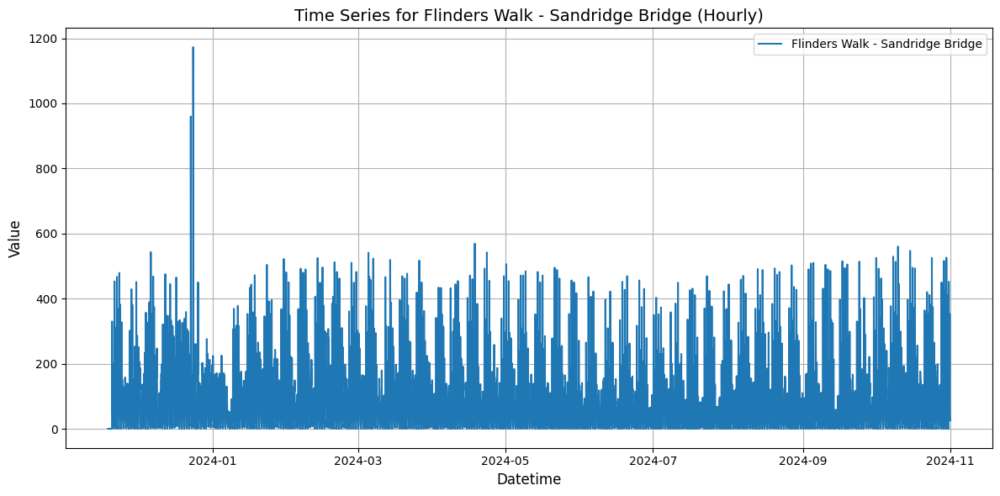

Birrarung Mar - Federation Bridge


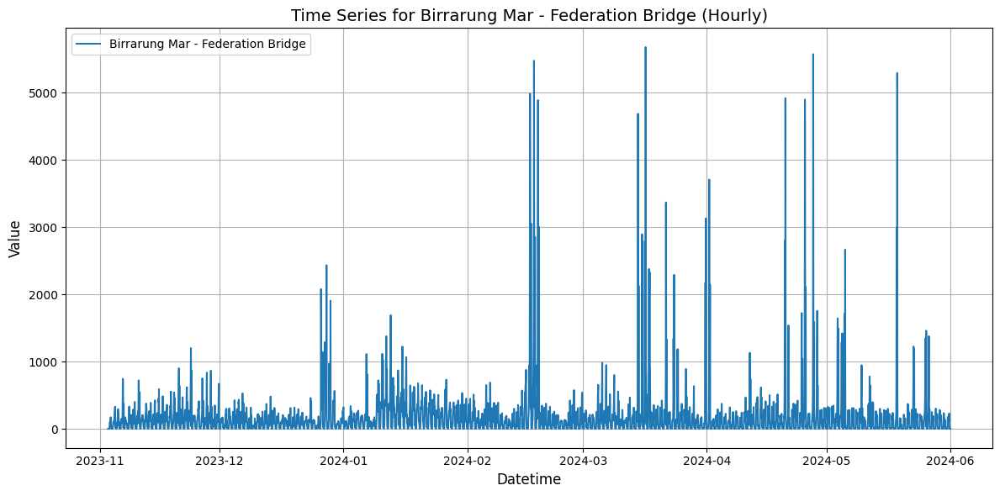

Boyd Park


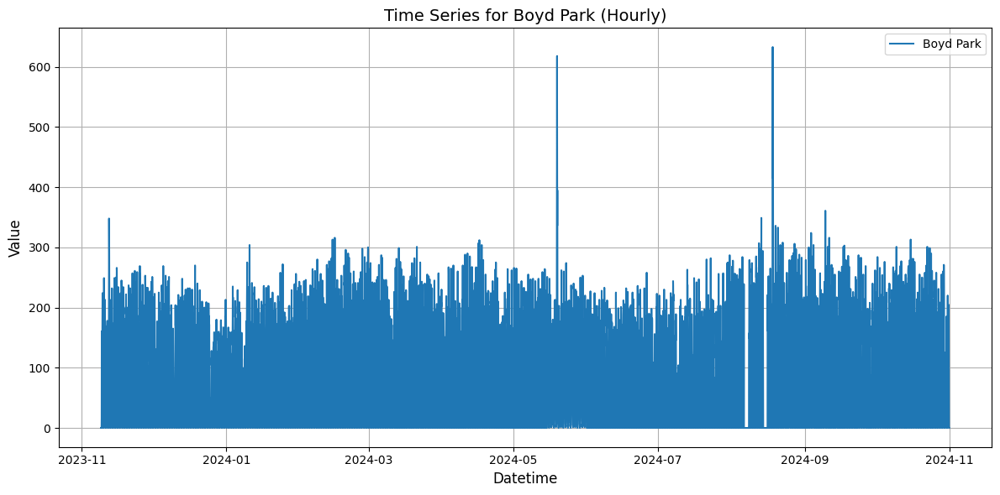

I-Hub 892 Bourke Street


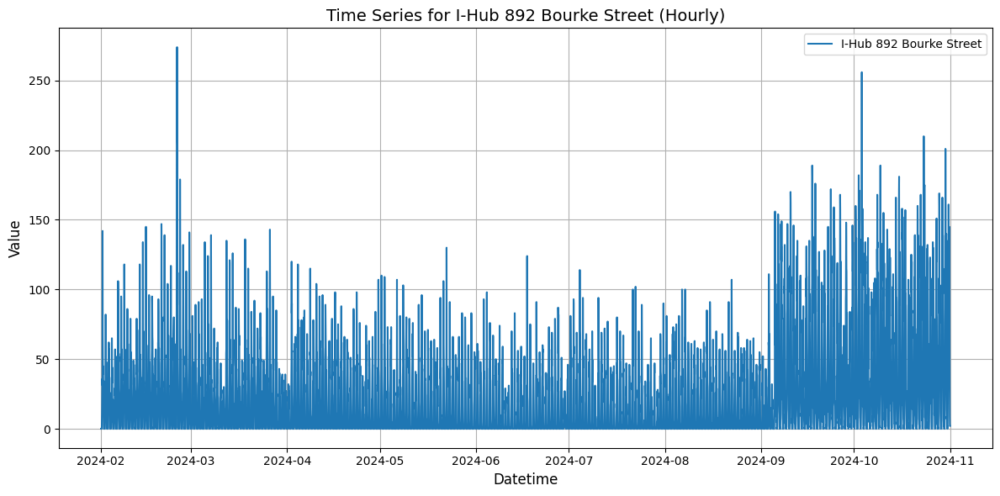

510 Elizabeth St


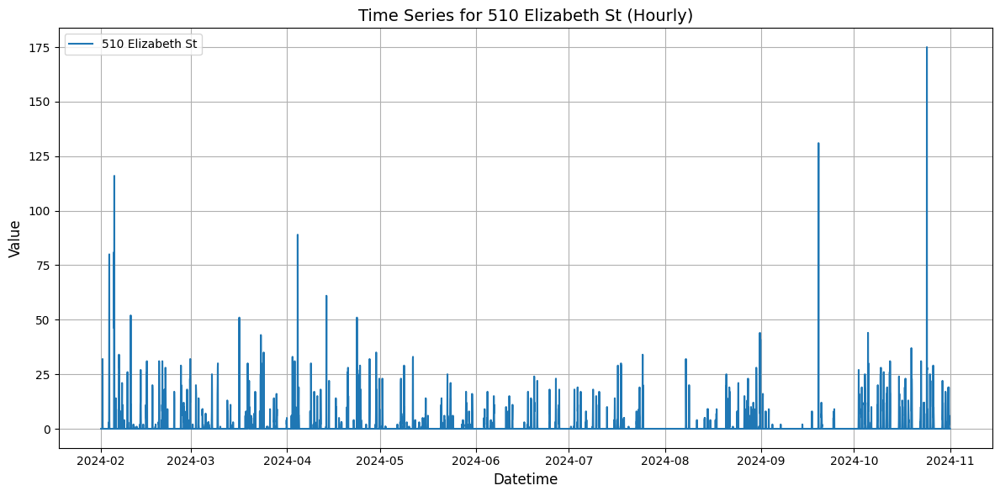

512 Elizabeth St


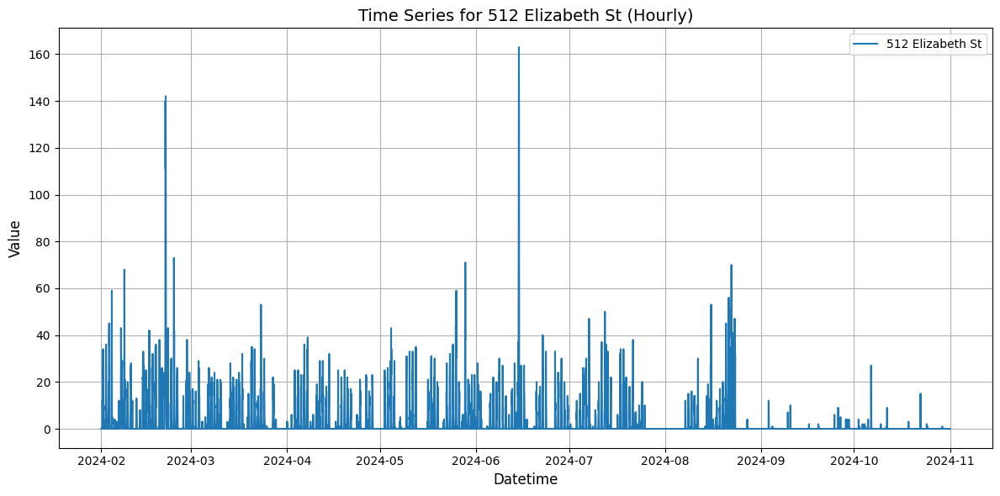

514 Elizabeth St


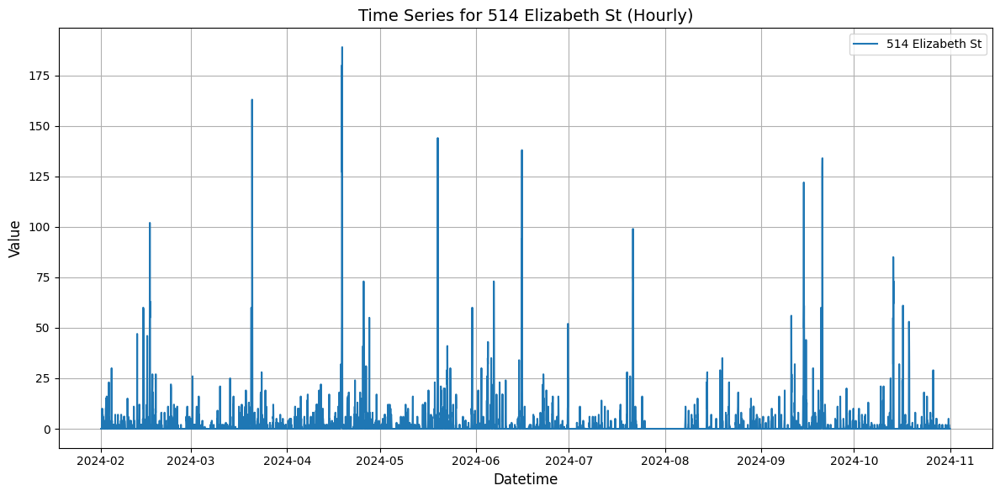

516 Elizabeth St


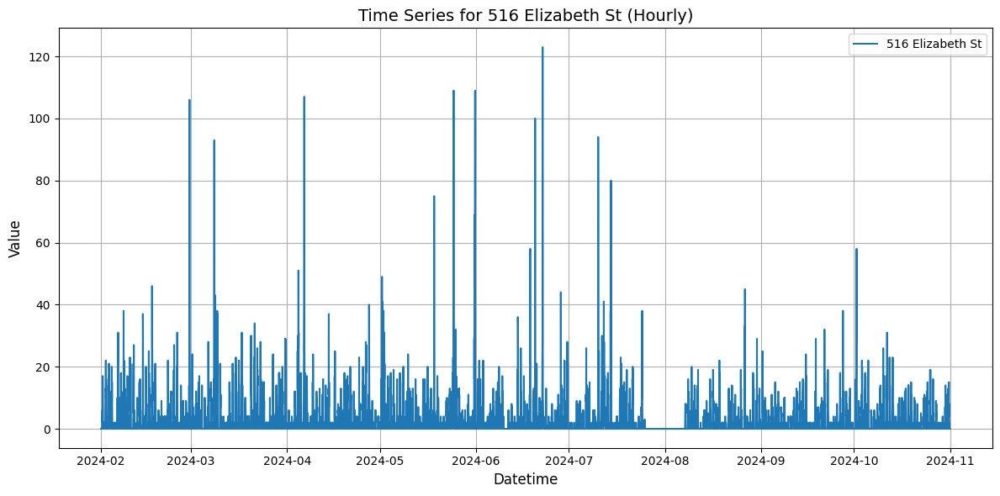

Batman Park


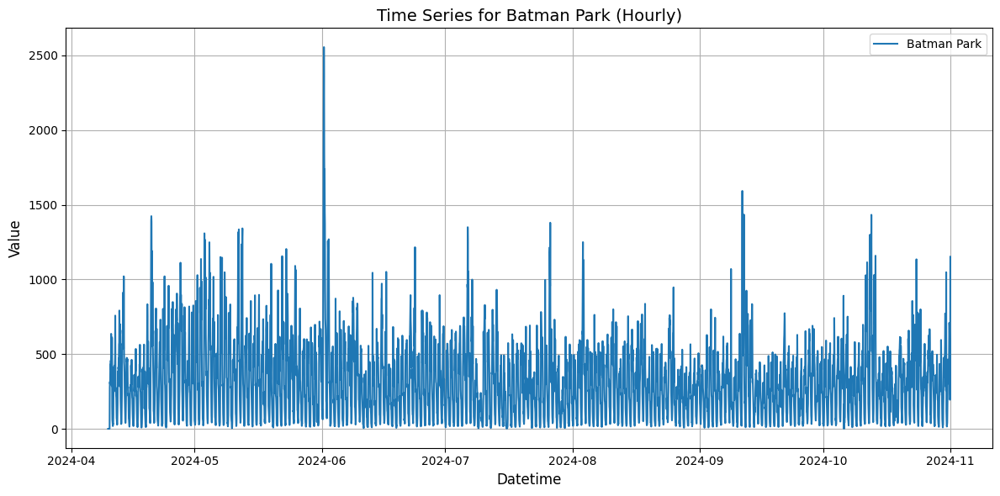

Birrarung Marr - Federation Bridge


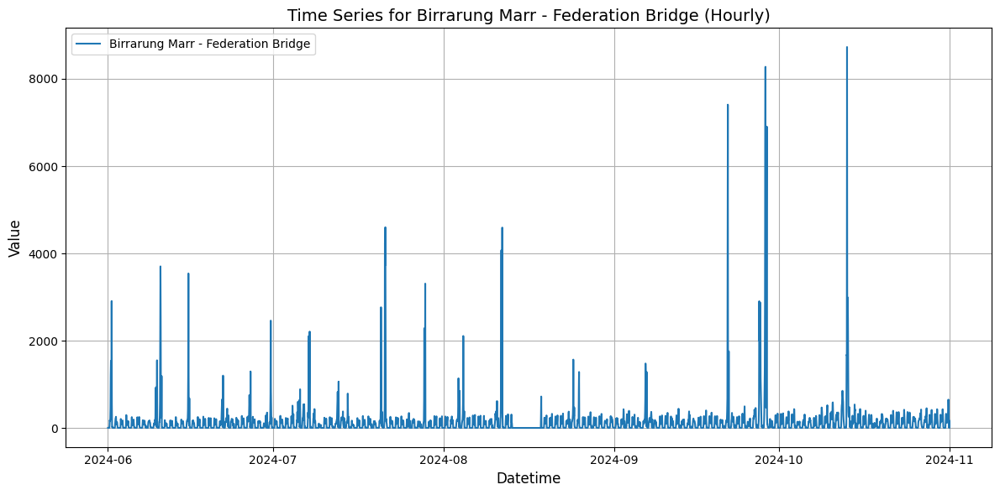

City Baths


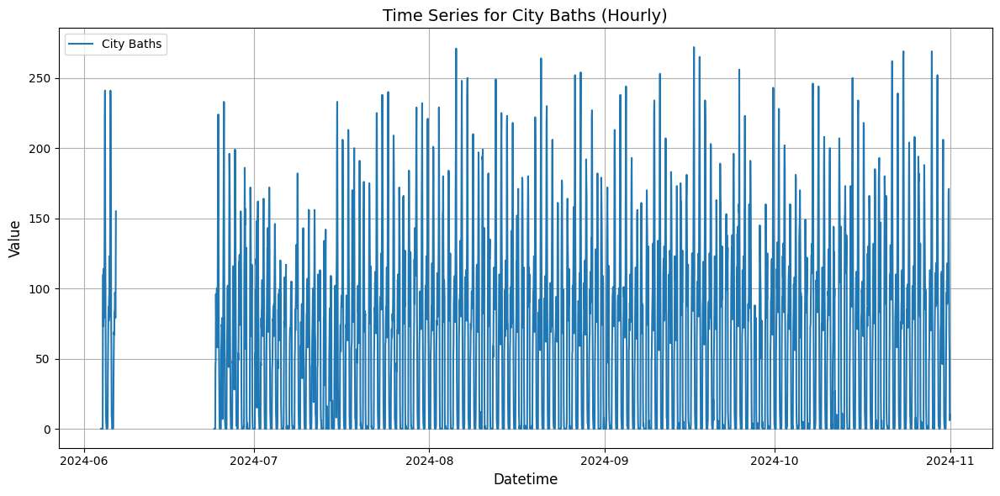

Birrarung Marr – COM Pole 1109


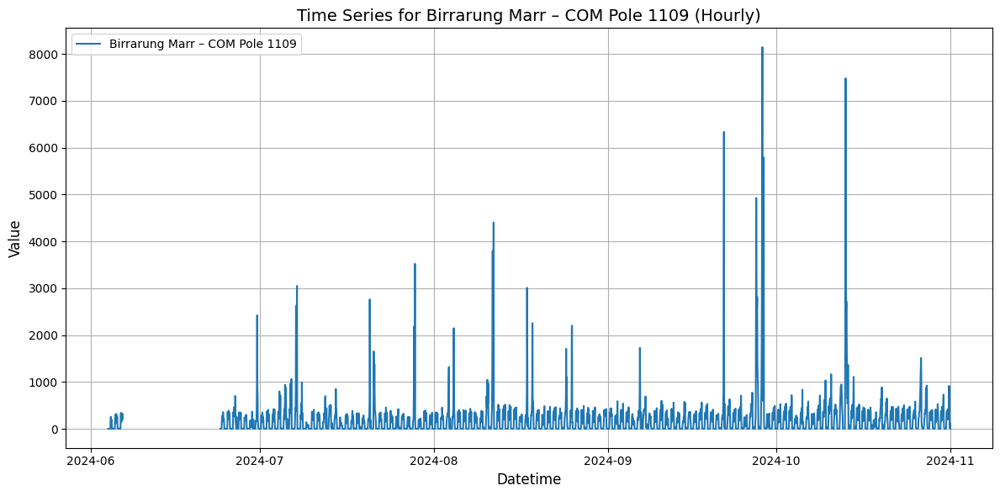

I-Hub Corner of King Street and Latrobe Street


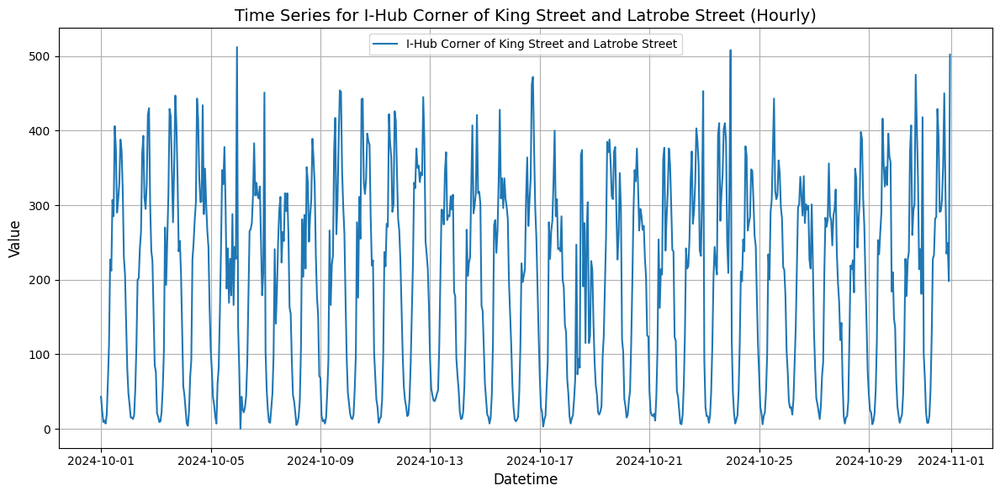

I-Hub 489 Elizabeth Street


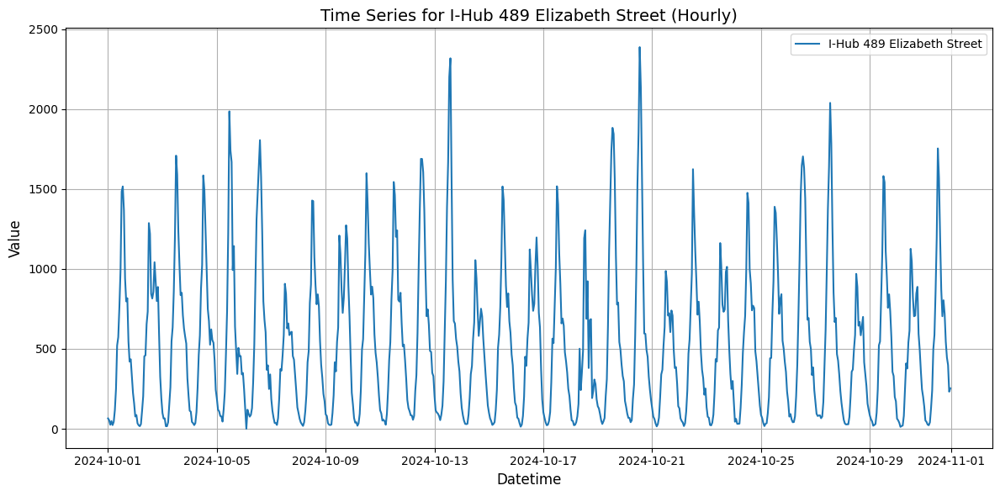

I-Hub 526 La Trobe Street


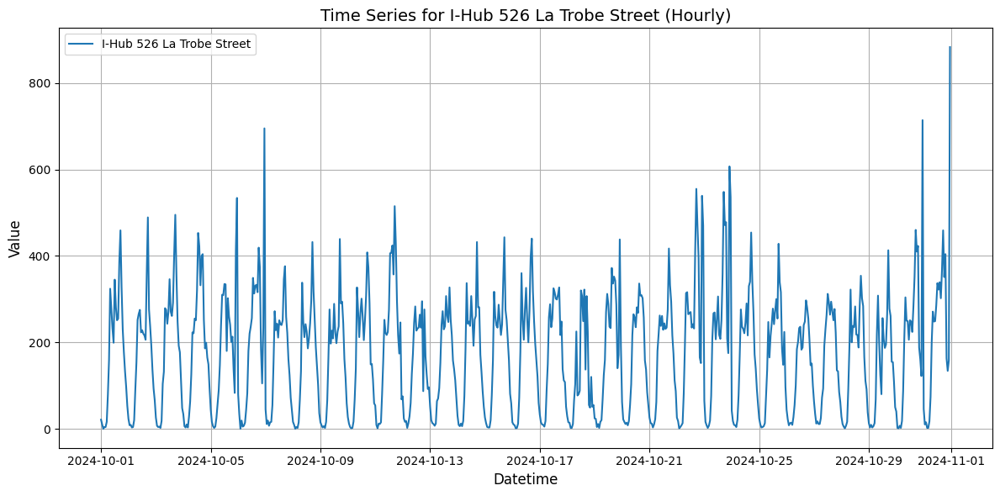

475 Spencer Street


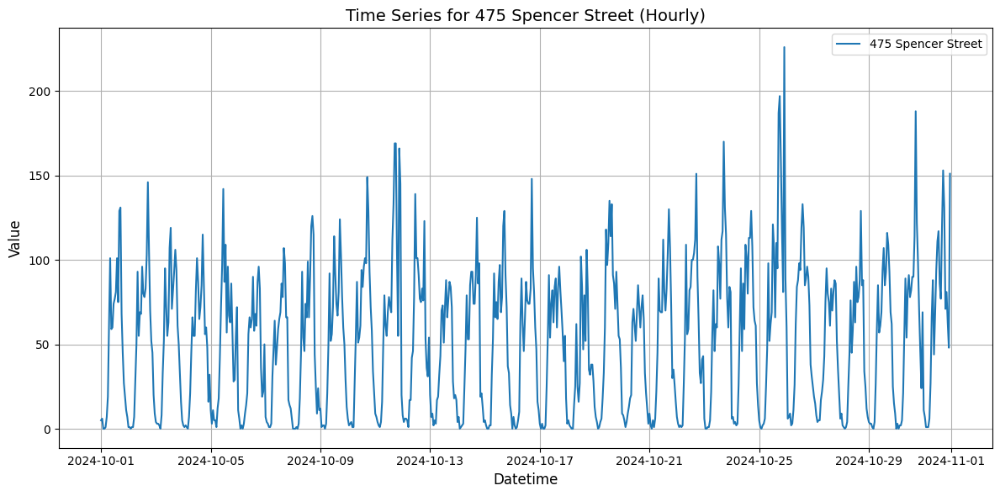

484 Spencer Street


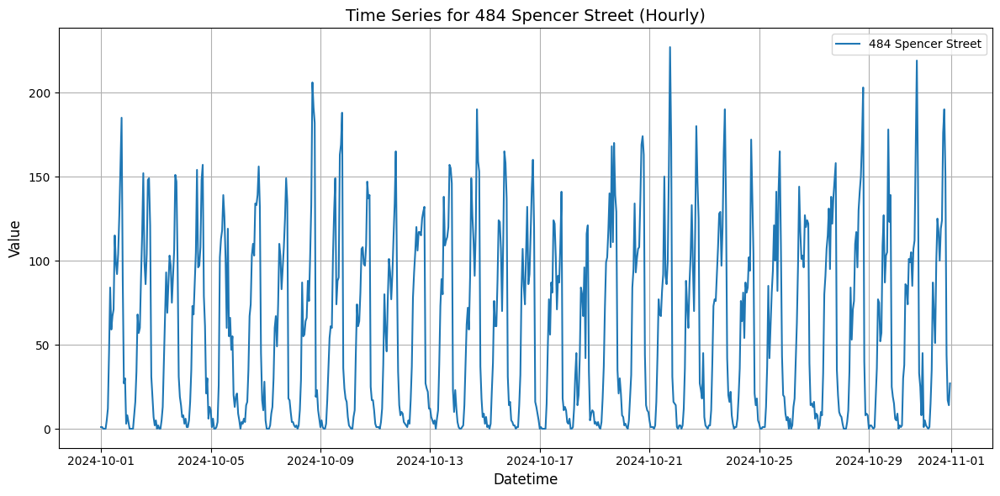

In [7]:
data_folder = '..\\data\\raw'
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
years = ['2022', '2023', '2024']
import os
import pandas as pd
import matplotlib.pyplot as plt

filtered_columns_summary

################################ Do it with no_0


combined_data = pd.DataFrame()

# Load all datasets and combine relevant columns
for year in years:
    for month in months:
        filename = f"{month}_{year}.csv"
        file_path = os.path.join(data_folder, filename)
        if os.path.exists(file_path):
            try:
                filtered_df = pd.read_csv(file_path)

                combined_data = pd.concat([combined_data, filtered_df], ignore_index=True)
            except Exception as e:
                print(f"Error loading {filename}: {e}")
        else:
            print(f"{filename} not found")

# Ensure Date and Hour columns are combined into a datetime index
if not combined_data.empty:
    combined_data['Datetime'] = pd.to_datetime(
        combined_data['Date'], format='%d/%m/%Y', errors='coerce'
    ) + pd.to_timedelta(combined_data['Hour'], unit='h')
    combined_data.set_index('Datetime', inplace=True)
    combined_data.sort_index(inplace=True)

    # Clean numeric columns
    for column in combined_data.columns:
        combined_data[column] = pd.to_numeric(combined_data[column], errors='coerce')


filtering = list_70


# Add value to removign list


# Plot time series for each column in list_70
for column in combined_data.columns:
    if column in combined_data.columns:
        print(f"{column}")
        plt.figure(figsize=(12, 6))
        plt.plot(combined_data.index, combined_data[column], label=column)
        plt.title(f"Time Series for {column} (Hourly)", fontsize=14)
        plt.xlabel("Datetime", fontsize=12)
        plt.ylabel("Value", fontsize=12)
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()
    else:
        print(f"Column {column} not found in combined data.")

### Removing more

In [8]:
# Remove columns with a lot of 0
# List of entries to remove
unwanted_entries = ['State Library','Flagstaff Station', 'Flinders St-Elizabeth St (East)', 'QV Market-Peel St', 'Birrarung Marr','Flinders St-Spring St (West)', 'Flinders St-Swanston St (West)', 'City Square']  # Replace with the actual names of columns you want to remove

# Remove unwanted entries from list_70
list_70_new = [entry for entry in list_70 if entry not in unwanted_entries]

# Print to confirm removal
print("Updated list_70 after removing unwanted entries:")


Updated list_70 after removing unwanted entries:


# Chosen data

In [9]:
data_folder = '..\\data\\raw'
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
years = ['2022', '2023', '2024']
import os
import pandas as pd
import matplotlib.pyplot as plt
import os
import pandas as pd
import plotly.graph_objects as go

# Placeholder for combined data
combined_data = pd.DataFrame()

# Load all datasets and combine relevant columns
for year in years:
    for month in months:
        filename = f"{month}_{year}.csv"
        file_path = os.path.join(data_folder, filename)
        if os.path.exists(file_path):
            try:
                df = pd.read_csv(file_path)
                # Ensure 'Date' and 'Hour' are included
                required_cols = ['Date', 'Hour'] + list_70
                if all(col in df.columns for col in required_cols):
                    filtered_df = df[required_cols].copy()
                    combined_data = pd.concat([combined_data, filtered_df], ignore_index=True)
            except Exception as e:
                print(f"Error loading {filename}: {e}")
        else:
            print(f"{filename} not found")

# Ensure Date and Hour columns are combined into a datetime index
if not combined_data.empty:
    combined_data['Datetime'] = pd.to_datetime(
        combined_data['Date'], format='%d/%m/%Y', errors='coerce'
    ) + pd.to_timedelta(combined_data['Hour'], unit='h')
    combined_data.set_index('Datetime', inplace=True)
    combined_data.sort_index(inplace=True)

    # Clean numeric columns
    for column in list_70_new:
        combined_data[column] = pd.to_numeric(combined_data[column], errors='coerce')

chosen = ['Little Collins St-Swanston St (East)'
,
'Faraday St-Lygon St (West)'
,
'Melbourne Central'
,
'Chinatown-Lt Bourke St (South)'
,
'Lonsdale St (South)'
,
'Lygon St (West)'
]


# Create an interactive plot for the selected column
selected_column = chosen
for selected_column in chosen:
    if selected_column in combined_data.columns:
        fig = go.Figure()
        fig.add_trace(go.Scatter(
            x=combined_data.index,
            y=combined_data[selected_column],
            mode='lines',
            name=selected_column
        ))
        fig.update_layout(
            title=f"Interactive Time Series for {selected_column} (Hourly)",
            xaxis_title="Datetime",
            yaxis_title="Value",
            hovermode="x unified"
        )
        fig.show()
    else:
        print(f"Column {selected_column} not found in combined data.")

November_2024.csv not found
December_2024.csv not found


# Saving

In [2]:
import os
import pandas as pd

# Data folder and parameters
data_folder = '..\\data\\raw'
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
years = ['2022', '2023', '2024']

# Columns to keep
chosen = [
    'Little Collins St-Swanston St (East)',
    'Faraday St-Lygon St (West)',
    'Melbourne Central',
    'Chinatown-Lt Bourke St (South)',
    'Lonsdale St (South)',
    'Lygon St (West)'
]

# Placeholder for combined data
combined_data = pd.DataFrame()

# Load all datasets and combine relevant columns
for year in years:
    for month in months:
        filename = f"{month}_{year}.csv"
        file_path = os.path.join(data_folder, filename)
        if os.path.exists(file_path):
            try:
                # Read the file
                df = pd.read_csv(file_path)
                
                # Ensure 'Date' and 'Hour' are included along with chosen columns
                required_cols = ['Date', 'Hour'] + chosen
                if all(col in df.columns for col in required_cols):
                    # Filter only the required columns
                    filtered_df = df[required_cols].copy()
                    
                    # Append to the combined dataframe
                    combined_data = pd.concat([combined_data, filtered_df], ignore_index=True)
                else:
                    print(f"Required columns missing in {filename}")
            except Exception as e:
                print(f"Error loading {filename}: {e}")
        else:
            print(f"{filename} not found")

# Process the combined data
if not combined_data.empty:
    # Combine Date and Hour into a Datetime column
    combined_data['Datetime'] = pd.to_datetime(
        combined_data['Date'], format='%d/%m/%Y', errors='coerce'
    ) + pd.to_timedelta(combined_data['Hour'], unit='h')
    
    # Set Datetime as index and sort
    combined_data.set_index('Datetime', inplace=True)
    combined_data.sort_index(inplace=True)
    
    # Convert numeric columns
    for column in chosen:
        combined_data[column] = pd.to_numeric(combined_data[column], errors='coerce')

    # Filter dates after March 2022
    cutoff_date = '2022-04-01'
    combined_data = combined_data[combined_data.index >= cutoff_date]



# Display the result
combined_data


November_2024.csv not found
December_2024.csv not found


,Date,Hour,Little Collins St-Swanston St (East),Faraday St-Lygon St (West),Melbourne Central,Chinatown-Lt Bourke St (South),Lonsdale St (South),Lygon St (West)
Datetime,,,,,,,,
2022-04-01 00:00:00,01/04/2022,0,166.0,24.0,380.0,73.0,215.0,48.0
2022-04-01 01:00:00,01/04/2022,1,108.0,9.0,198.0,79.0,156.0,11.0
2022-04-01 02:00:00,01/04/2022,2,62.0,5.0,137.0,23.0,47.0,7.0
2022-04-01 03:00:00,01/04/2022,3,31.0,NaN,81.0,48.0,32.0,5.0
2022-04-01 04:00:00,01/04/2022,4,10.0,6.0,76.0,28.0,10.0,13.0
...,...,...,...,...,...,...,...,...
2024-10-31 19:00:00,31/10/2024,19,1015.0,278.0,1600.0,657.0,708.0,329.0
2024-10-31 20:00:00,31/10/2024,20,943.0,347.0,1625.0,568.0,598.0,347.0
2024-10-31 21:00:00,31/10/2024,21,837.0,245.0,1426.0,640.0,675.0,311.0


In [3]:
combined_data['Weekday'] = combined_data.index.weekday + 1
combined_data['Month'] = combined_data.index.month
combined_data['Season'] = combined_data['Month'].map({12: 'Winter', 1: 'Winter', 2: 'Winter',
                                                      3: 'Spring', 4: 'Spring', 5: 'Spring',
                                                      6: 'Summer', 7: 'Summer', 8: 'Summer',
                                                      9: 'Fall', 10: 'Fall', 11: 'Fall'})

# Display the updated DataFrame
combined_data.head(3)

,Date,Hour,Little Collins St-Swanston St (East),Faraday St-Lygon St (West),Melbourne Central,Chinatown-Lt Bourke St (South),Lonsdale St (South),Lygon St (West),Weekday,Month,Season
Datetime,,,,,,,,,,,
2022-04-01 00:00:00,01/04/2022,0,166.0,24.0,380.0,73.0,215.0,48.0,5,4,Spring
2022-04-01 01:00:00,01/04/2022,1,108.0,9.0,198.0,79.0,156.0,11.0,5,4,Spring
2022-04-01 02:00:00,01/04/2022,2,62.0,5.0,137.0,23.0,47.0,7.0,5,4,Spring


In [4]:
import holidays

# Create a list of public holidays in Victoria
australia_holidays = holidays.Australia(state='VIC')

# Add a new column to indicate whether each date is a public holiday
combined_data['IsPublicHoliday'] = [
    1 if date in australia_holidays else 0 for date in combined_data.index.date
]

combined_data.head(3)

,Date,Hour,Little Collins St-Swanston St (East),Faraday St-Lygon St (West),Melbourne Central,Chinatown-Lt Bourke St (South),Lonsdale St (South),Lygon St (West),Weekday,Month,Season,IsPublicHoliday
Datetime,,,,,,,,,,,,
2022-04-01 00:00:00,01/04/2022,0,166.0,24.0,380.0,73.0,215.0,48.0,5,4,Spring,0
2022-04-01 01:00:00,01/04/2022,1,108.0,9.0,198.0,79.0,156.0,11.0,5,4,Spring,0
2022-04-01 02:00:00,01/04/2022,2,62.0,5.0,137.0,23.0,47.0,7.0,5,4,Spring,0


In [5]:
output_path = '..\\data\\processed'
output_file = 'first_5_points.csv'

output_path = os.path.join(output_path, output_file)

combined_data.to_csv(output_path)

# Add Weather

In [6]:
weather_df = pd.read_csv('..\\data\\raw\\WeatherData.csv')
weather_df.head(2)

,dt,dt_iso,timezone,city_name,lat,lon,temp,feels_like,temp_min,temp_max,...,wind_speed,wind_deg,wind_gust,rain_1h,rain_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,946684800,2000-01-01 00:00:00 +0000 UTC,39600,Melbourne Central,-37.810236,144.962765,16.36,15.46,15.65,17.08,...,7.7,150,NaN,NaN,NaN,62,803,Clouds,broken clouds,04d
1,946688400,2000-01-01 01:00:00 +0000 UTC,39600,Melbourne Central,-37.810236,144.962765,19.56,18.67,17.47,19.82,...,7.7,170,NaN,NaN,NaN,40,802,Clouds,scattered clouds,03d


In [7]:
weather_df.columns

Index(['dt', 'dt_iso', 'timezone', 'city_name', 'lat', 'lon', 'temp',
       'feels_like', 'temp_min', 'temp_max', 'pressure', 'sea_level',
       'grnd_level', 'humidity', 'wind_speed', 'wind_deg', 'wind_gust',
       'rain_1h', 'rain_3h', 'clouds_all', 'weather_id', 'weather_main',
       'weather_description', 'weather_icon'],
      dtype='object')

In [8]:
# Drop columns 
weather_dropped = weather_df.drop(columns=['dt', 'city_name', 'timezone', 'lat', 'lon', 'temp_min', 'temp_max', 'pressure', 'sea_level', 'grnd_level', 'wind_speed', 'wind_deg', 'wind_gust', 'weather_id', 'weather_main', 'weather_description', 'weather_icon'])

print(weather_dropped.columns)

weather_dropped.head(2)

Index(['dt_iso', 'temp', 'feels_like', 'humidity', 'rain_1h', 'rain_3h',
       'clouds_all'],
      dtype='object')


,dt_iso,temp,feels_like,humidity,rain_1h,rain_3h,clouds_all
0,2000-01-01 00:00:00 +0000 UTC,16.36,15.46,54,NaN,NaN,62
1,2000-01-01 01:00:00 +0000 UTC,19.56,18.67,42,NaN,NaN,40


In [9]:
# Count how often is 0 in each column
weather_dropped['rain_1h'].isin([0]).sum()

0

In [10]:
# Count NA in all columns
weather_dropped.isna().sum()

dt_iso             0
temp               0
feels_like         0
humidity           0
rain_1h       192736
rain_3h       221123
clouds_all         0
dtype: int64

In [11]:
# Replace NA with 0
weather_dropped.fillna(0, inplace=True)
weather_dropped

,dt_iso,temp,feels_like,humidity,rain_1h,rain_3h,clouds_all
0,2000-01-01 00:00:00 +0000 UTC,16.36,15.46,54,0.0,0.0,62
1,2000-01-01 01:00:00 +0000 UTC,19.56,18.67,42,0.0,0.0,40
2,2000-01-01 02:00:00 +0000 UTC,17.40,16.45,48,0.0,0.0,100
3,2000-01-01 03:00:00 +0000 UTC,18.25,17.36,47,0.0,0.0,75
4,2000-01-01 04:00:00 +0000 UTC,18.79,18.03,50,0.0,0.0,40
...,...,...,...,...,...,...,...
221156,2024-11-27 19:00:00 +0000 UTC,15.99,16.02,91,0.0,0.0,75
221157,2024-11-27 20:00:00 +0000 UTC,16.74,16.77,88,0.0,0.0,75
221158,2024-11-27 21:00:00 +0000 UTC,18.29,18.32,82,0.0,0.0,40
221159,2024-11-27 22:00:00 +0000 UTC,19.31,19.31,77,0.0,0.0,40


In [12]:
weather_dropped

,dt_iso,temp,feels_like,humidity,rain_1h,rain_3h,clouds_all
0,2000-01-01 00:00:00 +0000 UTC,16.36,15.46,54,0.0,0.0,62
1,2000-01-01 01:00:00 +0000 UTC,19.56,18.67,42,0.0,0.0,40
2,2000-01-01 02:00:00 +0000 UTC,17.40,16.45,48,0.0,0.0,100
3,2000-01-01 03:00:00 +0000 UTC,18.25,17.36,47,0.0,0.0,75
4,2000-01-01 04:00:00 +0000 UTC,18.79,18.03,50,0.0,0.0,40
...,...,...,...,...,...,...,...
221156,2024-11-27 19:00:00 +0000 UTC,15.99,16.02,91,0.0,0.0,75
221157,2024-11-27 20:00:00 +0000 UTC,16.74,16.77,88,0.0,0.0,75
221158,2024-11-27 21:00:00 +0000 UTC,18.29,18.32,82,0.0,0.0,40
221159,2024-11-27 22:00:00 +0000 UTC,19.31,19.31,77,0.0,0.0,40


In [13]:
# Load normal data
ped_df = pd.read_csv('..\\data\\processed\\first_5_points.csv', index_col='Datetime', parse_dates=True)
ped_df.head(2)

,Date,Hour,Little Collins St-Swanston St (East),Faraday St-Lygon St (West),Melbourne Central,Chinatown-Lt Bourke St (South),Lonsdale St (South),Lygon St (West),Weekday,Month,Season,IsPublicHoliday
Datetime,,,,,,,,,,,,
2022-04-01 00:00:00,01/04/2022,0,166.0,24.0,380.0,73.0,215.0,48.0,5,4,Spring,0
2022-04-01 01:00:00,01/04/2022,1,108.0,9.0,198.0,79.0,156.0,11.0,5,4,Spring,0


In [14]:
# Step 1: Normalize datetime formats
ped_df.index = pd.to_datetime(ped_df.index)
ped_df.head(2)

,Date,Hour,Little Collins St-Swanston St (East),Faraday St-Lygon St (West),Melbourne Central,Chinatown-Lt Bourke St (South),Lonsdale St (South),Lygon St (West),Weekday,Month,Season,IsPublicHoliday
Datetime,,,,,,,,,,,,
2022-04-01 00:00:00,01/04/2022,0,166.0,24.0,380.0,73.0,215.0,48.0,5,4,Spring,0
2022-04-01 01:00:00,01/04/2022,1,108.0,9.0,198.0,79.0,156.0,11.0,5,4,Spring,0


In [15]:
weather_dropped['dt_iso'] = weather_dropped['dt_iso'].apply(lambda x: x.split('+')[0])
weather_dropped.head(2)

,dt_iso,temp,feels_like,humidity,rain_1h,rain_3h,clouds_all
0,2000-01-01 00:00:00,16.36,15.46,54,0.0,0.0,62
1,2000-01-01 01:00:00,19.56,18.67,42,0.0,0.0,40


In [16]:
weather_dropped['dt_iso'] = pd.to_datetime(weather_dropped['dt_iso'], format='%Y-%m-%d %H:%M:%S')
weather_cleaned = weather_dropped.set_index('dt_iso')
weather_cleaned

,temp,feels_like,humidity,rain_1h,rain_3h,clouds_all
dt_iso,,,,,,
2000-01-01 00:00:00,16.36,15.46,54,0.0,0.0,62
2000-01-01 01:00:00,19.56,18.67,42,0.0,0.0,40
2000-01-01 02:00:00,17.40,16.45,48,0.0,0.0,100
2000-01-01 03:00:00,18.25,17.36,47,0.0,0.0,75
2000-01-01 04:00:00,18.79,18.03,50,0.0,0.0,40
...,...,...,...,...,...,...
2024-11-27 19:00:00,15.99,16.02,91,0.0,0.0,75
2024-11-27 20:00:00,16.74,16.77,88,0.0,0.0,75
2024-11-27 21:00:00,18.29,18.32,82,0.0,0.0,40


In [17]:
ped_df

,Date,Hour,Little Collins St-Swanston St (East),Faraday St-Lygon St (West),Melbourne Central,Chinatown-Lt Bourke St (South),Lonsdale St (South),Lygon St (West),Weekday,Month,Season,IsPublicHoliday
Datetime,,,,,,,,,,,,
2022-04-01 00:00:00,01/04/2022,0,166.0,24.0,380.0,73.0,215.0,48.0,5,4,Spring,0
2022-04-01 01:00:00,01/04/2022,1,108.0,9.0,198.0,79.0,156.0,11.0,5,4,Spring,0
2022-04-01 02:00:00,01/04/2022,2,62.0,5.0,137.0,23.0,47.0,7.0,5,4,Spring,0
2022-04-01 03:00:00,01/04/2022,3,31.0,NaN,81.0,48.0,32.0,5.0,5,4,Spring,0
2022-04-01 04:00:00,01/04/2022,4,10.0,6.0,76.0,28.0,10.0,13.0,5,4,Spring,0
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-31 19:00:00,31/10/2024,19,1015.0,278.0,1600.0,657.0,708.0,329.0,4,10,Fall,0
2024-10-31 20:00:00,31/10/2024,20,943.0,347.0,1625.0,568.0,598.0,347.0,4,10,Fall,0
2024-10-31 21:00:00,31/10/2024,21,837.0,245.0,1426.0,640.0,675.0,311.0,4,10,Fall,0


In [18]:
print(ped_df.index.duplicated().sum())  # Count duplicates in ped_df
print(weather_cleaned.index.duplicated().sum())  # Count duplicates in weather_cleaned


0
2809


In [19]:
weather_cleaned[weather_cleaned.index.duplicated(keep=False)]

,temp,feels_like,humidity,rain_1h,rain_3h,clouds_all
dt_iso,,,,,,
2000-01-03 17:00:00,13.95,13.67,87,2.51,0.0,100
2000-01-03 17:00:00,13.95,13.67,87,2.51,0.0,100
2000-01-16 03:00:00,19.66,20.03,90,0.00,0.0,75
2000-01-16 03:00:00,19.66,20.03,90,0.00,0.0,75
2000-01-26 17:00:00,15.53,15.57,93,0.26,0.0,75
...,...,...,...,...,...,...
2024-11-25 20:00:00,17.70,18.03,96,0.25,0.0,100
2024-11-25 21:00:00,17.89,18.24,96,0.00,0.0,75
2024-11-25 21:00:00,17.89,18.24,96,0.00,0.0,75


In [20]:
weather_cleaned_2 = weather_cleaned.reset_index()
weather_cleaned_2[weather_cleaned_2.duplicated(keep=False)]

,dt_iso,temp,feels_like,humidity,rain_1h,rain_3h,clouds_all
65,2000-01-03 17:00:00,13.95,13.67,87,2.51,0.0,100
66,2000-01-03 17:00:00,13.95,13.67,87,2.51,0.0,100
364,2000-01-16 03:00:00,19.66,20.03,90,0.00,0.0,75
365,2000-01-16 03:00:00,19.66,20.03,90,0.00,0.0,75
619,2000-01-26 17:00:00,15.53,15.57,93,0.26,0.0,75
...,...,...,...,...,...,...,...
221107,2024-11-25 20:00:00,17.70,18.03,96,0.25,0.0,100
221108,2024-11-25 21:00:00,17.89,18.24,96,0.00,0.0,75
221109,2024-11-25 21:00:00,17.89,18.24,96,0.00,0.0,75
221142,2024-11-27 06:00:00,23.82,24.45,84,3.81,0.0,75


In [21]:
# Drop duplicates
weather_dropped = weather_cleaned_2[~weather_cleaned_2.duplicated(keep='first')]

In [22]:
# Drop duplicates
print(weather_dropped.duplicated().sum())  # Count duplicates in weather_cleaned


0


In [23]:
weather_dropped_2 = weather_dropped.set_index('dt_iso')
print(weather_dropped_2.index.duplicated().sum())
weather_dropped_2.head(2)

0


,temp,feels_like,humidity,rain_1h,rain_3h,clouds_all
dt_iso,,,,,,
2000-01-01 00:00:00,16.36,15.46,54,0.0,0.0,62
2000-01-01 01:00:00,19.56,18.67,42,0.0,0.0,40


In [24]:
print(ped_df.shape)
print(weather_dropped_2.shape)

merged_df = ped_df.join(weather_dropped_2, how='inner')

print(merged_df.shape)
merged_df

(22680, 12)
(218352, 6)
(22680, 18)


,Date,Hour,Little Collins St-Swanston St (East),Faraday St-Lygon St (West),Melbourne Central,Chinatown-Lt Bourke St (South),Lonsdale St (South),Lygon St (West),Weekday,Month,Season,IsPublicHoliday,temp,feels_like,humidity,rain_1h,rain_3h,clouds_all
2022-04-01 00:00:00,01/04/2022,0,166.0,24.0,380.0,73.0,215.0,48.0,5,4,Spring,0,16.90,16.19,59,0.0,0.0,75
2022-04-01 01:00:00,01/04/2022,1,108.0,9.0,198.0,79.0,156.0,11.0,5,4,Spring,0,17.28,16.58,58,0.0,0.0,75
2022-04-01 02:00:00,01/04/2022,2,62.0,5.0,137.0,23.0,47.0,7.0,5,4,Spring,0,18.37,17.72,56,0.0,0.0,100
2022-04-01 03:00:00,01/04/2022,3,31.0,NaN,81.0,48.0,32.0,5.0,5,4,Spring,0,18.72,18.08,55,0.0,0.0,40
2022-04-01 04:00:00,01/04/2022,4,10.0,6.0,76.0,28.0,10.0,13.0,5,4,Spring,0,18.54,17.94,57,0.0,0.0,100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-31 19:00:00,31/10/2024,19,1015.0,278.0,1600.0,657.0,708.0,329.0,4,10,Fall,0,12.42,11.36,63,0.0,0.0,99
2024-10-31 20:00:00,31/10/2024,20,943.0,347.0,1625.0,568.0,598.0,347.0,4,10,Fall,0,12.18,11.05,61,0.0,0.0,98
2024-10-31 21:00:00,31/10/2024,21,837.0,245.0,1426.0,640.0,675.0,311.0,4,10,Fall,0,12.34,11.14,58,0.0,0.0,75
2024-10-31 22:00:00,31/10/2024,22,606.0,128.0,1258.0,522.0,649.0,186.0,4,10,Fall,0,12.89,11.72,57,0.0,0.0,75


# Clean

In [25]:
final_df = merged_df.copy()

In [26]:
# Count NA in all columns
print(final_df.isna().sum())


Date                                      0
Hour                                      0
Little Collins St-Swanston St (East)     26
Faraday St-Lygon St (West)              159
Melbourne Central                         6
Chinatown-Lt Bourke St (South)            5
Lonsdale St (South)                       2
Lygon St (West)                          27
Weekday                                   0
Month                                     0
Season                                    0
IsPublicHoliday                           0
temp                                      0
feels_like                                0
humidity                                  0
rain_1h                                   0
rain_3h                                   0
clouds_all                                0
dtype: int64


In [27]:
missing_values_indices = final_df[final_df.isna().any(axis=1)].index

# Display the list of indices with missing values
missing_values_list = missing_values_indices.tolist()

missing_values_list

[Timestamp('2022-04-01 03:00:00'),
 Timestamp('2022-04-04 03:00:00'),
 Timestamp('2022-04-05 03:00:00'),
 Timestamp('2022-04-07 02:00:00'),
 Timestamp('2022-04-08 04:00:00'),
 Timestamp('2022-04-12 04:00:00'),
 Timestamp('2022-04-19 03:00:00'),
 Timestamp('2022-04-19 04:00:00'),
 Timestamp('2022-04-22 05:00:00'),
 Timestamp('2022-04-26 02:00:00'),
 Timestamp('2022-04-26 03:00:00'),
 Timestamp('2022-04-26 04:00:00'),
 Timestamp('2022-04-27 01:00:00'),
 Timestamp('2022-04-27 02:00:00'),
 Timestamp('2022-05-03 02:00:00'),
 Timestamp('2022-05-04 02:00:00'),
 Timestamp('2022-05-05 03:00:00'),
 Timestamp('2022-05-09 02:00:00'),
 Timestamp('2022-05-09 03:00:00'),
 Timestamp('2022-05-16 04:00:00'),
 Timestamp('2022-05-17 02:00:00'),
 Timestamp('2022-05-17 03:00:00'),
 Timestamp('2022-05-18 03:00:00'),
 Timestamp('2022-05-19 04:00:00'),
 Timestamp('2022-05-23 03:00:00'),
 Timestamp('2022-05-24 03:00:00'),
 Timestamp('2022-05-26 02:00:00'),
 Timestamp('2022-05-27 03:00:00'),
 Timestamp('2022-06-

In [28]:
final_df = final_df.fillna(method='ffill')

print(final_df.isna().sum())


Date                                    0
Hour                                    0
Little Collins St-Swanston St (East)    0
Faraday St-Lygon St (West)              0
Melbourne Central                       0
Chinatown-Lt Bourke St (South)          0
Lonsdale St (South)                     0
Lygon St (West)                         0
Weekday                                 0
Month                                   0
Season                                  0
IsPublicHoliday                         0
temp                                    0
feels_like                              0
humidity                                0
rain_1h                                 0
rain_3h                                 0
clouds_all                              0
dtype: int64


In [29]:
final_df

,Date,Hour,Little Collins St-Swanston St (East),Faraday St-Lygon St (West),Melbourne Central,Chinatown-Lt Bourke St (South),Lonsdale St (South),Lygon St (West),Weekday,Month,Season,IsPublicHoliday,temp,feels_like,humidity,rain_1h,rain_3h,clouds_all
2022-04-01 00:00:00,01/04/2022,0,166.0,24.0,380.0,73.0,215.0,48.0,5,4,Spring,0,16.90,16.19,59,0.0,0.0,75
2022-04-01 01:00:00,01/04/2022,1,108.0,9.0,198.0,79.0,156.0,11.0,5,4,Spring,0,17.28,16.58,58,0.0,0.0,75
2022-04-01 02:00:00,01/04/2022,2,62.0,5.0,137.0,23.0,47.0,7.0,5,4,Spring,0,18.37,17.72,56,0.0,0.0,100
2022-04-01 03:00:00,01/04/2022,3,31.0,5.0,81.0,48.0,32.0,5.0,5,4,Spring,0,18.72,18.08,55,0.0,0.0,40
2022-04-01 04:00:00,01/04/2022,4,10.0,6.0,76.0,28.0,10.0,13.0,5,4,Spring,0,18.54,17.94,57,0.0,0.0,100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-31 19:00:00,31/10/2024,19,1015.0,278.0,1600.0,657.0,708.0,329.0,4,10,Fall,0,12.42,11.36,63,0.0,0.0,99
2024-10-31 20:00:00,31/10/2024,20,943.0,347.0,1625.0,568.0,598.0,347.0,4,10,Fall,0,12.18,11.05,61,0.0,0.0,98
2024-10-31 21:00:00,31/10/2024,21,837.0,245.0,1426.0,640.0,675.0,311.0,4,10,Fall,0,12.34,11.14,58,0.0,0.0,75
2024-10-31 22:00:00,31/10/2024,22,606.0,128.0,1258.0,522.0,649.0,186.0,4,10,Fall,0,12.89,11.72,57,0.0,0.0,75


In [30]:
correlation_matrix = final_df[['temp', 'feels_like', 'rain_1h', 'rain_3h']].corr()
print(correlation_matrix)


                temp  feels_like   rain_1h  rain_3h
temp        1.000000    0.993117  0.002771      NaN
feels_like  0.993117    1.000000  0.008647      NaN
rain_1h     0.002771    0.008647  1.000000      NaN
rain_3h          NaN         NaN       NaN      NaN


In [31]:
# unique values in the rain_3h
final_df['rain_3h'].unique()

array([0.])

In [32]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
X = final_df[['temp', 'feels_like', 'rain_1h', 'rain_3h']]
vif = pd.DataFrame({
    'Variable': X.columns,
    'VIF': [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
})
print(vif)


     Variable         VIF
0        temp  256.601776
1  feels_like  256.578747
2     rain_1h    1.022527
3     rain_3h         NaN


c:\Users\Biebert\miniconda3\envs\dsf\lib\site-packages\statsmodels\regression\linear_model.py:1754: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


In [33]:
# Drop date, highly correlated columns which cause multilin and are not needed and na
final_df.drop(columns=['Date','feels_like', 'rain_3h'], inplace=True)

## Dummy

In [34]:
final_df_2 = final_df.copy()
final_df_2.columns

Index(['Hour', 'Little Collins St-Swanston St (East)',
       'Faraday St-Lygon St (West)', 'Melbourne Central',
       'Chinatown-Lt Bourke St (South)', 'Lonsdale St (South)',
       'Lygon St (West)', 'Weekday', 'Month', 'Season', 'IsPublicHoliday',
       'temp', 'humidity', 'rain_1h', 'clouds_all'],
      dtype='object')

In [35]:
categorical_columns = ['Weekday', 'Month', 'Season']

df_with_dummies = pd.get_dummies(final_df_2, columns=categorical_columns, drop_first=True)

df_with_dummies

,Hour,Little Collins St-Swanston St (East),Faraday St-Lygon St (West),Melbourne Central,Chinatown-Lt Bourke St (South),Lonsdale St (South),Lygon St (West),IsPublicHoliday,temp,humidity,...,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,Season_Spring,Season_Summer,Season_Winter
2022-04-01 00:00:00,0,166.0,24.0,380.0,73.0,215.0,48.0,0,16.90,59,...,0,0,0,0,0,0,0,1,0,0
2022-04-01 01:00:00,1,108.0,9.0,198.0,79.0,156.0,11.0,0,17.28,58,...,0,0,0,0,0,0,0,1,0,0
2022-04-01 02:00:00,2,62.0,5.0,137.0,23.0,47.0,7.0,0,18.37,56,...,0,0,0,0,0,0,0,1,0,0
2022-04-01 03:00:00,3,31.0,5.0,81.0,48.0,32.0,5.0,0,18.72,55,...,0,0,0,0,0,0,0,1,0,0
2022-04-01 04:00:00,4,10.0,6.0,76.0,28.0,10.0,13.0,0,18.54,57,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-31 19:00:00,19,1015.0,278.0,1600.0,657.0,708.0,329.0,0,12.42,63,...,0,0,0,0,1,0,0,0,0,0
2024-10-31 20:00:00,20,943.0,347.0,1625.0,568.0,598.0,347.0,0,12.18,61,...,0,0,0,0,1,0,0,0,0,0
2024-10-31 21:00:00,21,837.0,245.0,1426.0,640.0,675.0,311.0,0,12.34,58,...,0,0,0,0,1,0,0,0,0,0
2024-10-31 22:00:00,22,606.0,128.0,1258.0,522.0,649.0,186.0,0,12.89,57,...,0,0,0,0,1,0,0,0,0,0


In [37]:
df_with_dummies.columns

Index(['Hour', 'Little Collins St-Swanston St (East)',
       'Faraday St-Lygon St (West)', 'Melbourne Central',
       'Chinatown-Lt Bourke St (South)', 'Lonsdale St (South)',
       'Lygon St (West)', 'IsPublicHoliday', 'temp', 'humidity', 'rain_1h',
       'clouds_all', 'Weekday_2', 'Weekday_3', 'Weekday_4', 'Weekday_5',
       'Weekday_6', 'Weekday_7', 'Month_2', 'Month_3', 'Month_4', 'Month_5',
       'Month_6', 'Month_7', 'Month_8', 'Month_9', 'Month_10', 'Month_11',
       'Month_12', 'Season_Spring', 'Season_Summer', 'Season_Winter'],
      dtype='object')

In [36]:
# Save the final DataFrame to a CSV file
df_with_dummies.to_csv('..\\data\\processed\\final_df.csv')